In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import prophet

In [3]:
# Load the data
train  = pd.read_csv('../data/data_preparada_new_version.csv')
train = train.drop(index = train[train['datetime'] == '2023-05-29'].index)

In [4]:
train.head()

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id,euros_per_mwh,...,cloudcover_low,cloudcover_mid,cloudcover_high,windspeed_10m,winddirection_10m,shortwave_radiation,direct_solar_radiation,diffuse_radiation,eic_count,installed_capacity
0,0,0,1,0.713,0,2021-09-01 00:00:00,0,0,0,92.51,...,56.9,3.5,3.9,5.325,342.0,0.0,0.0,0.0,108.0,952.89
1,0,0,1,96.590,1,2021-09-01 00:00:00,0,1,0,92.51,...,56.9,3.5,3.9,5.325,342.0,0.0,0.0,0.0,108.0,952.89
2,0,0,2,0.000,0,2021-09-01 00:00:00,0,2,1,92.51,...,56.9,3.5,3.9,5.325,342.0,0.0,0.0,0.0,17.0,166.40
3,0,0,2,17.314,1,2021-09-01 00:00:00,0,3,1,92.51,...,56.9,3.5,3.9,5.325,342.0,0.0,0.0,0.0,17.0,166.40
4,0,0,3,2.904,0,2021-09-01 00:00:00,0,4,2,92.51,...,56.9,3.5,3.9,5.325,342.0,0.0,0.0,0.0,688.0,7207.88


## Implementing Prophet

Prophet es una herramienta de pronóstico de series temporales de código abierto publicada por Facebook. Es capaz de manejar múltiples series temporales con datos faltantes y vacaciones. Prophet es robusto a los cambios en la tendencia y funciona bien con series temporales que tienen fuertes efectos estacionales.

In [5]:
# Prophet requires the input dataframe to have 2 columns named 'ds' and 'y'
def info_modelling(data, unique_combinations, cols_to_group, target):
    df_res = pd.DataFrame(columns= cols_to_group + ['MAE'])
    
    for i in range(unique_combinations.shape[0]):
        print("-----------------------------------------------------------------------------------------------------------------")
        tmp_res = pd.DataFrame(columns=cols_to_group + ['MAE'], 
                               index=[i])
        tmp_res.loc[tmp_res.index == i, "county"] = unique_combinations.iloc[i].county
        tmp_res.loc[tmp_res.index == i, "is_business"] = unique_combinations.iloc[i].is_business
        tmp_res.loc[tmp_res.index == i, "product_type"] = unique_combinations.iloc[i].product_type
        tmp_res.loc[tmp_res.index == i, "is_consumption"] = unique_combinations.iloc[i].is_consumption
        
        key = "".join(f'county: {unique_combinations.iloc[i].county}, '
                      f'is_business: {unique_combinations.iloc[i].is_business}, '
                      f'product_type: {unique_combinations.iloc[i].product_type}, '
                      f'is_consumption: {unique_combinations.iloc[i].is_consumption}')
        
        print(f'Procesando {key}')
        tmp = (data.copy().loc[data[cols_to_group].eq(unique_combinations.iloc[i]).all(axis=1)])
        tmp[target].interpolate(method='linear', inplace=True)
        tmp.reset_index(drop=True, inplace=True)
        
        # Split the data into train and test
        train_size = int(tmp.shape[0] * 0.8)
        train_data_ext, test_data_ext = tmp[:train_size], tmp[train_size:]
        
        ts_exp_tr= train_data_ext.copy().rename(columns={'datetime': 'ds', 'target': 'y'})
        ts_exp_te = test_data_ext.copy().rename(columns={'datetime': 'ds', 'target': 'y'})
        
        # Create a Prophet model con estacionalidad por hora
        model = prophet.Prophet(daily_seasonality=True, weekly_seasonality=True, yearly_seasonality=True)
        
        # Fit the model
        model.fit(ts_exp_tr)
        
        # Make predictions
        forecast = model.predict(ts_exp_te)
        
        # graph the forecast
        fig = model.plot(forecast)
        plt.show()
        
        # Calculate the MAE
        mae = np.mean(np.abs(forecast['yhat'].values - ts_exp_te['y'].values))
        
        tmp_res.loc[tmp_res.index == i, "MAE"] = mae
        df_res = pd.concat([df_res, tmp_res], axis=0)
    
    return df_res

In [11]:
# Realizamos el análisis para los segmentos siempre activos
activos = ['31', '51', '45', '8', '15', '35', '56', '20', '60', '50', '32', '6', '18', '55', '57', '4', '54', '42', '28', '33', '14', '1', '34', '39', '48', '3', '53', '29', '37', '16', '43', '5', '46', '58', '23', '24', '10', '7', '2', '36', '49', '27', '12', '30', '59', '19', '22', '52', '0', '11', '25', '9', '13', '38', '17', '40']

In [12]:
# Filtramos la capital
# Para cada county, is_business, product_type, is_consumption, datetime se hará un modelo de ts pata la variable target
cols_to_model = ['county', 'is_business', 'product_type', 'is_consumption', 'datetime', 'target']
cols_to_group = ['county', 'is_business', 'product_type', 'is_consumption']
data_model_capital = (train.copy().loc[(train.prediction_unit_id.astype(str).isin(activos)) & (train.county == 0)][cols_to_model])

data_model_all = (train.copy().loc[(train.prediction_unit_id.astype(str).isin(activos))][cols_to_model])

In [13]:
#unique_combinations = data_model_capital[cols_to_group].drop_duplicates()
unique_combinations = data_model_all[cols_to_group].drop_duplicates()

-----------------------------------------------------------------------------------------------------------------
Procesando county: 0, is_business: 0, product_type: 1, is_consumption: 0


17:05:04 - cmdstanpy - INFO - Chain [1] start processing
17:05:05 - cmdstanpy - INFO - Chain [1] done processing


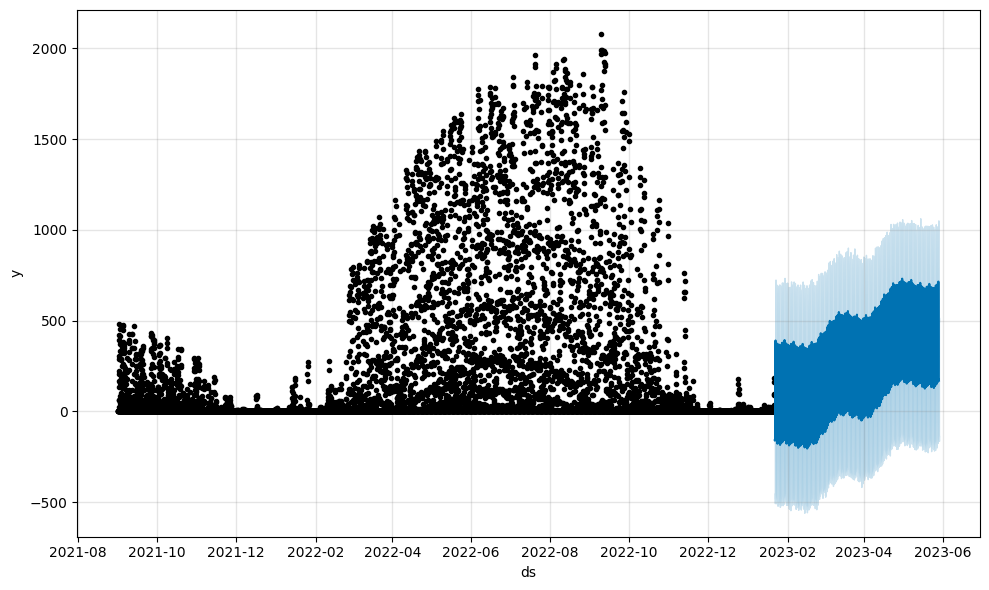

-----------------------------------------------------------------------------------------------------------------
Procesando county: 0, is_business: 0, product_type: 1, is_consumption: 1


17:05:07 - cmdstanpy - INFO - Chain [1] start processing
17:05:12 - cmdstanpy - INFO - Chain [1] done processing


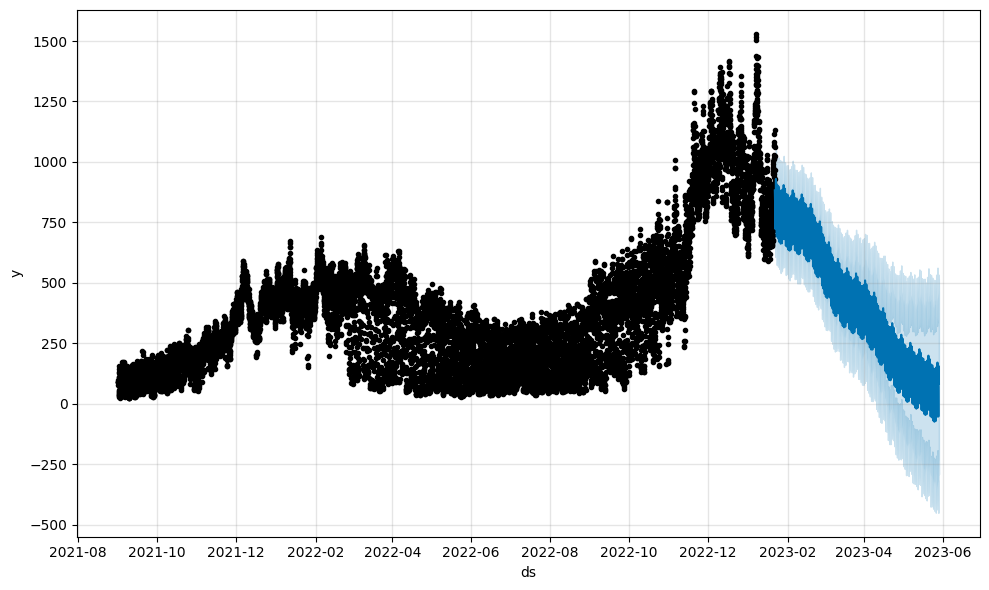

-----------------------------------------------------------------------------------------------------------------
Procesando county: 0, is_business: 0, product_type: 2, is_consumption: 0


17:05:14 - cmdstanpy - INFO - Chain [1] start processing
17:05:15 - cmdstanpy - INFO - Chain [1] done processing


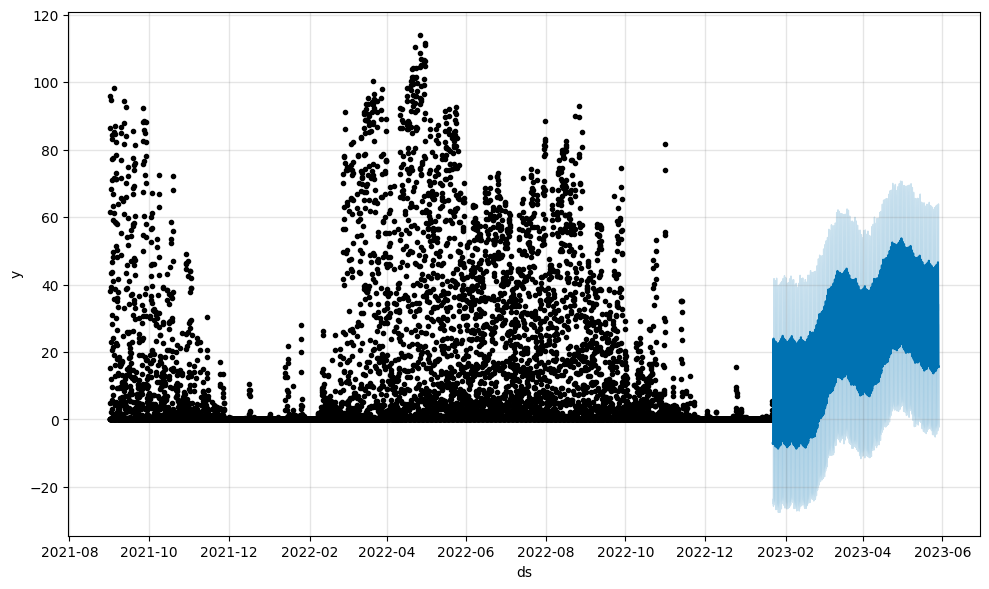

-----------------------------------------------------------------------------------------------------------------
Procesando county: 0, is_business: 0, product_type: 2, is_consumption: 1


17:05:16 - cmdstanpy - INFO - Chain [1] start processing
17:05:18 - cmdstanpy - INFO - Chain [1] done processing


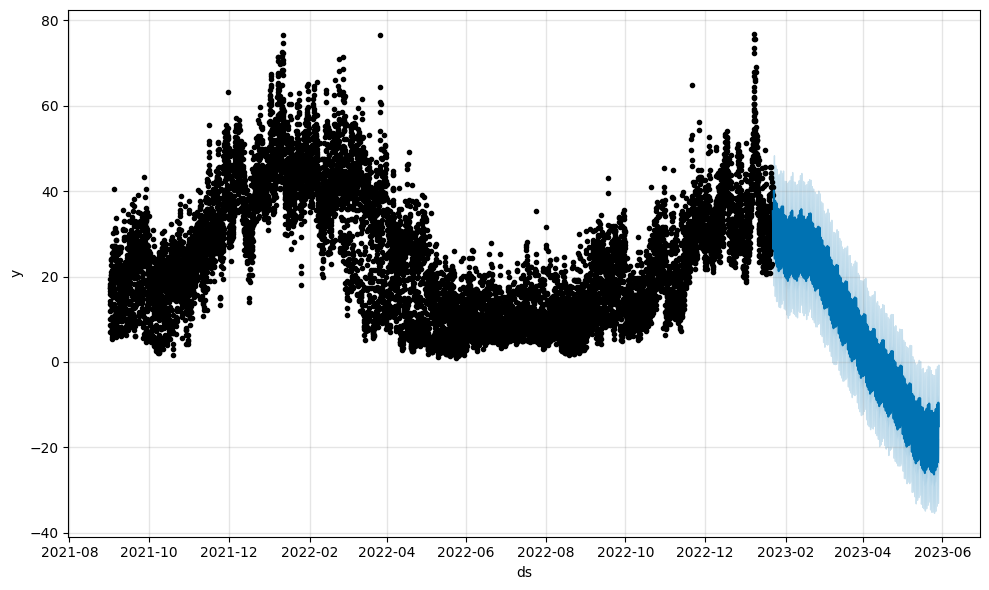

-----------------------------------------------------------------------------------------------------------------
Procesando county: 0, is_business: 0, product_type: 3, is_consumption: 0


17:05:20 - cmdstanpy - INFO - Chain [1] start processing
17:05:21 - cmdstanpy - INFO - Chain [1] done processing


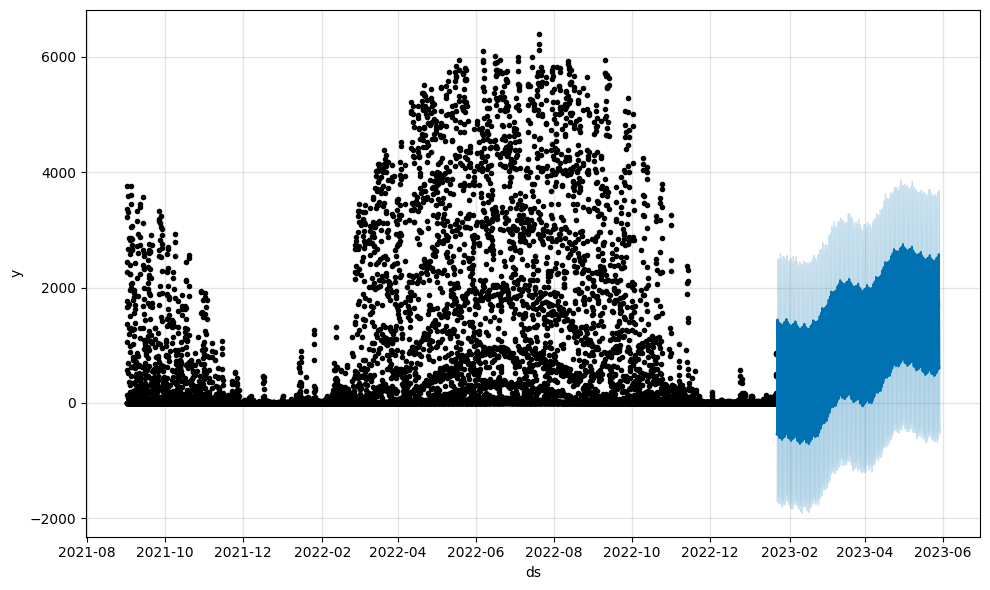

-----------------------------------------------------------------------------------------------------------------
Procesando county: 0, is_business: 0, product_type: 3, is_consumption: 1


17:05:23 - cmdstanpy - INFO - Chain [1] start processing
17:05:25 - cmdstanpy - INFO - Chain [1] done processing


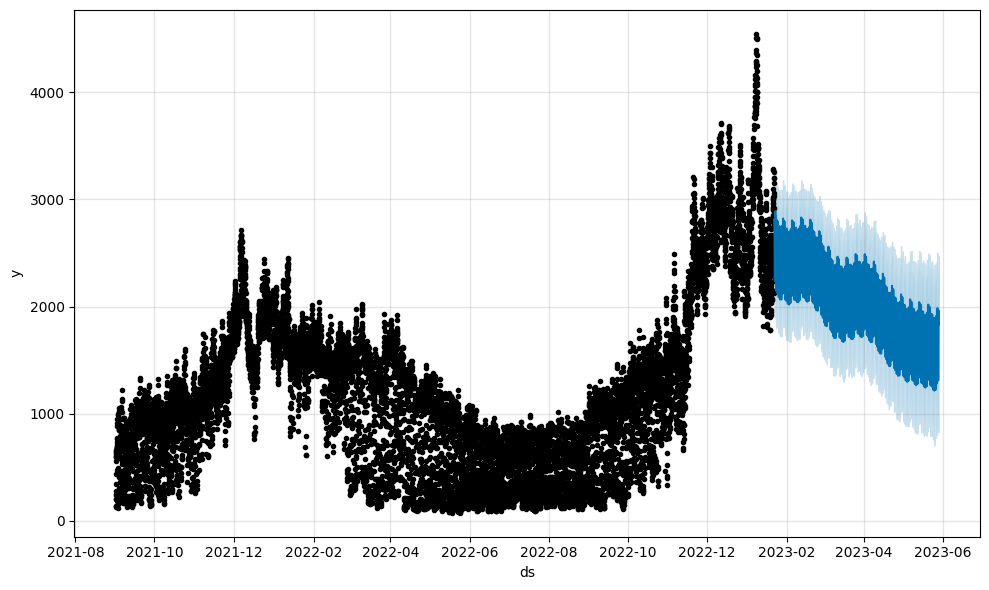

-----------------------------------------------------------------------------------------------------------------
Procesando county: 0, is_business: 1, product_type: 0, is_consumption: 0


17:05:27 - cmdstanpy - INFO - Chain [1] start processing
17:05:28 - cmdstanpy - INFO - Chain [1] done processing


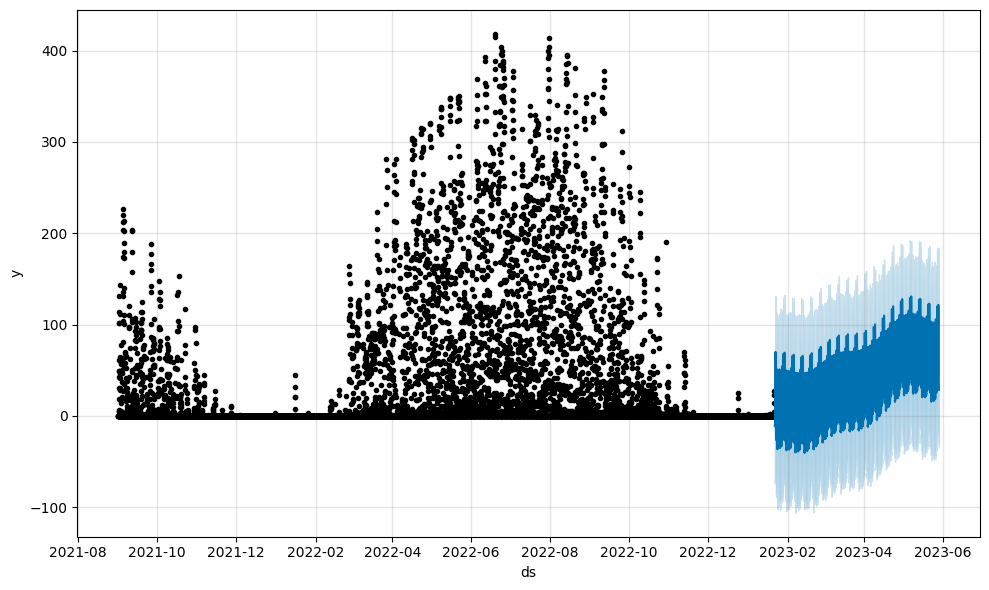

-----------------------------------------------------------------------------------------------------------------
Procesando county: 0, is_business: 1, product_type: 0, is_consumption: 1


17:05:30 - cmdstanpy - INFO - Chain [1] start processing
17:05:36 - cmdstanpy - INFO - Chain [1] done processing


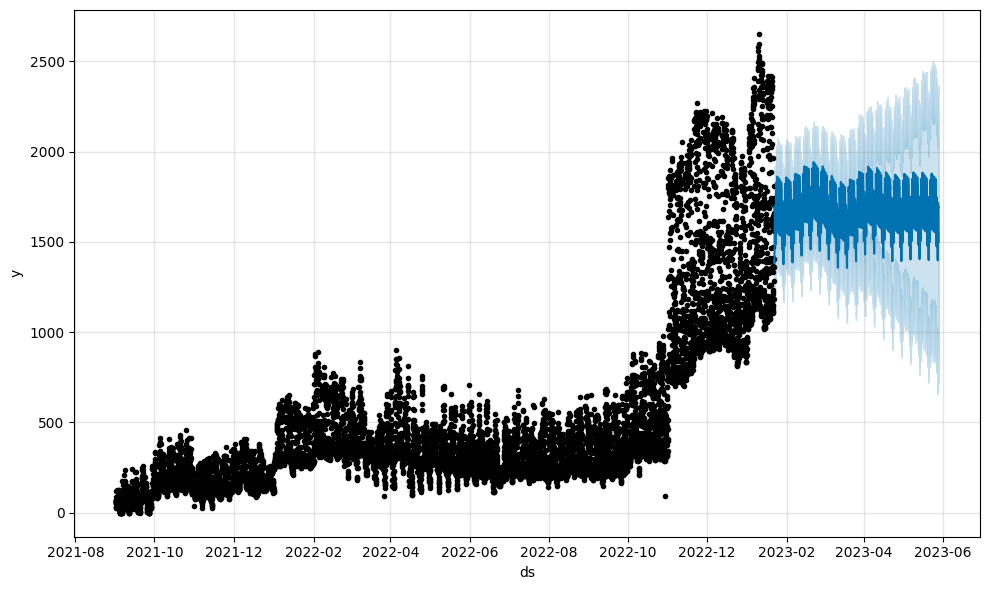

-----------------------------------------------------------------------------------------------------------------
Procesando county: 0, is_business: 1, product_type: 1, is_consumption: 0


17:05:37 - cmdstanpy - INFO - Chain [1] start processing
17:05:38 - cmdstanpy - INFO - Chain [1] done processing


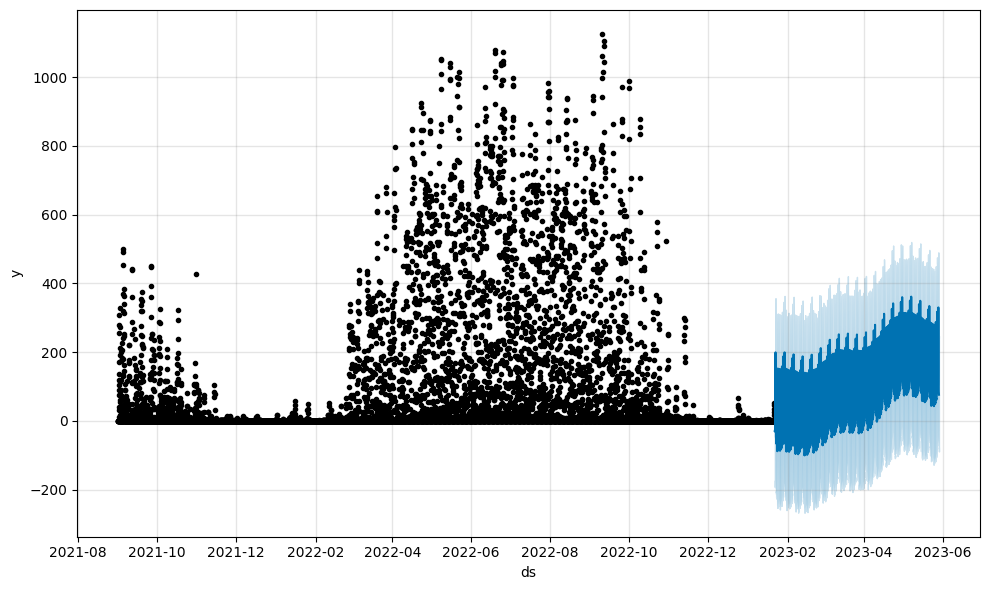

-----------------------------------------------------------------------------------------------------------------
Procesando county: 0, is_business: 1, product_type: 1, is_consumption: 1


17:05:40 - cmdstanpy - INFO - Chain [1] start processing
17:05:42 - cmdstanpy - INFO - Chain [1] done processing


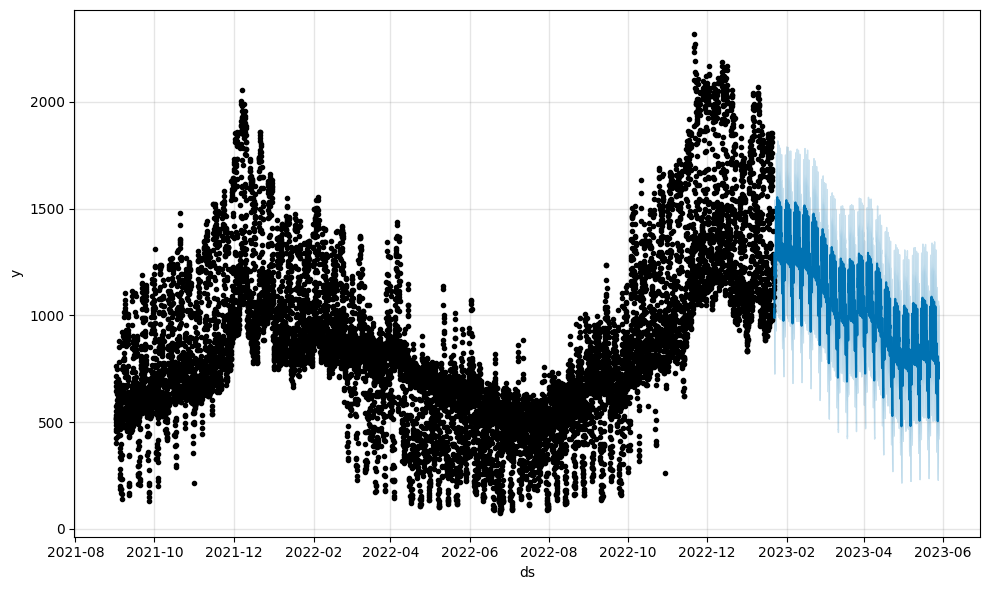

-----------------------------------------------------------------------------------------------------------------
Procesando county: 0, is_business: 1, product_type: 3, is_consumption: 0


17:05:43 - cmdstanpy - INFO - Chain [1] start processing
17:05:44 - cmdstanpy - INFO - Chain [1] done processing


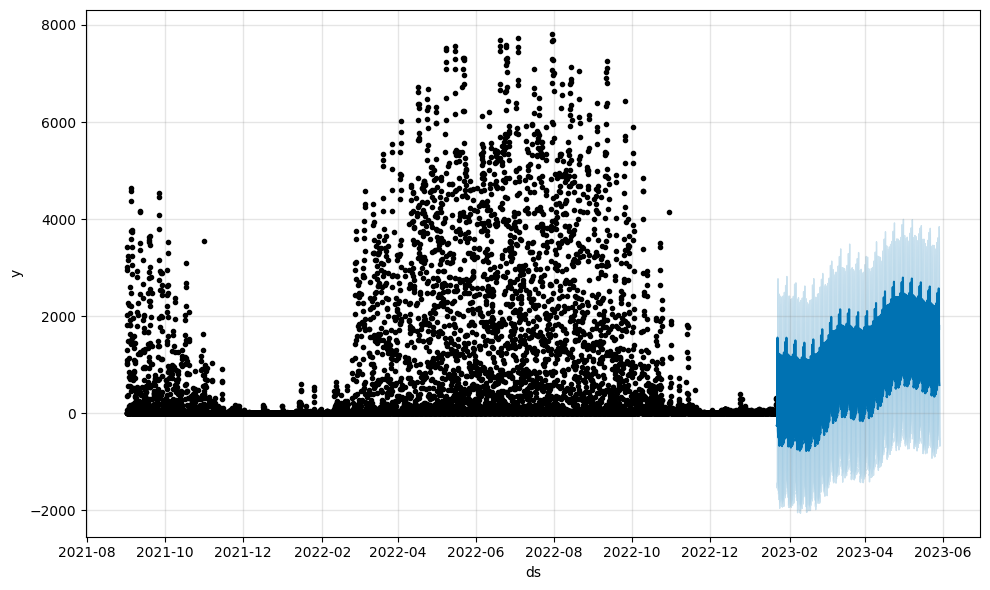

-----------------------------------------------------------------------------------------------------------------
Procesando county: 0, is_business: 1, product_type: 3, is_consumption: 1


17:05:46 - cmdstanpy - INFO - Chain [1] start processing
17:05:49 - cmdstanpy - INFO - Chain [1] done processing


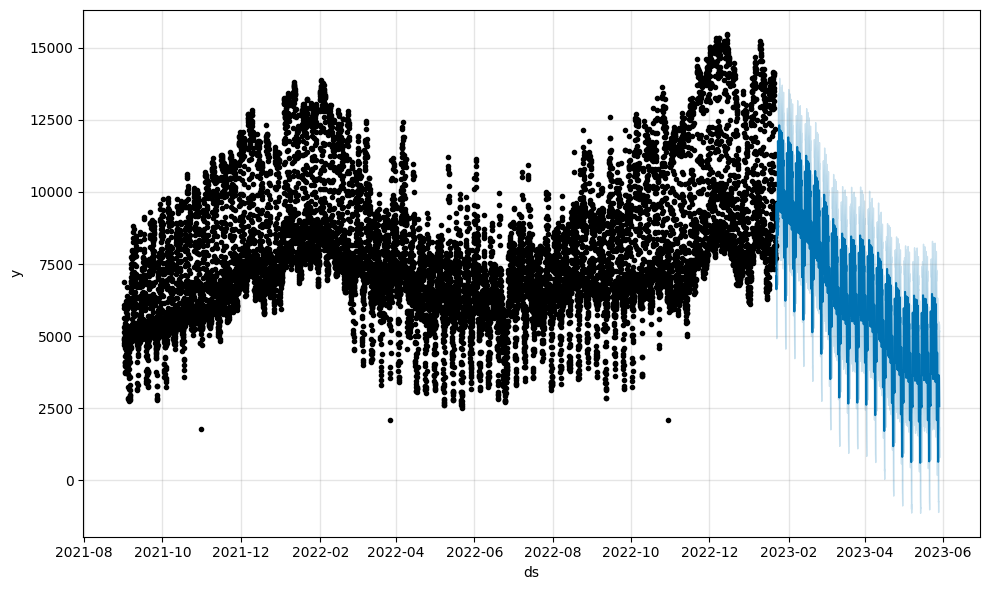

-----------------------------------------------------------------------------------------------------------------
Procesando county: 1, is_business: 0, product_type: 1, is_consumption: 0


17:05:51 - cmdstanpy - INFO - Chain [1] start processing
17:05:52 - cmdstanpy - INFO - Chain [1] done processing


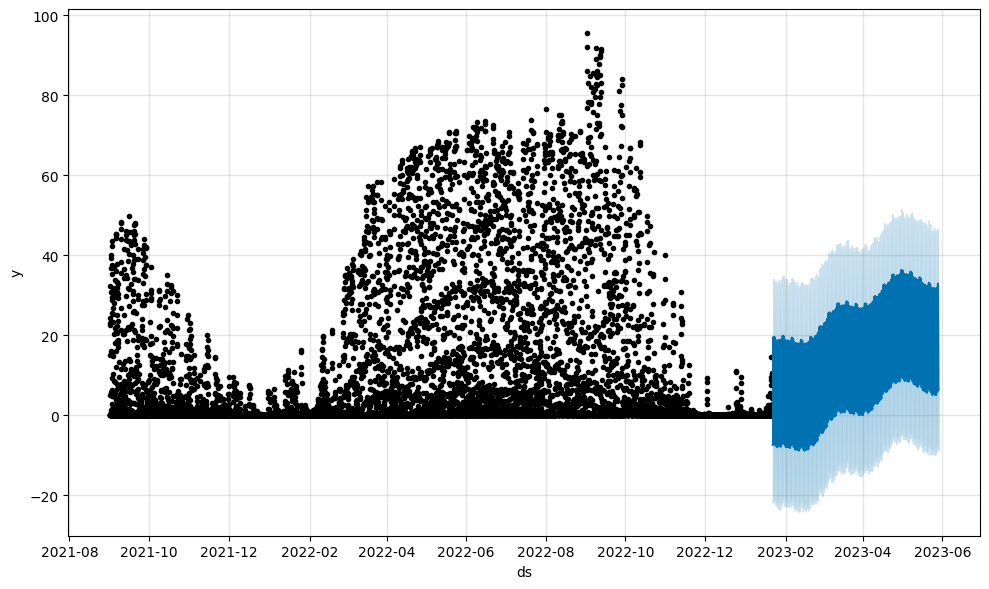

-----------------------------------------------------------------------------------------------------------------
Procesando county: 1, is_business: 0, product_type: 1, is_consumption: 1


17:05:54 - cmdstanpy - INFO - Chain [1] start processing
17:05:57 - cmdstanpy - INFO - Chain [1] done processing


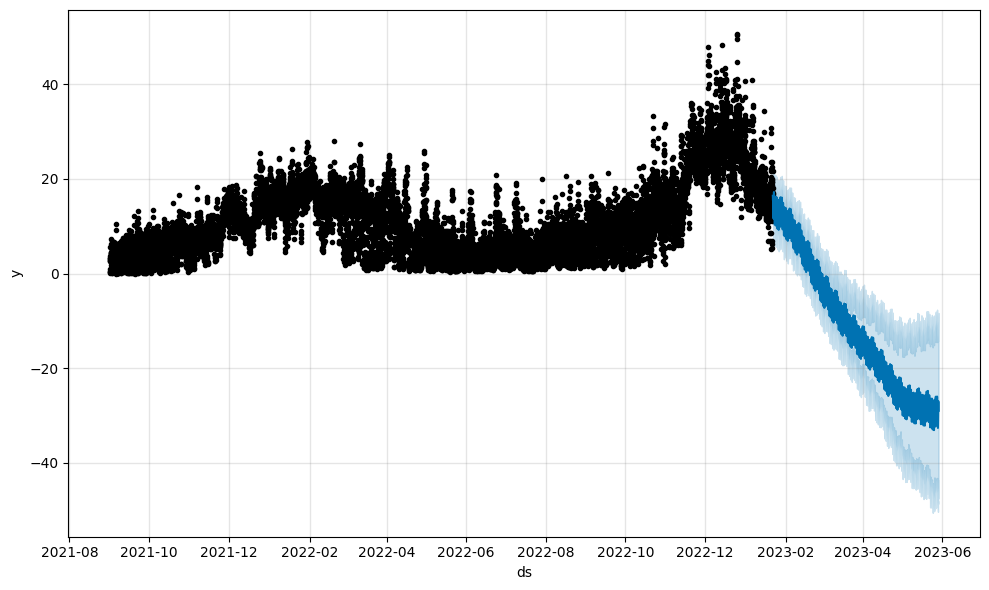

-----------------------------------------------------------------------------------------------------------------
Procesando county: 1, is_business: 0, product_type: 3, is_consumption: 0


17:05:59 - cmdstanpy - INFO - Chain [1] start processing
17:06:00 - cmdstanpy - INFO - Chain [1] done processing


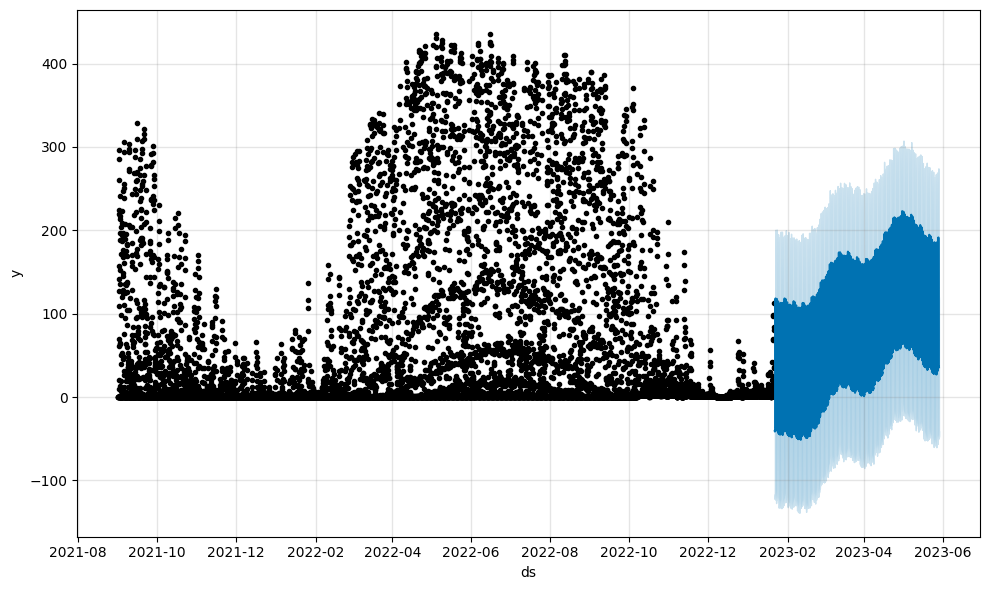

-----------------------------------------------------------------------------------------------------------------
Procesando county: 1, is_business: 0, product_type: 3, is_consumption: 1


17:06:01 - cmdstanpy - INFO - Chain [1] start processing
17:06:05 - cmdstanpy - INFO - Chain [1] done processing


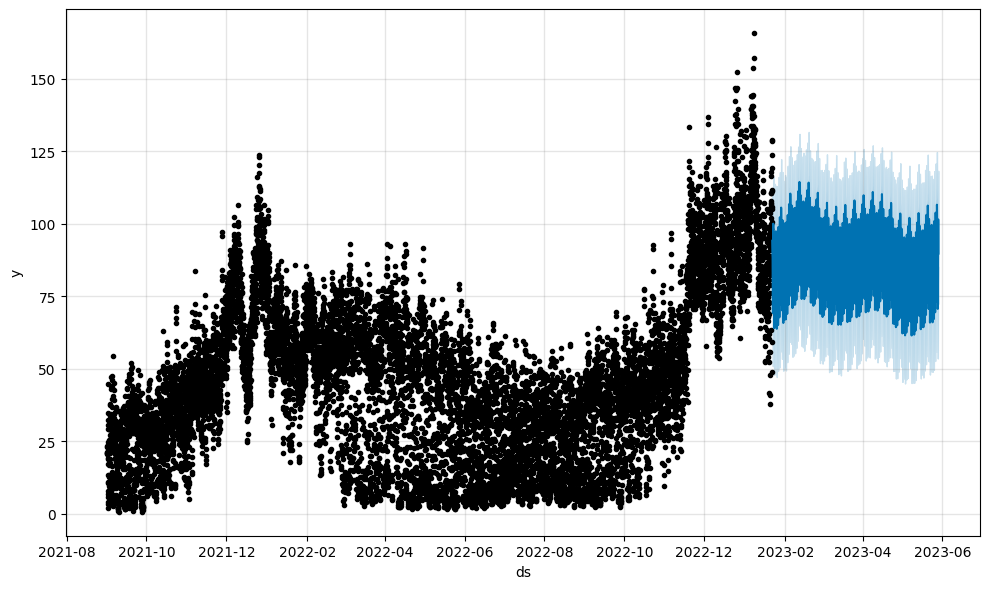

-----------------------------------------------------------------------------------------------------------------
Procesando county: 1, is_business: 1, product_type: 3, is_consumption: 0


17:06:07 - cmdstanpy - INFO - Chain [1] start processing
17:06:07 - cmdstanpy - INFO - Chain [1] done processing


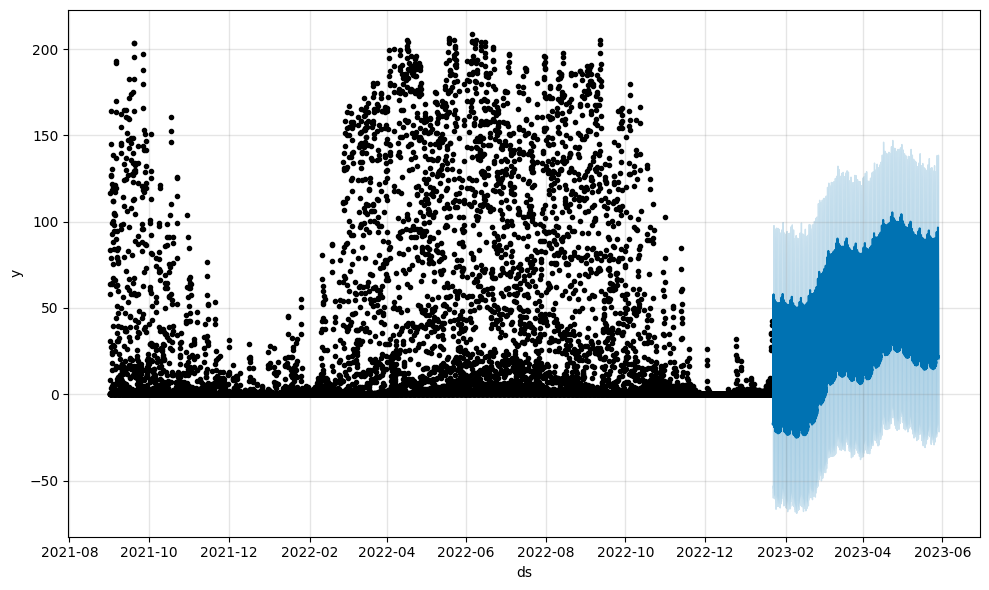

-----------------------------------------------------------------------------------------------------------------
Procesando county: 1, is_business: 1, product_type: 3, is_consumption: 1


17:06:09 - cmdstanpy - INFO - Chain [1] start processing
17:06:12 - cmdstanpy - INFO - Chain [1] done processing


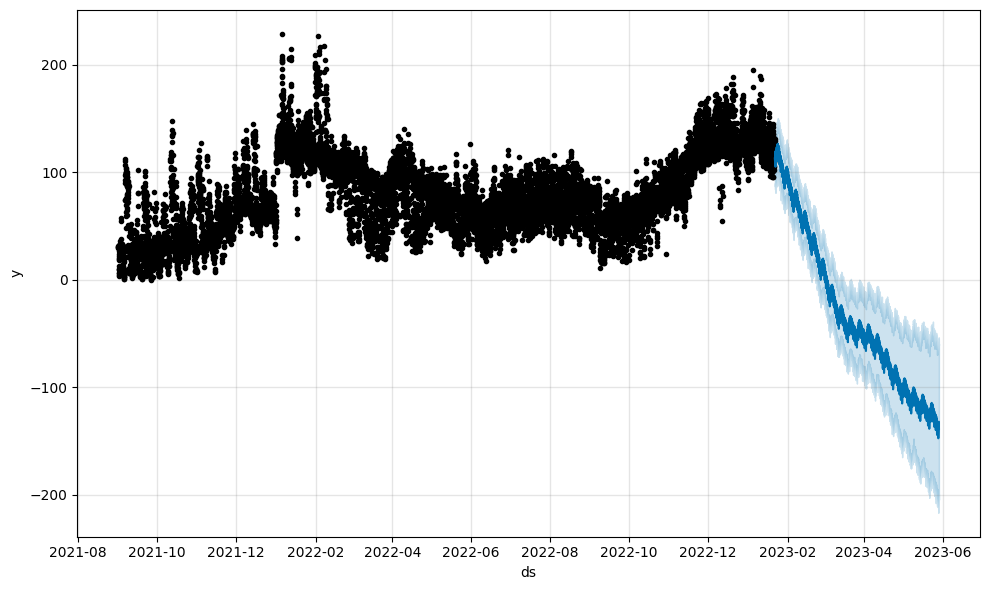

-----------------------------------------------------------------------------------------------------------------
Procesando county: 2, is_business: 0, product_type: 3, is_consumption: 0


17:06:14 - cmdstanpy - INFO - Chain [1] start processing
17:06:15 - cmdstanpy - INFO - Chain [1] done processing


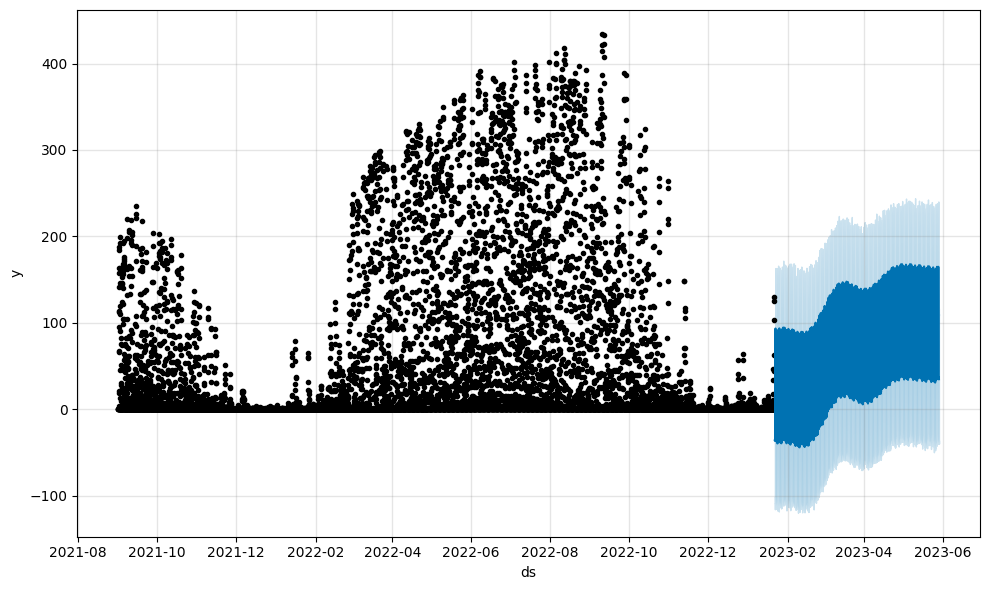

-----------------------------------------------------------------------------------------------------------------
Procesando county: 2, is_business: 0, product_type: 3, is_consumption: 1


17:06:17 - cmdstanpy - INFO - Chain [1] start processing
17:06:19 - cmdstanpy - INFO - Chain [1] done processing


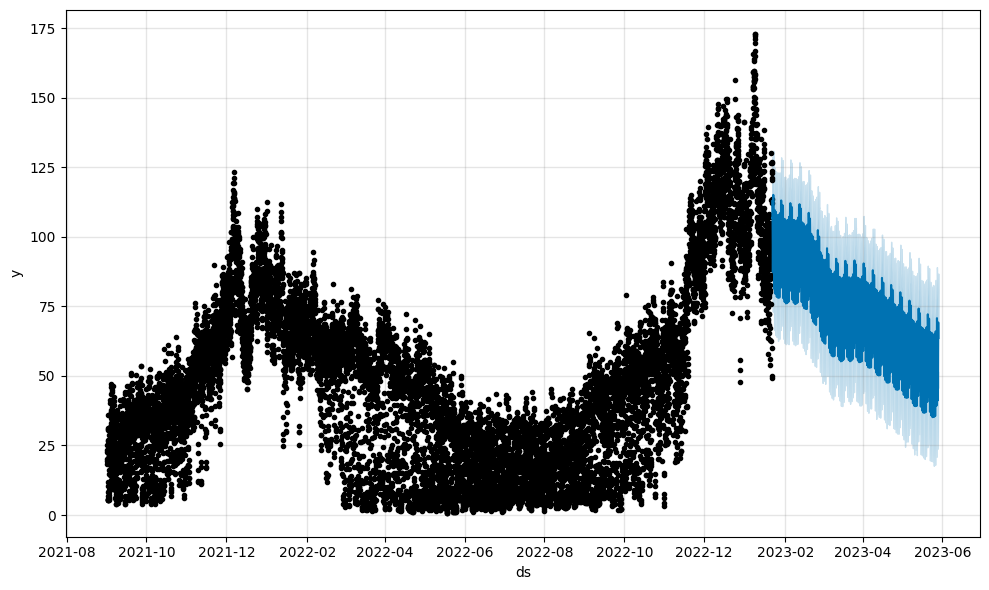

-----------------------------------------------------------------------------------------------------------------
Procesando county: 2, is_business: 1, product_type: 3, is_consumption: 0


17:06:21 - cmdstanpy - INFO - Chain [1] start processing
17:06:21 - cmdstanpy - INFO - Chain [1] done processing


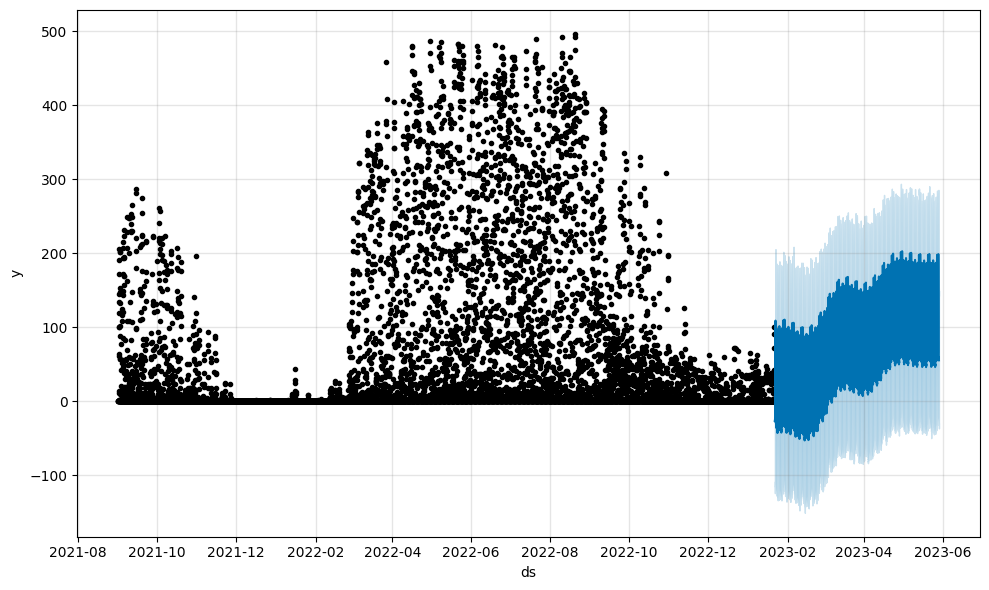

-----------------------------------------------------------------------------------------------------------------
Procesando county: 2, is_business: 1, product_type: 3, is_consumption: 1


17:06:23 - cmdstanpy - INFO - Chain [1] start processing
17:06:25 - cmdstanpy - INFO - Chain [1] done processing


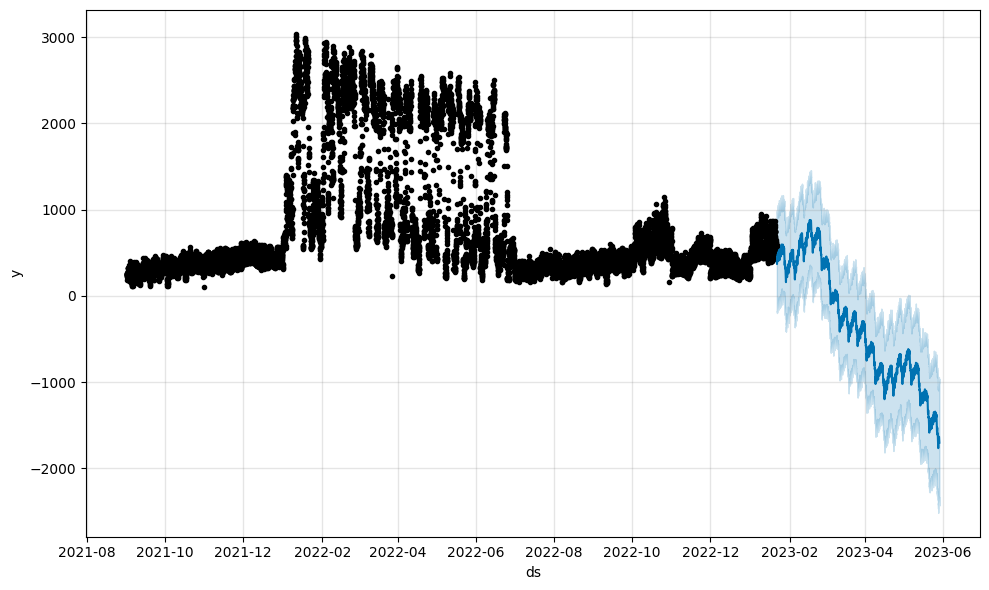

-----------------------------------------------------------------------------------------------------------------
Procesando county: 3, is_business: 0, product_type: 1, is_consumption: 0


17:06:26 - cmdstanpy - INFO - Chain [1] start processing
17:06:27 - cmdstanpy - INFO - Chain [1] done processing


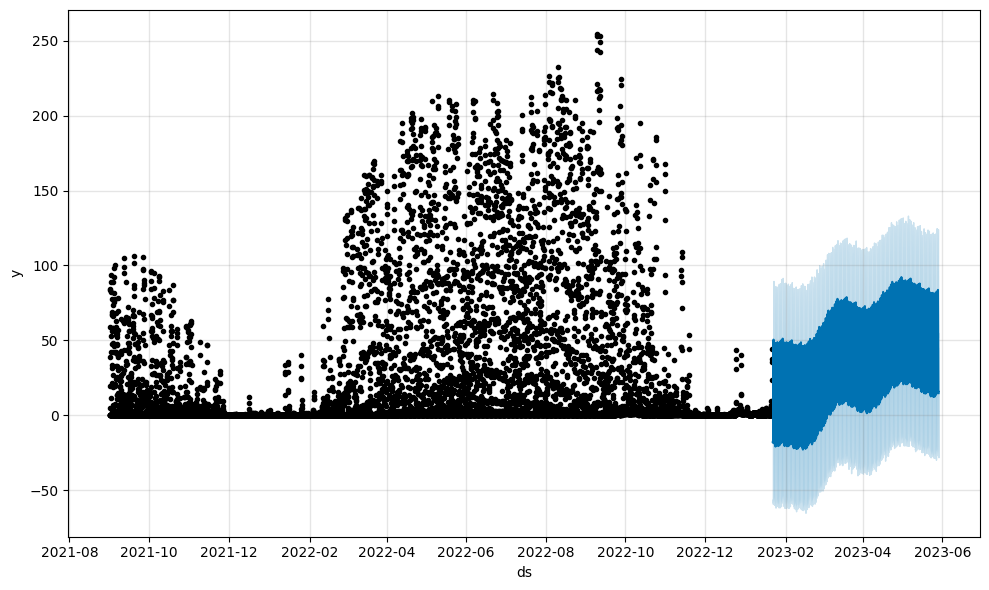

-----------------------------------------------------------------------------------------------------------------
Procesando county: 3, is_business: 0, product_type: 1, is_consumption: 1


17:06:29 - cmdstanpy - INFO - Chain [1] start processing
17:06:32 - cmdstanpy - INFO - Chain [1] done processing


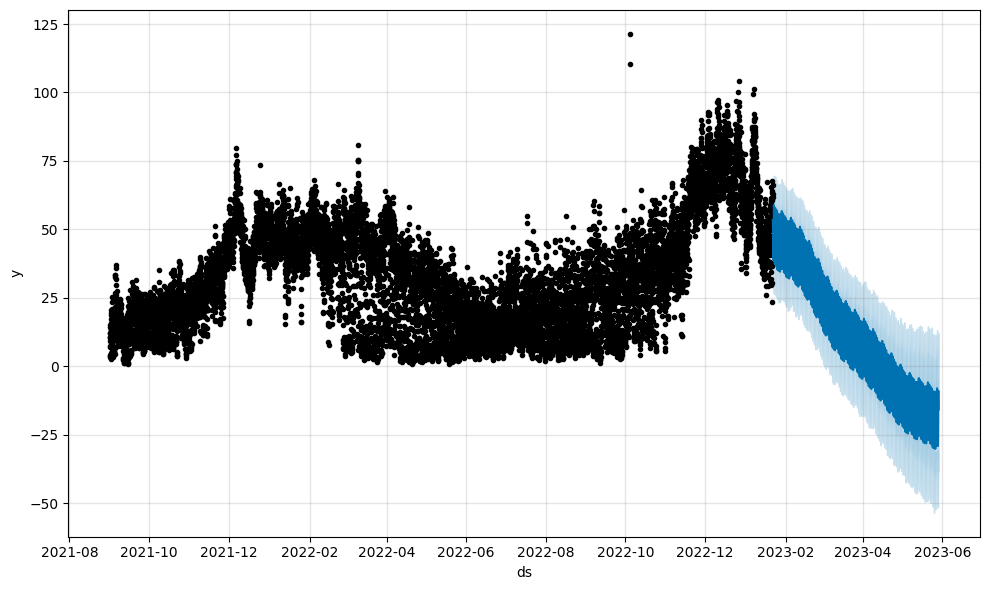

-----------------------------------------------------------------------------------------------------------------
Procesando county: 3, is_business: 0, product_type: 3, is_consumption: 0


17:06:33 - cmdstanpy - INFO - Chain [1] start processing
17:06:35 - cmdstanpy - INFO - Chain [1] done processing


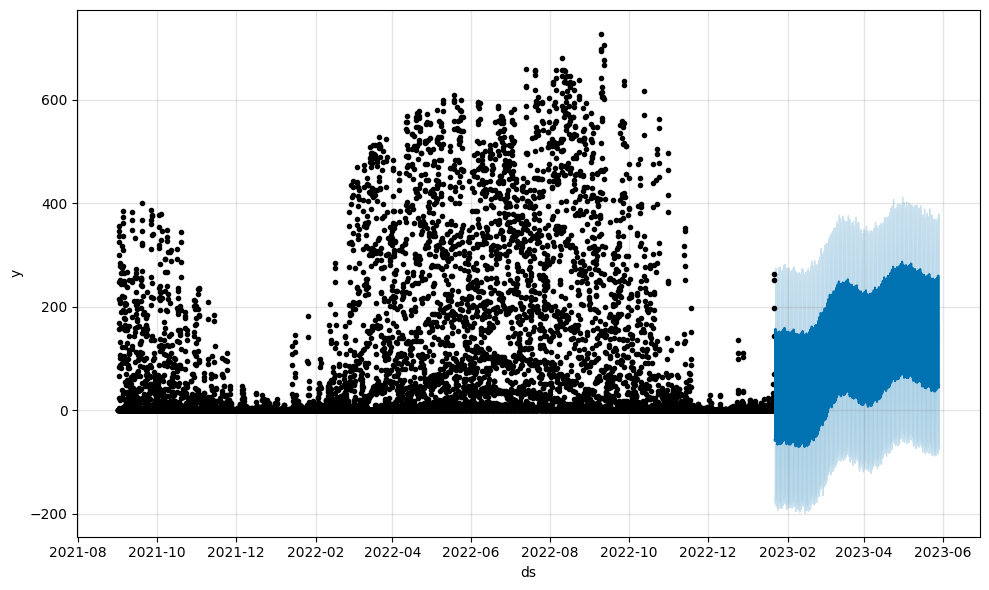

-----------------------------------------------------------------------------------------------------------------
Procesando county: 3, is_business: 0, product_type: 3, is_consumption: 1


17:06:36 - cmdstanpy - INFO - Chain [1] start processing
17:06:39 - cmdstanpy - INFO - Chain [1] done processing


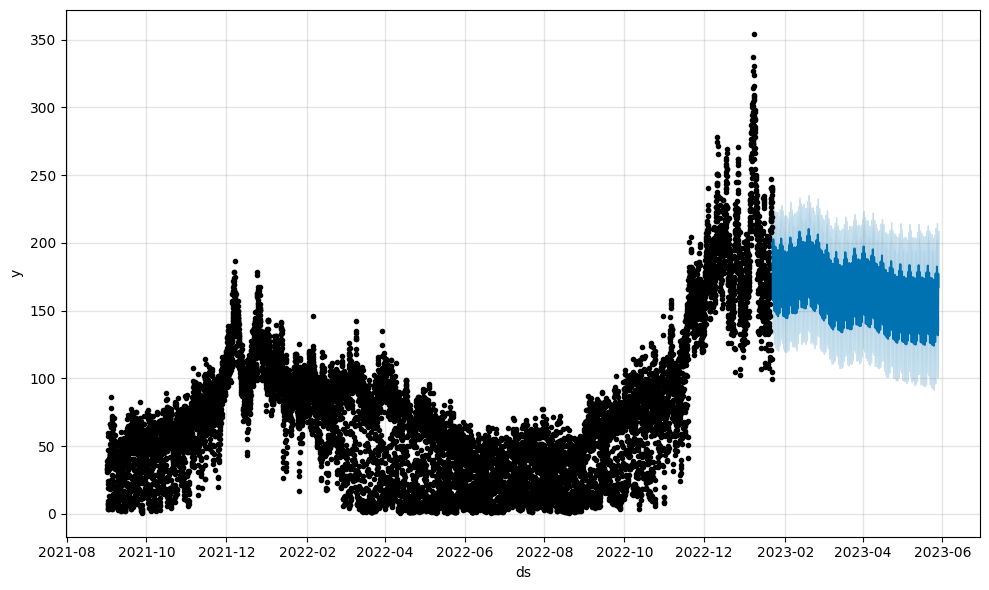

-----------------------------------------------------------------------------------------------------------------
Procesando county: 3, is_business: 1, product_type: 1, is_consumption: 0


17:06:41 - cmdstanpy - INFO - Chain [1] start processing
17:06:41 - cmdstanpy - INFO - Chain [1] done processing


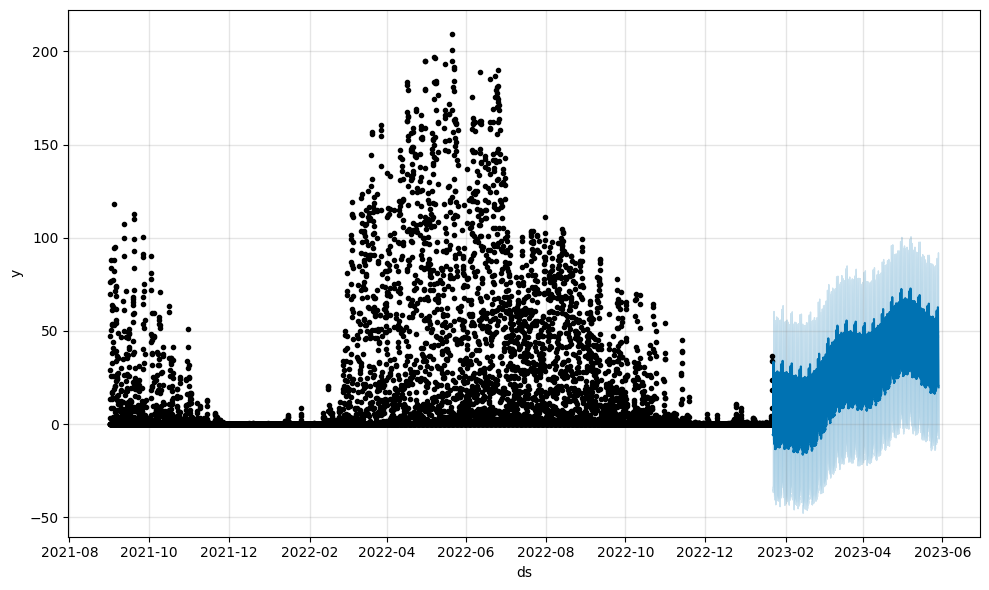

-----------------------------------------------------------------------------------------------------------------
Procesando county: 3, is_business: 1, product_type: 1, is_consumption: 1


17:06:43 - cmdstanpy - INFO - Chain [1] start processing
17:06:45 - cmdstanpy - INFO - Chain [1] done processing


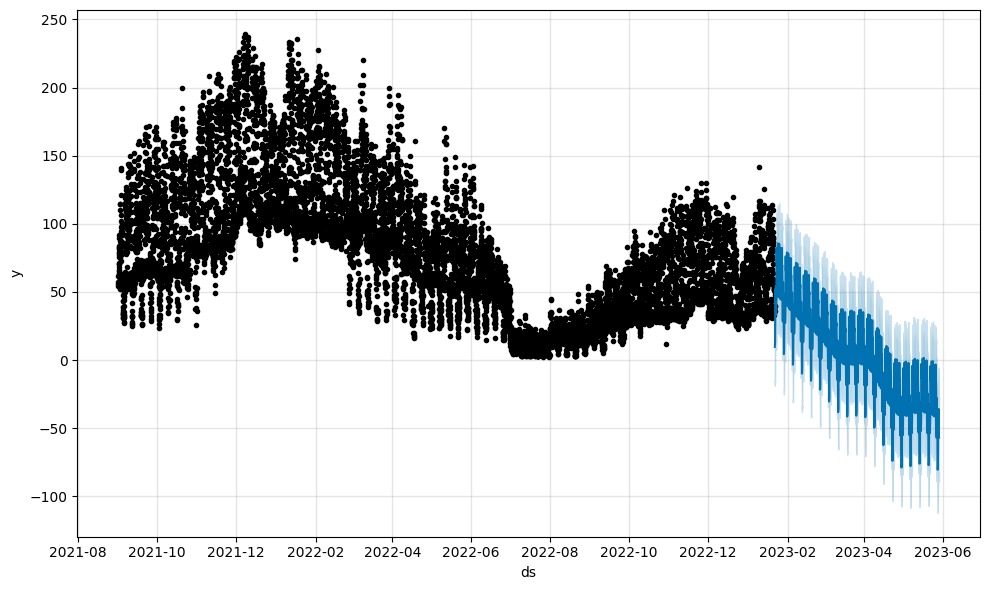

-----------------------------------------------------------------------------------------------------------------
Procesando county: 3, is_business: 1, product_type: 3, is_consumption: 0


17:06:47 - cmdstanpy - INFO - Chain [1] start processing
17:06:48 - cmdstanpy - INFO - Chain [1] done processing


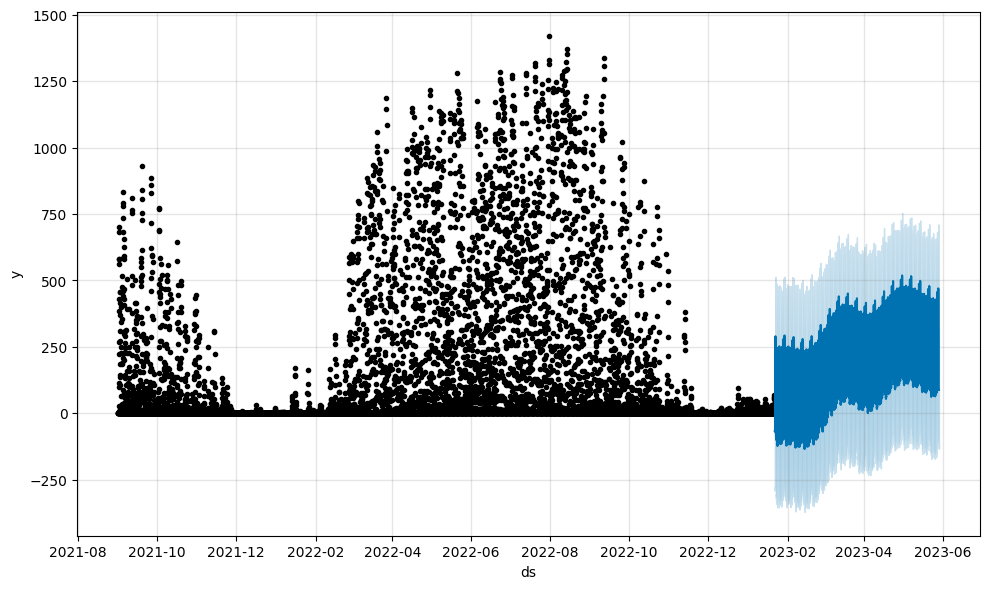

-----------------------------------------------------------------------------------------------------------------
Procesando county: 3, is_business: 1, product_type: 3, is_consumption: 1


17:06:50 - cmdstanpy - INFO - Chain [1] start processing
17:06:51 - cmdstanpy - INFO - Chain [1] done processing


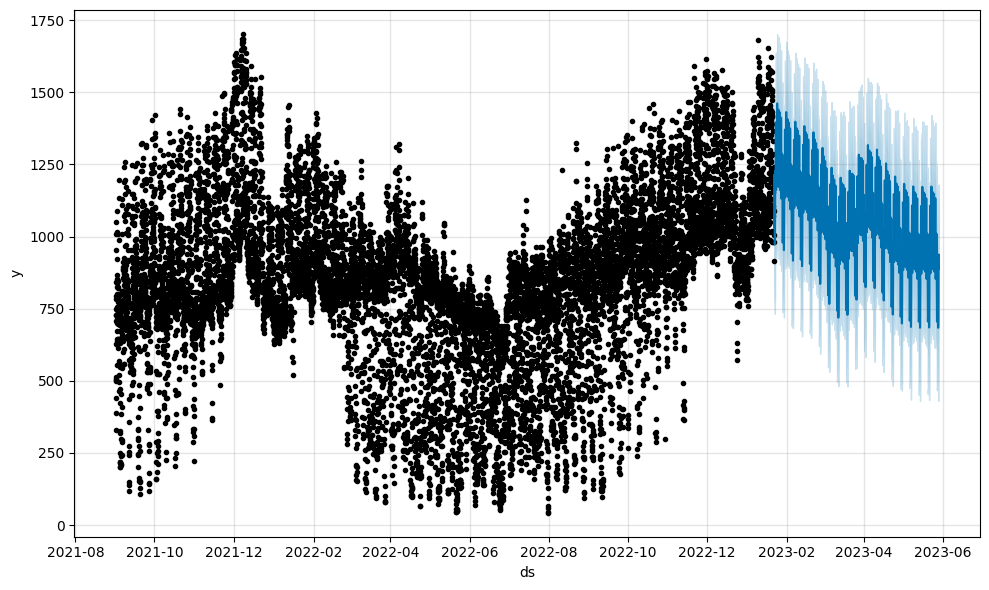

-----------------------------------------------------------------------------------------------------------------
Procesando county: 4, is_business: 0, product_type: 1, is_consumption: 0


17:06:53 - cmdstanpy - INFO - Chain [1] start processing
17:06:54 - cmdstanpy - INFO - Chain [1] done processing


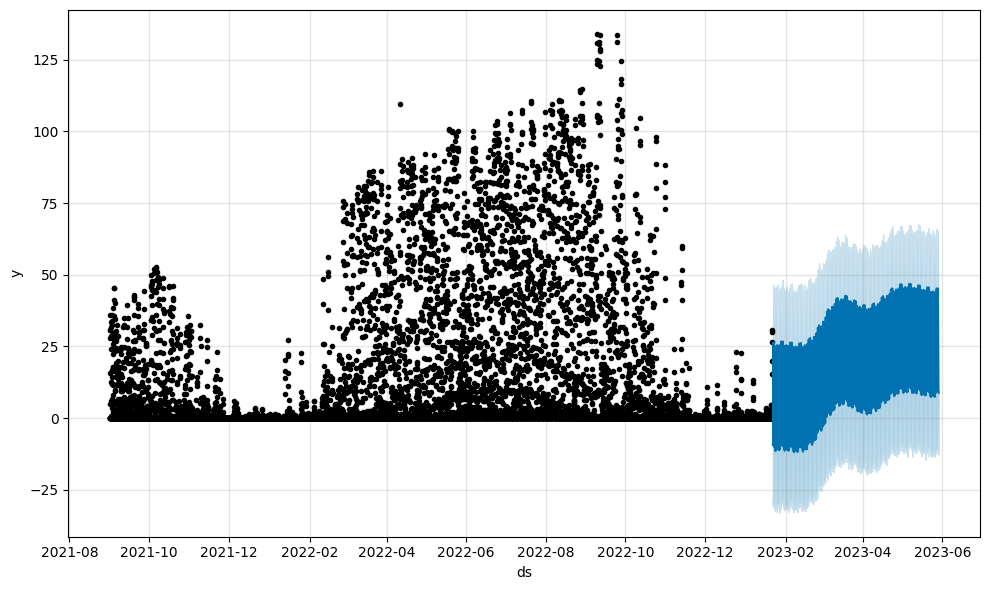

-----------------------------------------------------------------------------------------------------------------
Procesando county: 4, is_business: 0, product_type: 1, is_consumption: 1


17:06:55 - cmdstanpy - INFO - Chain [1] start processing
17:07:01 - cmdstanpy - INFO - Chain [1] done processing


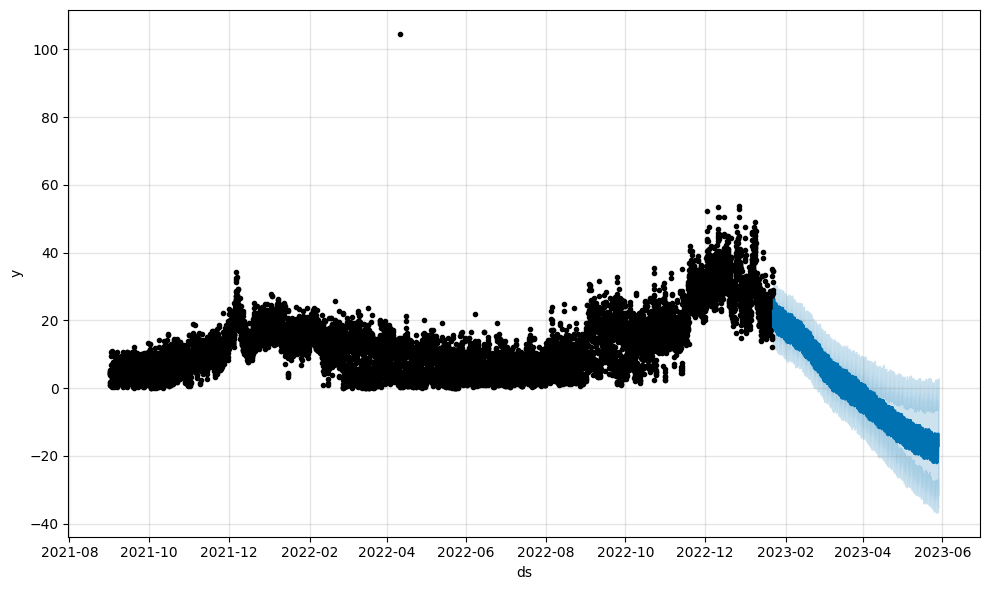

-----------------------------------------------------------------------------------------------------------------
Procesando county: 4, is_business: 0, product_type: 3, is_consumption: 0


17:07:02 - cmdstanpy - INFO - Chain [1] start processing
17:07:03 - cmdstanpy - INFO - Chain [1] done processing


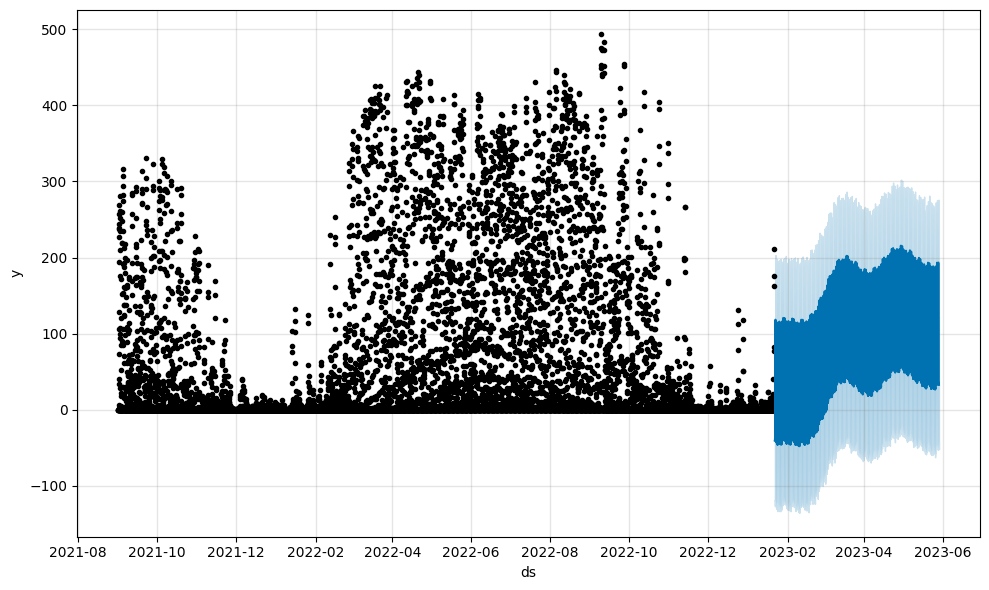

-----------------------------------------------------------------------------------------------------------------
Procesando county: 4, is_business: 0, product_type: 3, is_consumption: 1


17:07:05 - cmdstanpy - INFO - Chain [1] start processing
17:07:10 - cmdstanpy - INFO - Chain [1] done processing


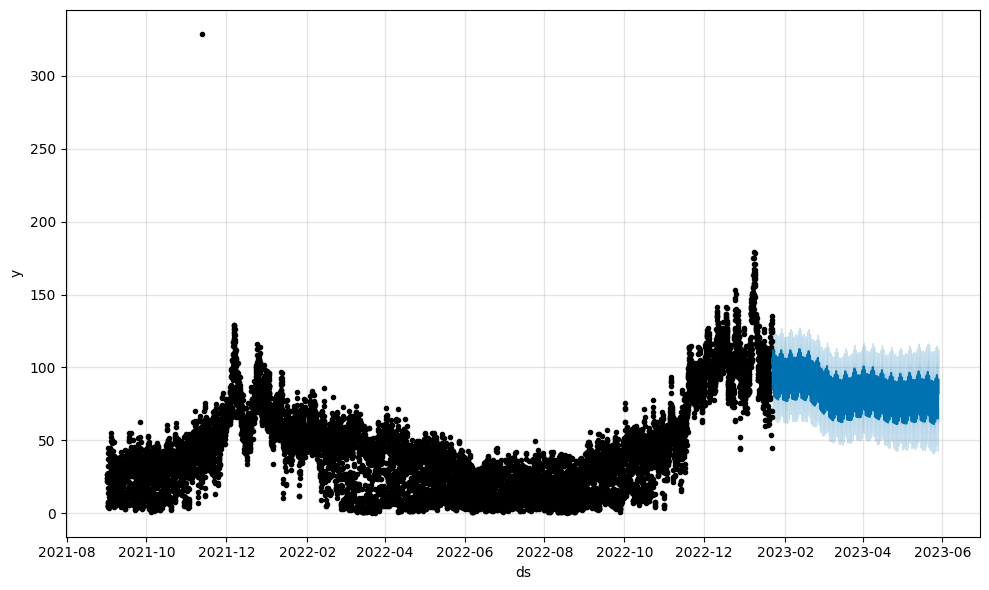

-----------------------------------------------------------------------------------------------------------------
Procesando county: 4, is_business: 1, product_type: 0, is_consumption: 0


17:07:11 - cmdstanpy - INFO - Chain [1] start processing
17:07:13 - cmdstanpy - INFO - Chain [1] done processing


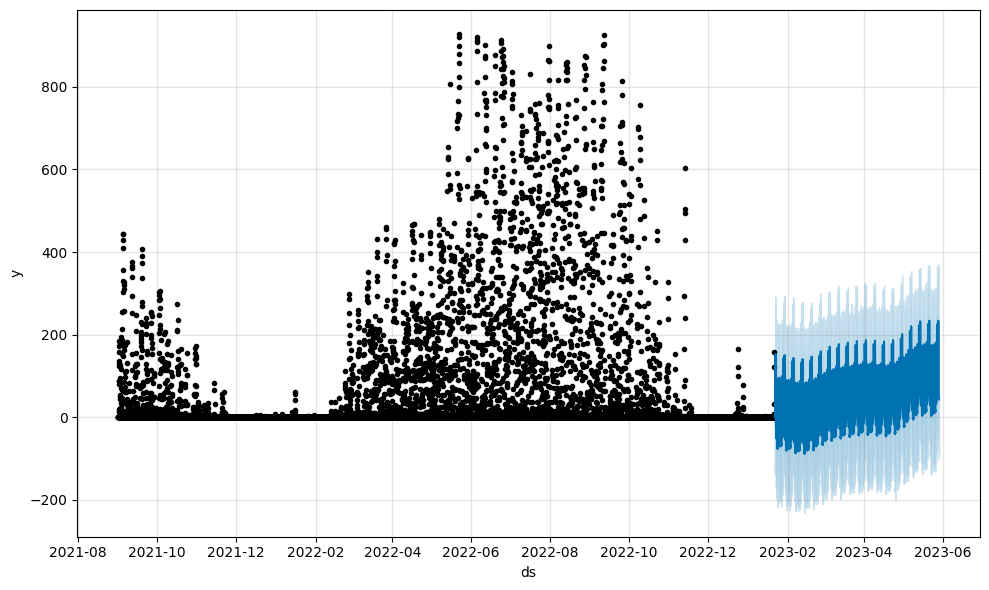

-----------------------------------------------------------------------------------------------------------------
Procesando county: 4, is_business: 1, product_type: 0, is_consumption: 1


17:07:14 - cmdstanpy - INFO - Chain [1] start processing
17:07:16 - cmdstanpy - INFO - Chain [1] done processing


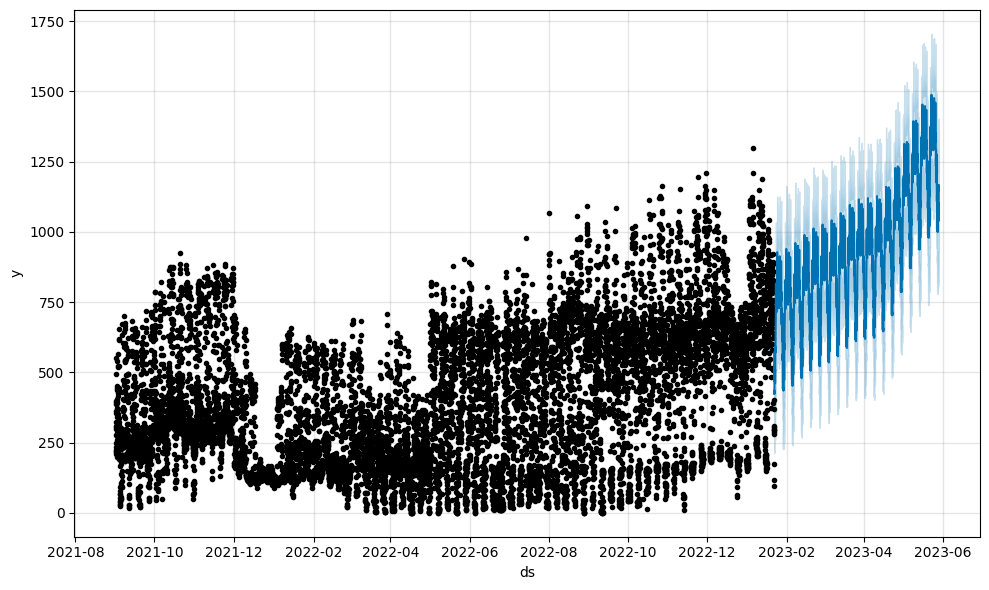

-----------------------------------------------------------------------------------------------------------------
Procesando county: 4, is_business: 1, product_type: 3, is_consumption: 0


17:07:18 - cmdstanpy - INFO - Chain [1] start processing
17:07:18 - cmdstanpy - INFO - Chain [1] done processing


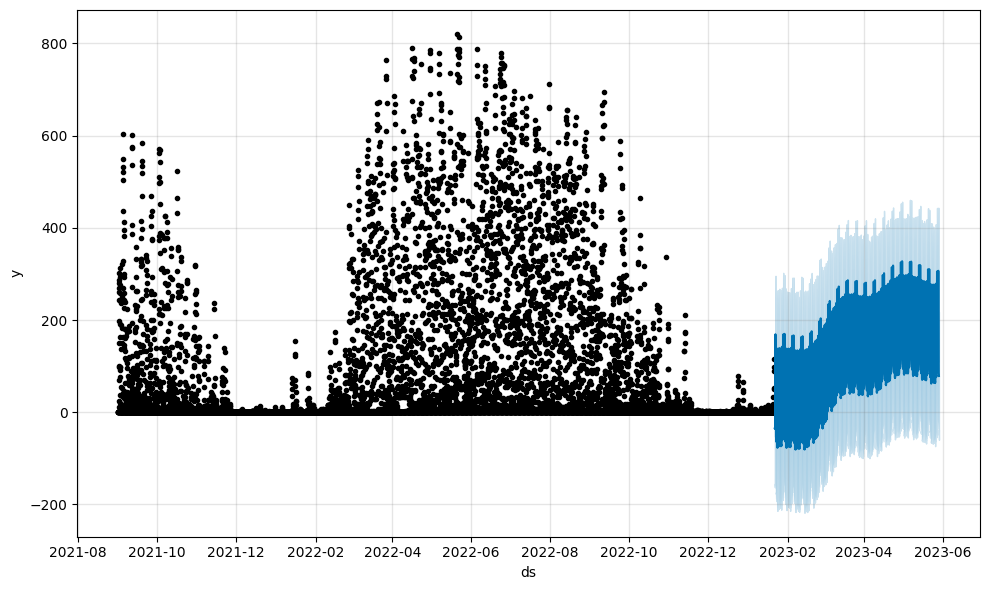

-----------------------------------------------------------------------------------------------------------------
Procesando county: 4, is_business: 1, product_type: 3, is_consumption: 1


17:07:20 - cmdstanpy - INFO - Chain [1] start processing
17:07:21 - cmdstanpy - INFO - Chain [1] done processing


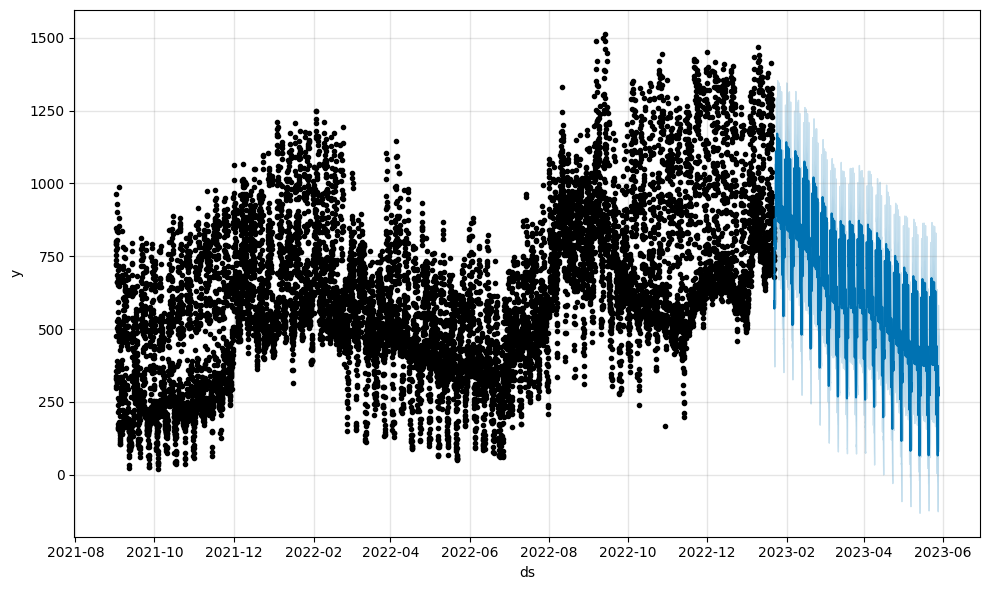

-----------------------------------------------------------------------------------------------------------------
Procesando county: 5, is_business: 0, product_type: 1, is_consumption: 0


17:07:23 - cmdstanpy - INFO - Chain [1] start processing
17:07:24 - cmdstanpy - INFO - Chain [1] done processing


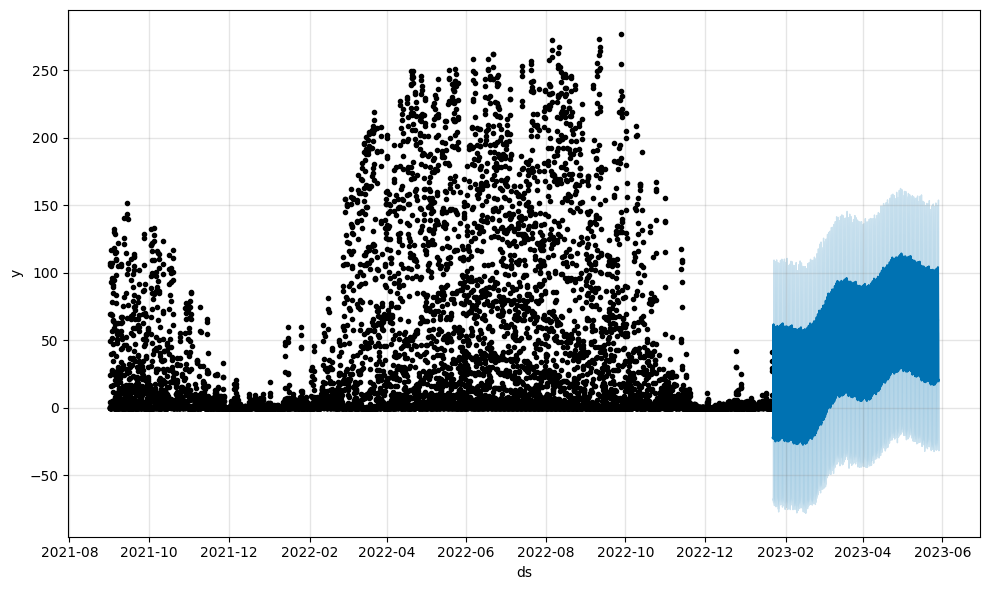

-----------------------------------------------------------------------------------------------------------------
Procesando county: 5, is_business: 0, product_type: 1, is_consumption: 1


17:07:26 - cmdstanpy - INFO - Chain [1] start processing
17:07:29 - cmdstanpy - INFO - Chain [1] done processing


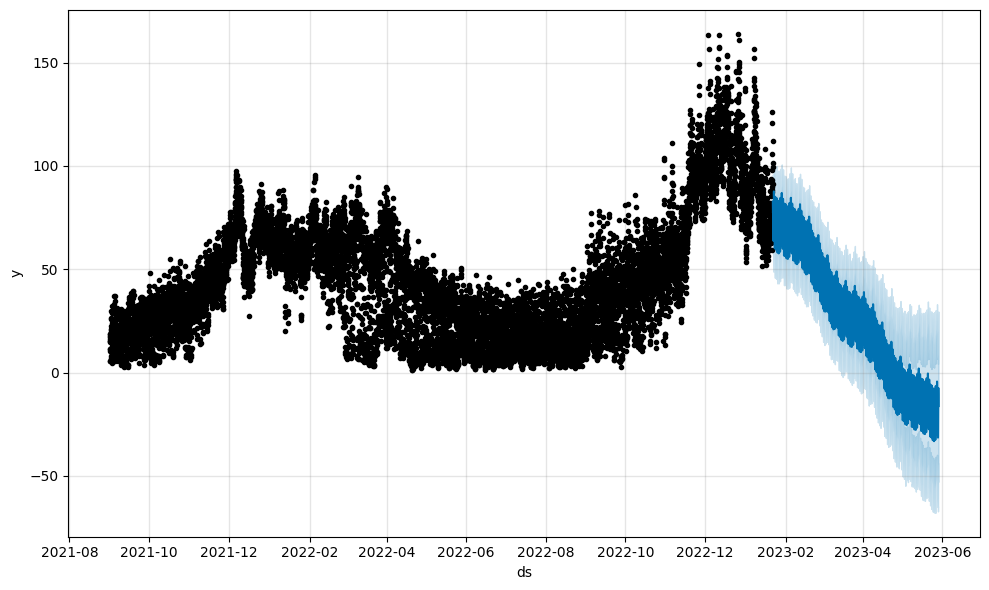

-----------------------------------------------------------------------------------------------------------------
Procesando county: 5, is_business: 0, product_type: 3, is_consumption: 0


17:07:31 - cmdstanpy - INFO - Chain [1] start processing
17:07:32 - cmdstanpy - INFO - Chain [1] done processing


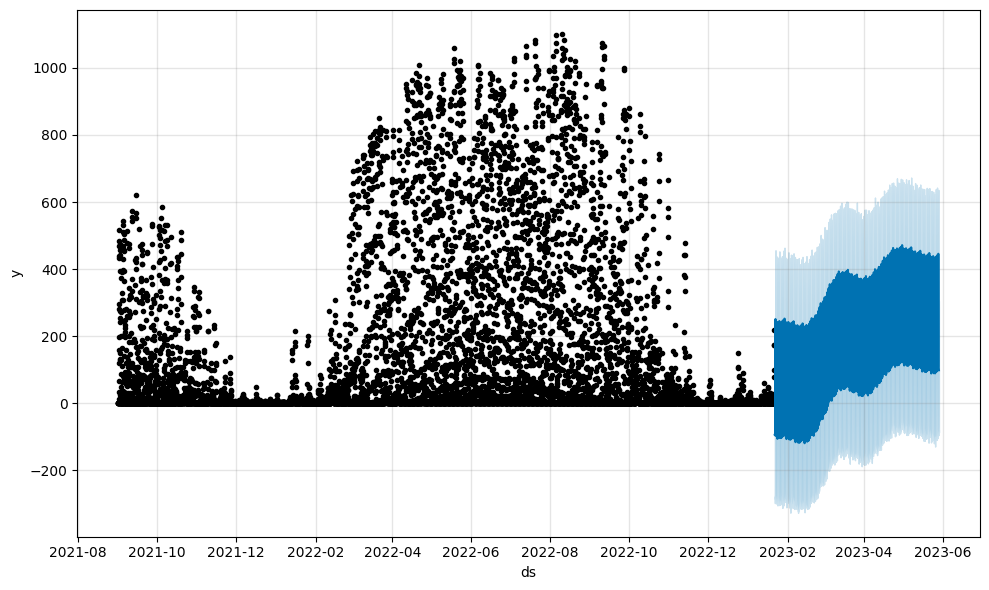

-----------------------------------------------------------------------------------------------------------------
Procesando county: 5, is_business: 0, product_type: 3, is_consumption: 1


17:07:33 - cmdstanpy - INFO - Chain [1] start processing
17:07:37 - cmdstanpy - INFO - Chain [1] done processing


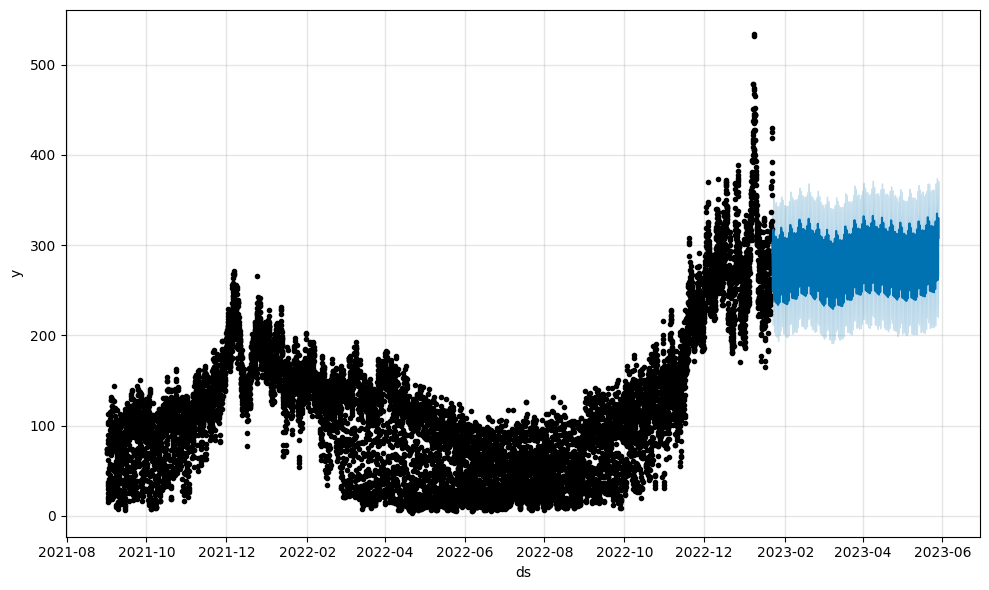

-----------------------------------------------------------------------------------------------------------------
Procesando county: 5, is_business: 1, product_type: 1, is_consumption: 0


17:07:39 - cmdstanpy - INFO - Chain [1] start processing
17:07:40 - cmdstanpy - INFO - Chain [1] done processing


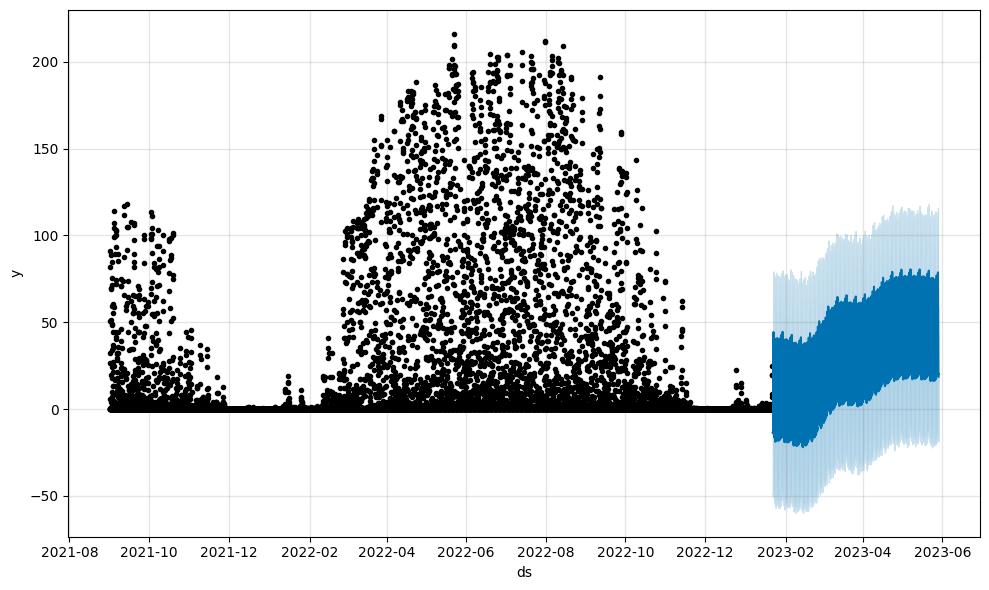

-----------------------------------------------------------------------------------------------------------------
Procesando county: 5, is_business: 1, product_type: 1, is_consumption: 1


17:07:41 - cmdstanpy - INFO - Chain [1] start processing
17:07:42 - cmdstanpy - INFO - Chain [1] done processing


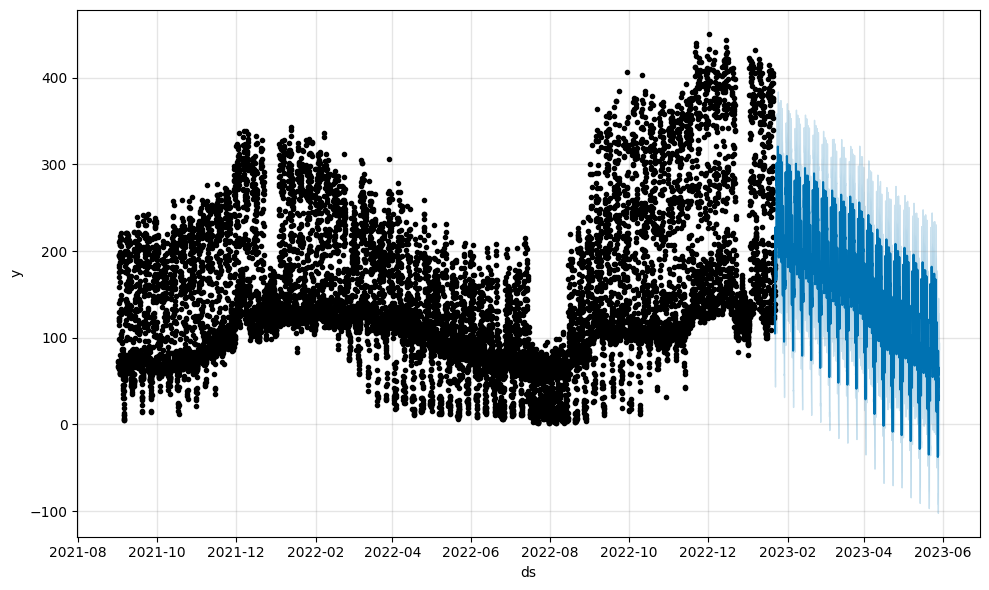

-----------------------------------------------------------------------------------------------------------------
Procesando county: 5, is_business: 1, product_type: 3, is_consumption: 0


17:07:44 - cmdstanpy - INFO - Chain [1] start processing
17:07:45 - cmdstanpy - INFO - Chain [1] done processing


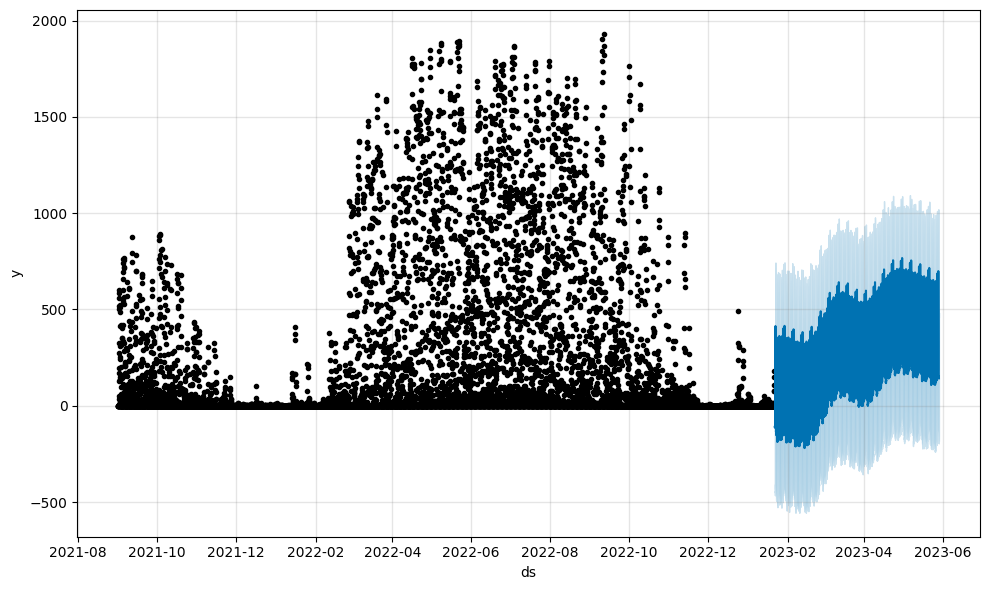

-----------------------------------------------------------------------------------------------------------------
Procesando county: 5, is_business: 1, product_type: 3, is_consumption: 1


17:07:47 - cmdstanpy - INFO - Chain [1] start processing
17:07:49 - cmdstanpy - INFO - Chain [1] done processing


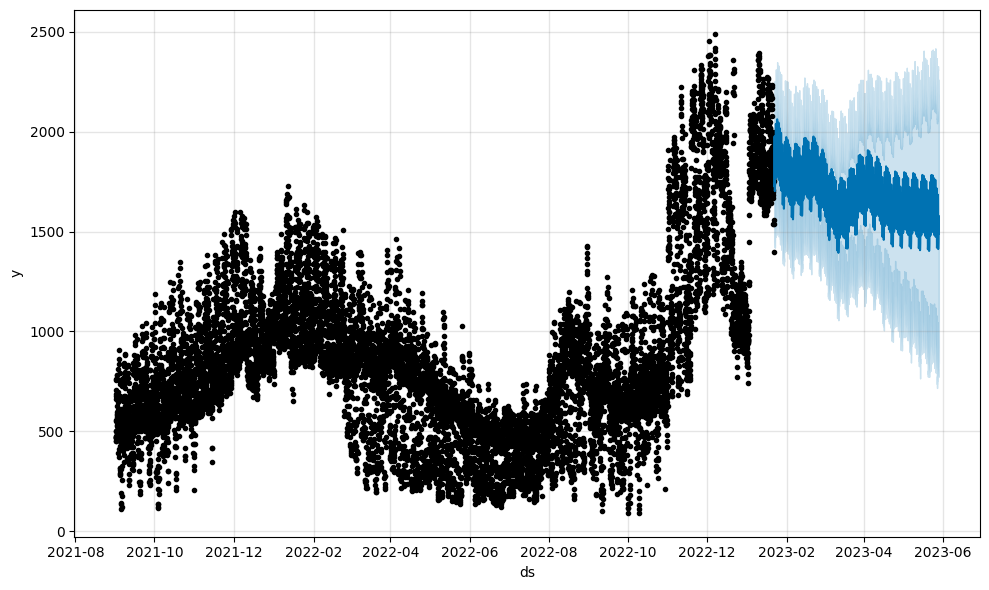

-----------------------------------------------------------------------------------------------------------------
Procesando county: 6, is_business: 1, product_type: 3, is_consumption: 0


17:07:51 - cmdstanpy - INFO - Chain [1] start processing
17:07:53 - cmdstanpy - INFO - Chain [1] done processing


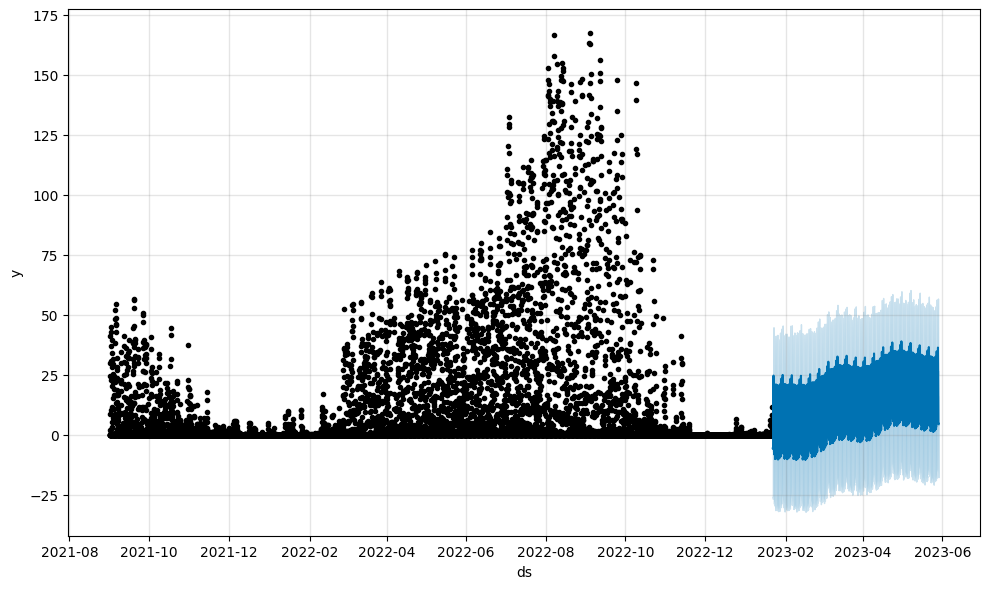

-----------------------------------------------------------------------------------------------------------------
Procesando county: 6, is_business: 1, product_type: 3, is_consumption: 1


17:07:55 - cmdstanpy - INFO - Chain [1] start processing
17:07:59 - cmdstanpy - INFO - Chain [1] done processing


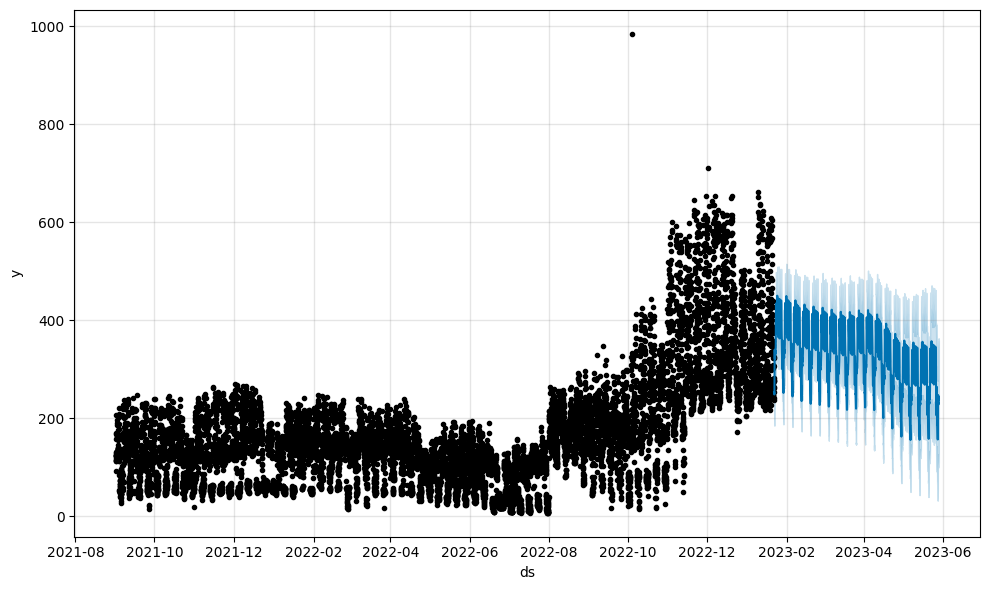

-----------------------------------------------------------------------------------------------------------------
Procesando county: 7, is_business: 0, product_type: 1, is_consumption: 0


17:08:01 - cmdstanpy - INFO - Chain [1] start processing
17:08:02 - cmdstanpy - INFO - Chain [1] done processing


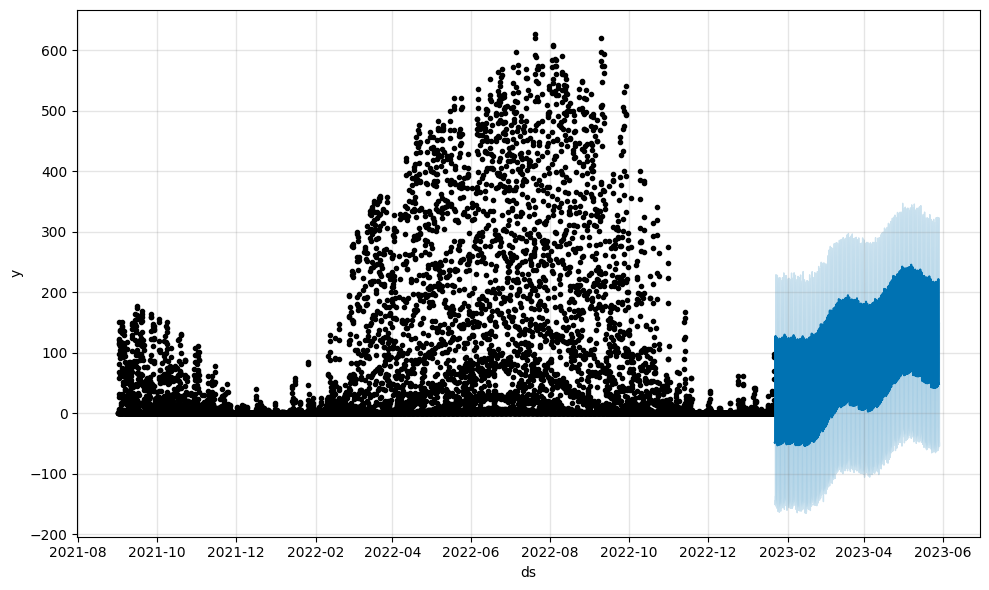

-----------------------------------------------------------------------------------------------------------------
Procesando county: 7, is_business: 0, product_type: 1, is_consumption: 1


17:08:04 - cmdstanpy - INFO - Chain [1] start processing
17:08:10 - cmdstanpy - INFO - Chain [1] done processing


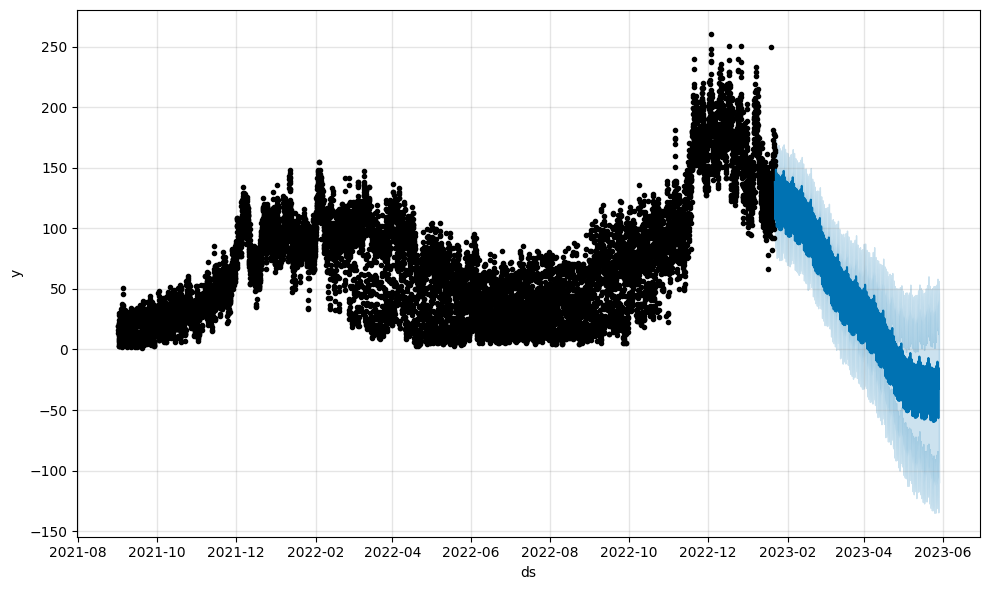

-----------------------------------------------------------------------------------------------------------------
Procesando county: 7, is_business: 0, product_type: 3, is_consumption: 0


17:08:12 - cmdstanpy - INFO - Chain [1] start processing
17:08:13 - cmdstanpy - INFO - Chain [1] done processing


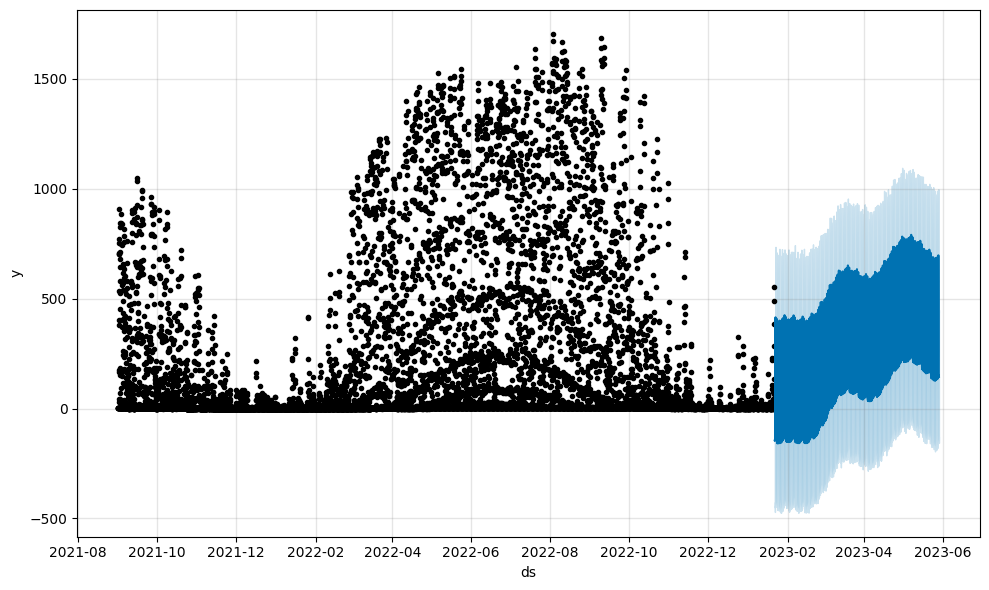

-----------------------------------------------------------------------------------------------------------------
Procesando county: 7, is_business: 0, product_type: 3, is_consumption: 1


17:08:15 - cmdstanpy - INFO - Chain [1] start processing
17:08:18 - cmdstanpy - INFO - Chain [1] done processing


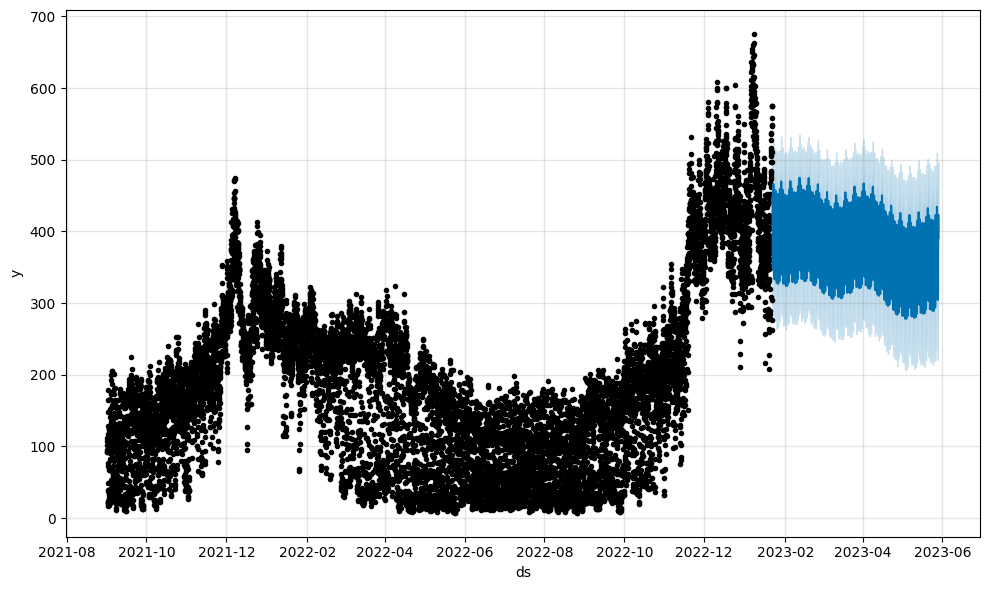

-----------------------------------------------------------------------------------------------------------------
Procesando county: 7, is_business: 1, product_type: 0, is_consumption: 0


17:08:19 - cmdstanpy - INFO - Chain [1] start processing
17:08:20 - cmdstanpy - INFO - Chain [1] done processing


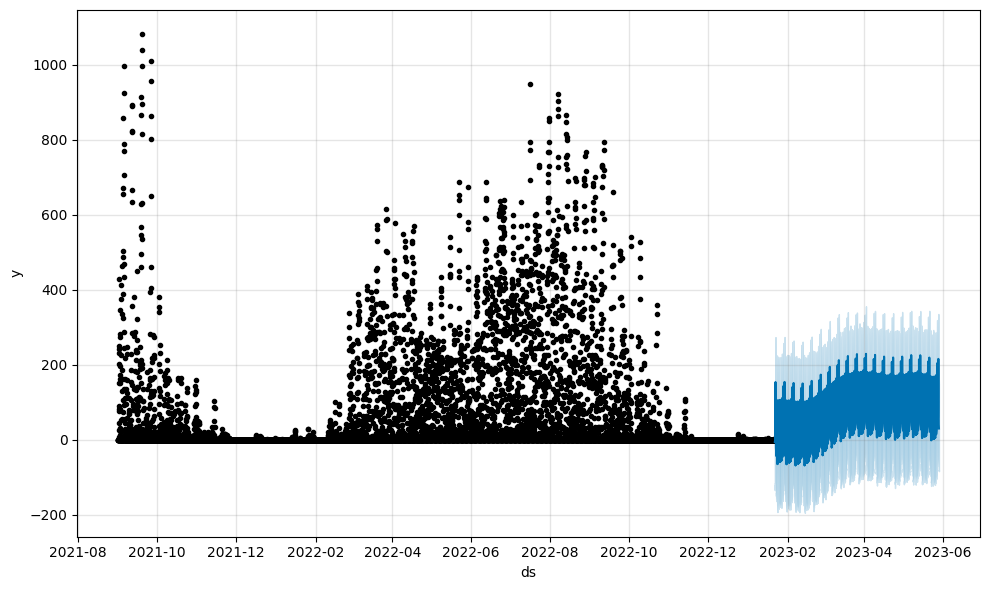

-----------------------------------------------------------------------------------------------------------------
Procesando county: 7, is_business: 1, product_type: 0, is_consumption: 1


17:08:22 - cmdstanpy - INFO - Chain [1] start processing
17:08:25 - cmdstanpy - INFO - Chain [1] done processing


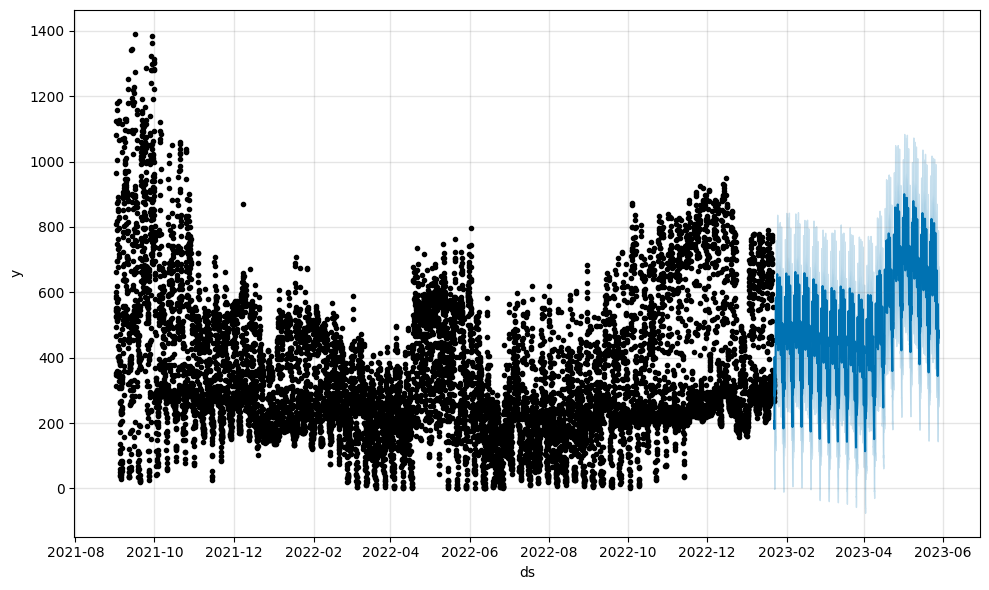

-----------------------------------------------------------------------------------------------------------------
Procesando county: 7, is_business: 1, product_type: 1, is_consumption: 0


17:08:26 - cmdstanpy - INFO - Chain [1] start processing
17:08:28 - cmdstanpy - INFO - Chain [1] done processing


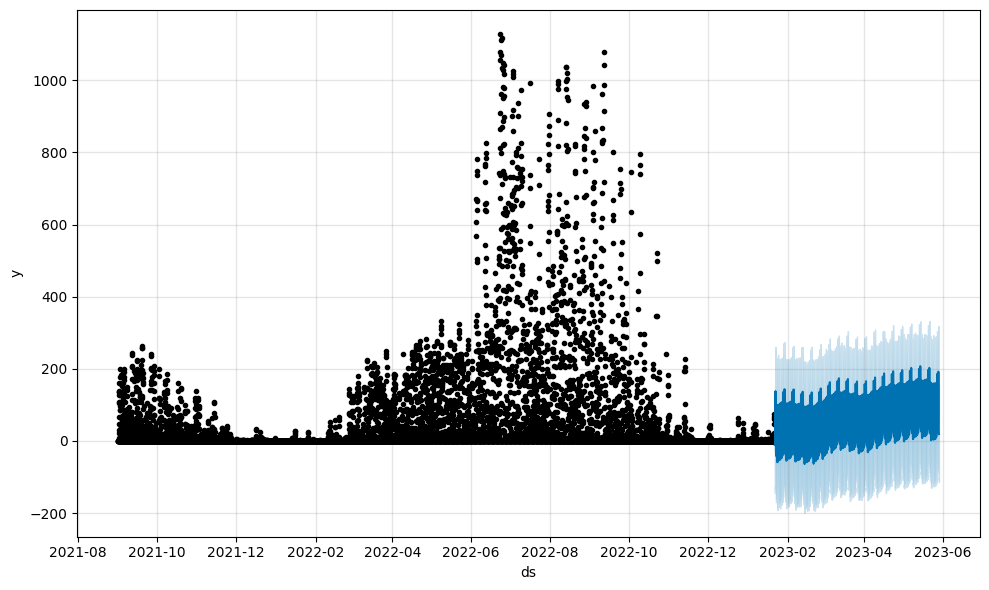

-----------------------------------------------------------------------------------------------------------------
Procesando county: 7, is_business: 1, product_type: 1, is_consumption: 1


17:08:29 - cmdstanpy - INFO - Chain [1] start processing
17:08:30 - cmdstanpy - INFO - Chain [1] done processing


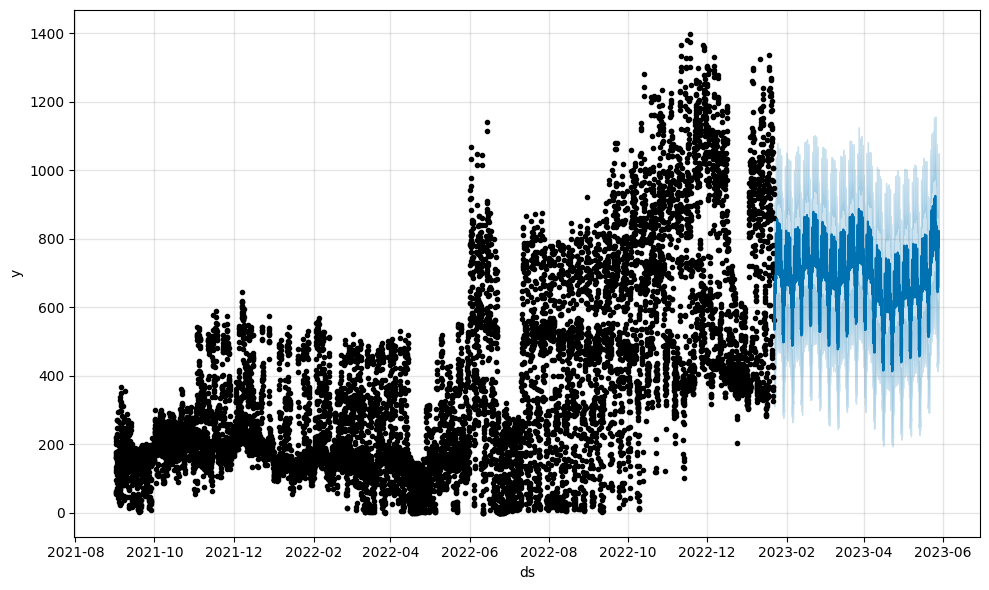

-----------------------------------------------------------------------------------------------------------------
Procesando county: 7, is_business: 1, product_type: 3, is_consumption: 0


17:08:32 - cmdstanpy - INFO - Chain [1] start processing
17:08:33 - cmdstanpy - INFO - Chain [1] done processing


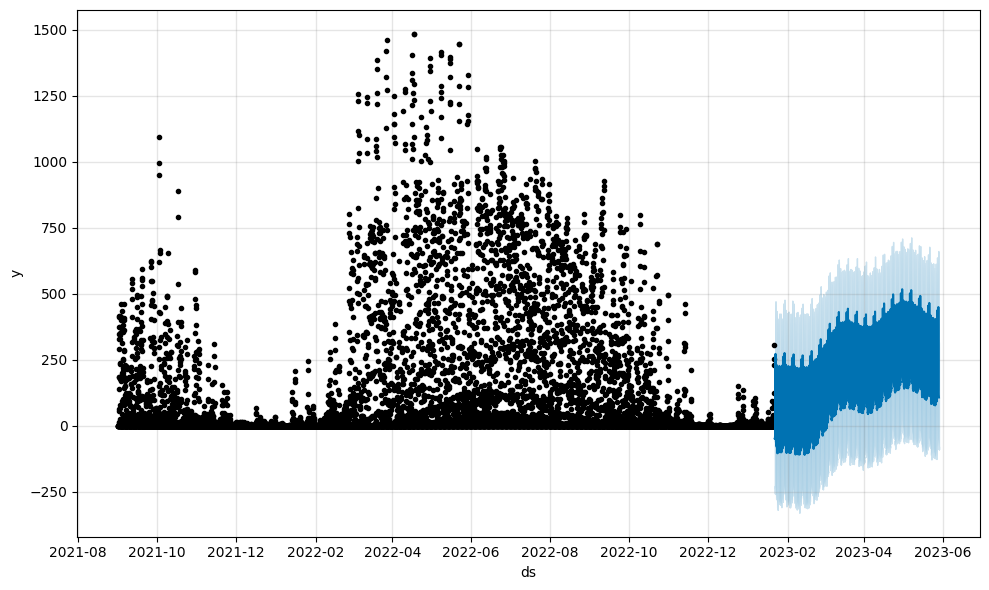

-----------------------------------------------------------------------------------------------------------------
Procesando county: 7, is_business: 1, product_type: 3, is_consumption: 1


17:08:34 - cmdstanpy - INFO - Chain [1] start processing
17:08:38 - cmdstanpy - INFO - Chain [1] done processing


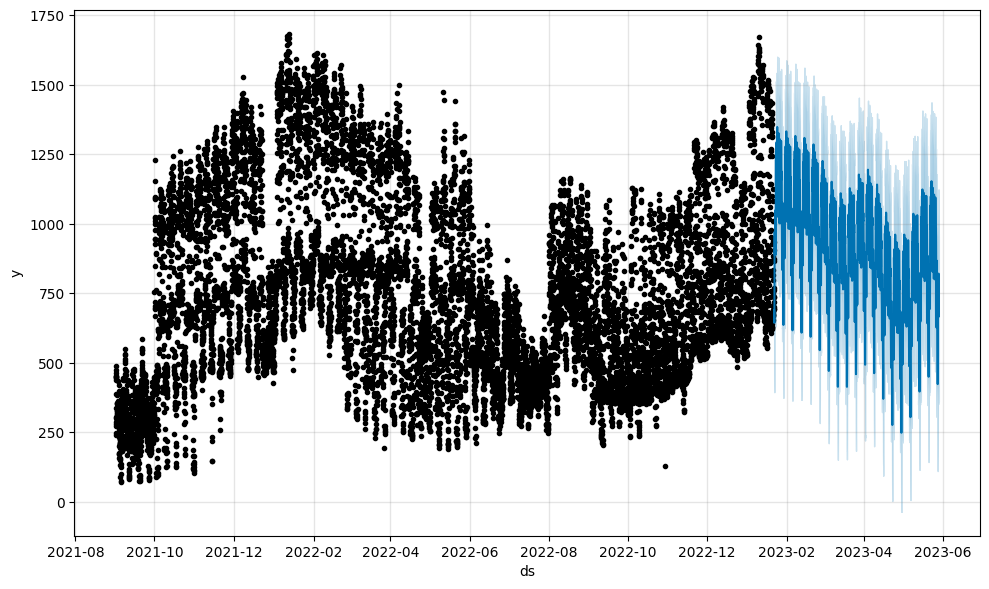

-----------------------------------------------------------------------------------------------------------------
Procesando county: 8, is_business: 0, product_type: 1, is_consumption: 0


17:08:40 - cmdstanpy - INFO - Chain [1] start processing
17:08:41 - cmdstanpy - INFO - Chain [1] done processing


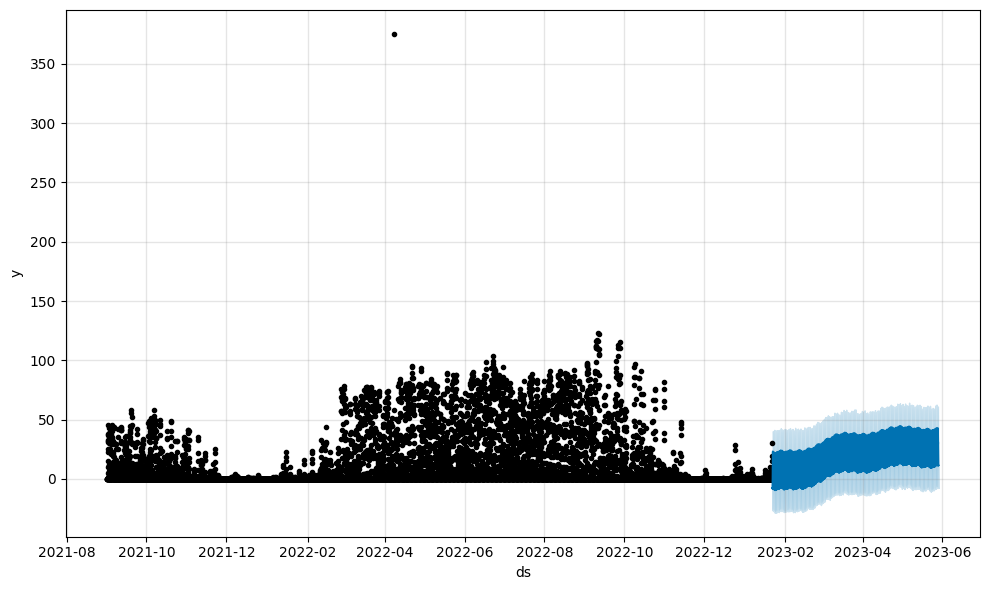

-----------------------------------------------------------------------------------------------------------------
Procesando county: 8, is_business: 0, product_type: 1, is_consumption: 1


17:08:42 - cmdstanpy - INFO - Chain [1] start processing
17:08:48 - cmdstanpy - INFO - Chain [1] done processing


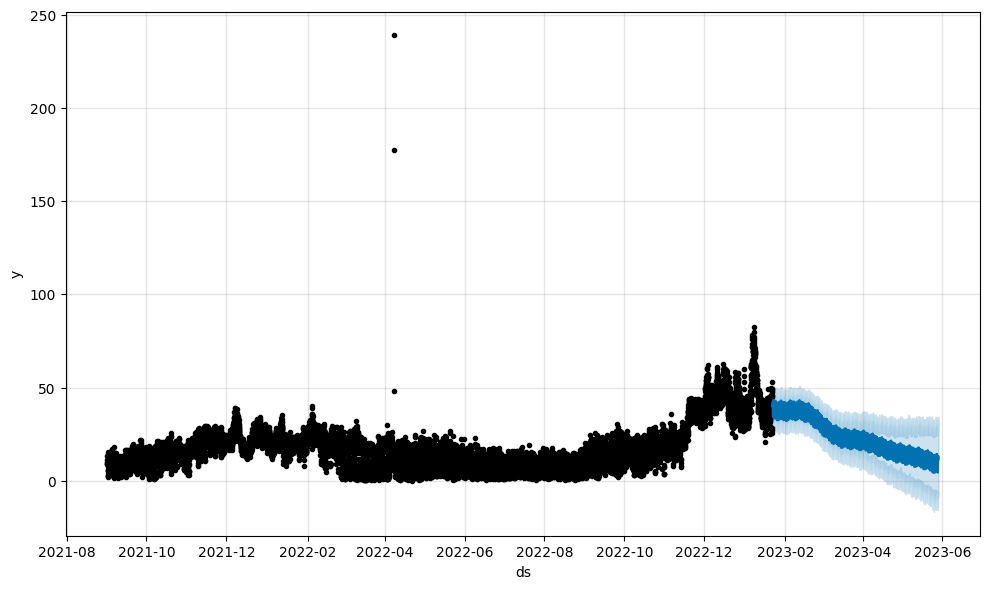

-----------------------------------------------------------------------------------------------------------------
Procesando county: 8, is_business: 0, product_type: 3, is_consumption: 0


17:08:50 - cmdstanpy - INFO - Chain [1] start processing
17:08:50 - cmdstanpy - INFO - Chain [1] done processing


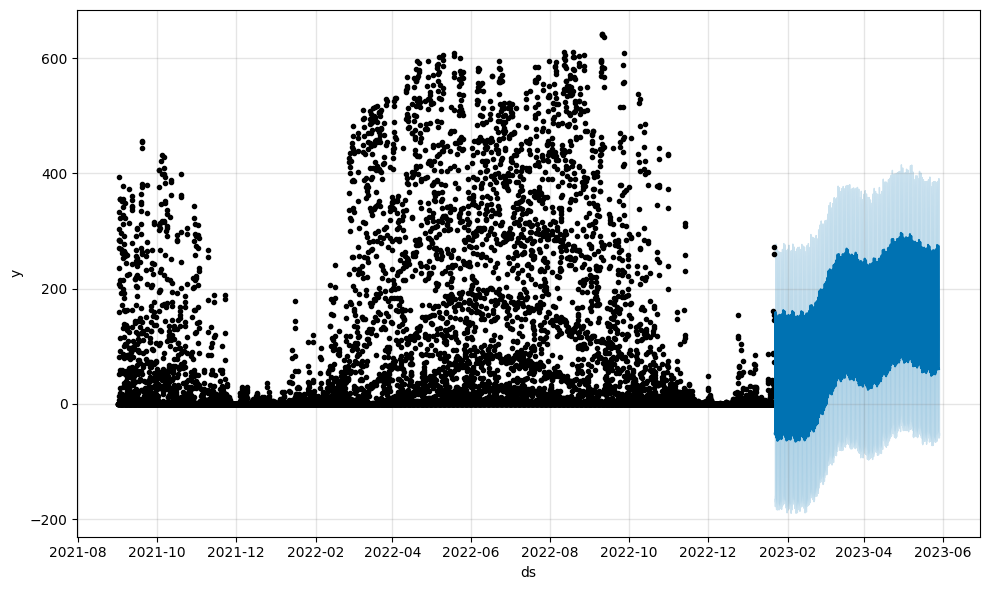

-----------------------------------------------------------------------------------------------------------------
Procesando county: 8, is_business: 0, product_type: 3, is_consumption: 1


17:08:52 - cmdstanpy - INFO - Chain [1] start processing
17:08:54 - cmdstanpy - INFO - Chain [1] done processing


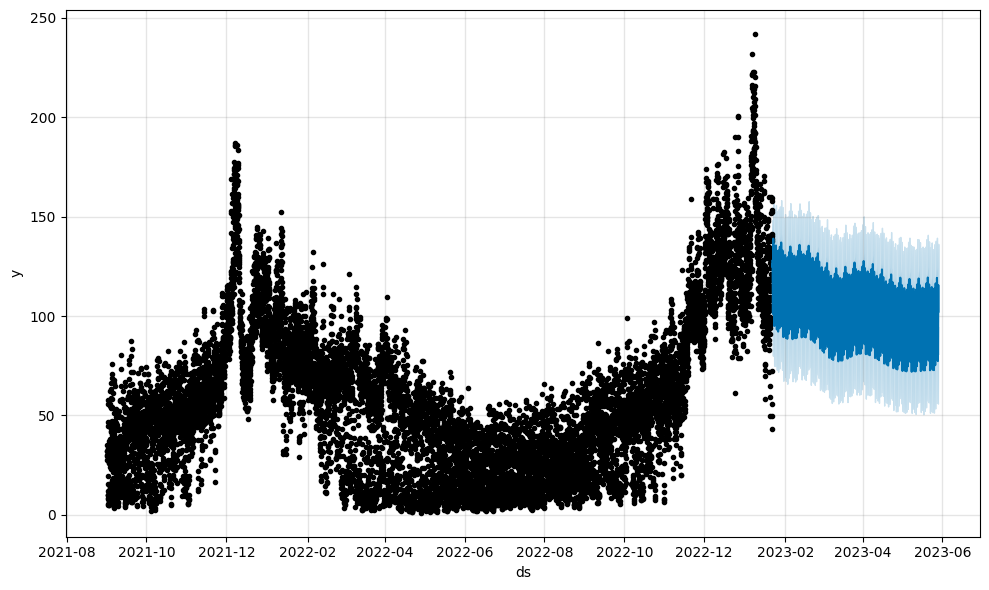

-----------------------------------------------------------------------------------------------------------------
Procesando county: 8, is_business: 1, product_type: 3, is_consumption: 0


17:08:56 - cmdstanpy - INFO - Chain [1] start processing
17:08:57 - cmdstanpy - INFO - Chain [1] done processing


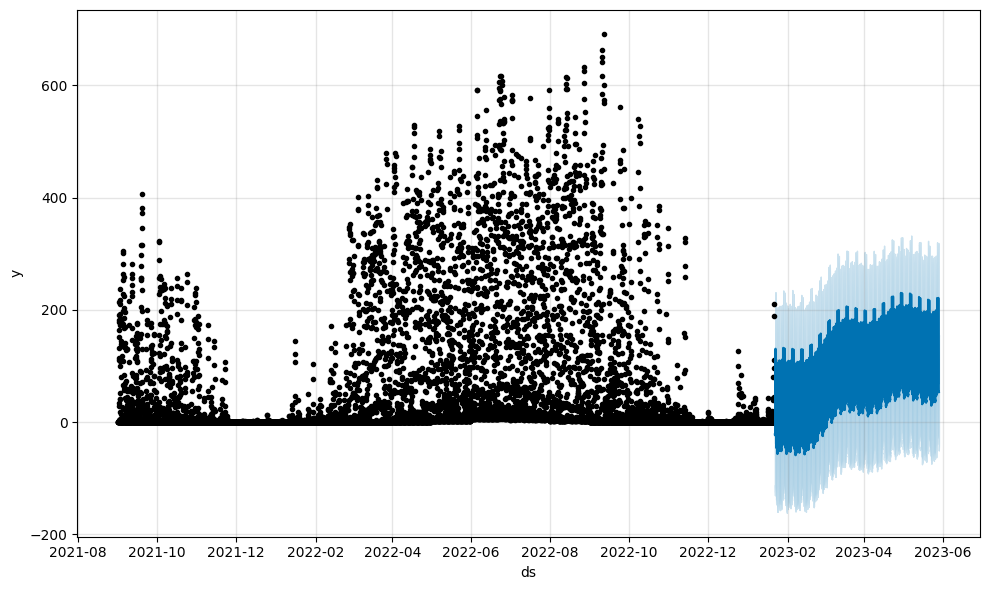

-----------------------------------------------------------------------------------------------------------------
Procesando county: 8, is_business: 1, product_type: 3, is_consumption: 1


17:08:58 - cmdstanpy - INFO - Chain [1] start processing
17:09:00 - cmdstanpy - INFO - Chain [1] done processing


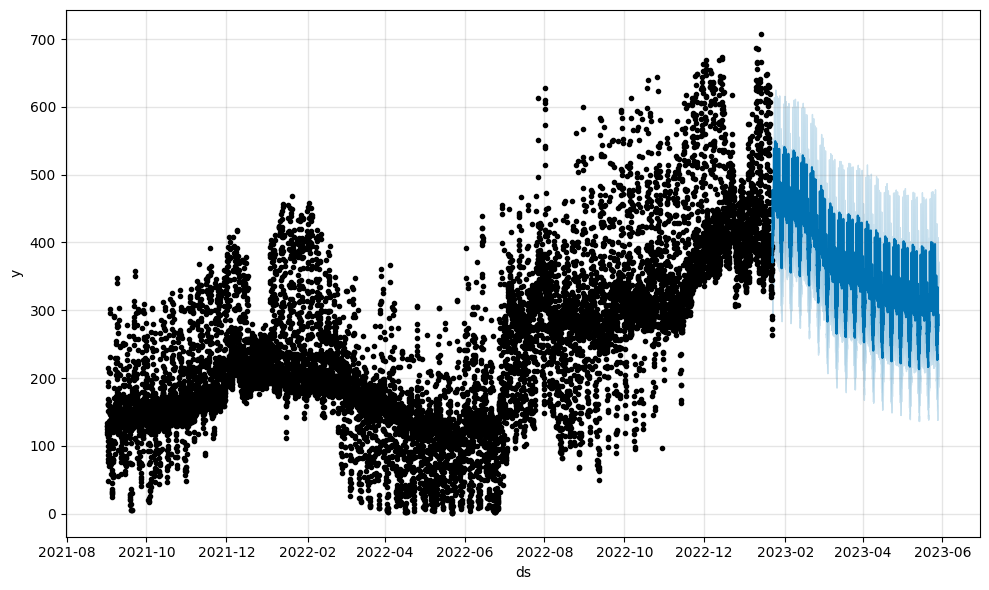

-----------------------------------------------------------------------------------------------------------------
Procesando county: 9, is_business: 0, product_type: 1, is_consumption: 0


17:09:01 - cmdstanpy - INFO - Chain [1] start processing
17:09:03 - cmdstanpy - INFO - Chain [1] done processing


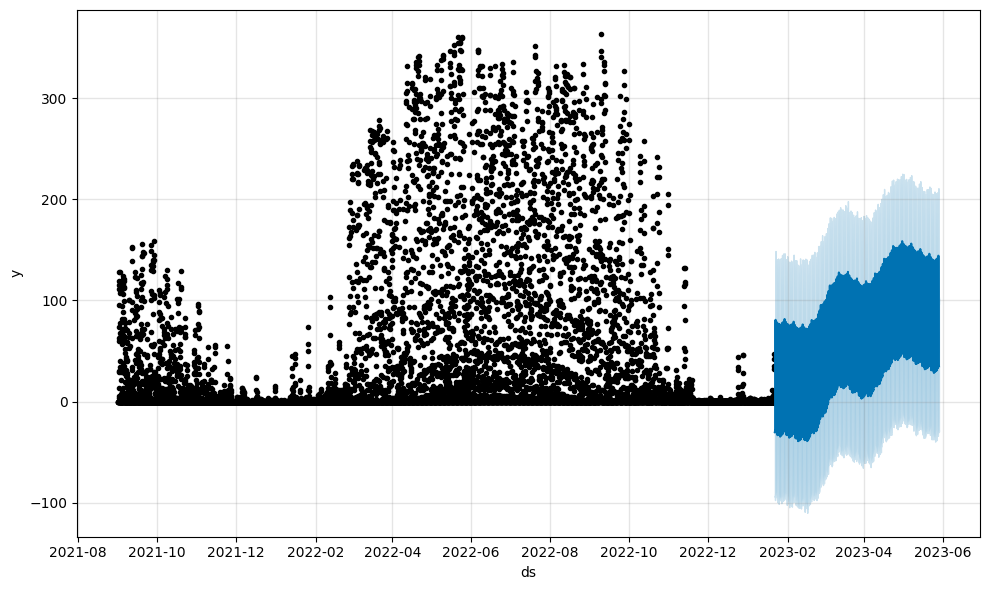

-----------------------------------------------------------------------------------------------------------------
Procesando county: 9, is_business: 0, product_type: 1, is_consumption: 1


17:09:04 - cmdstanpy - INFO - Chain [1] start processing
17:09:08 - cmdstanpy - INFO - Chain [1] done processing


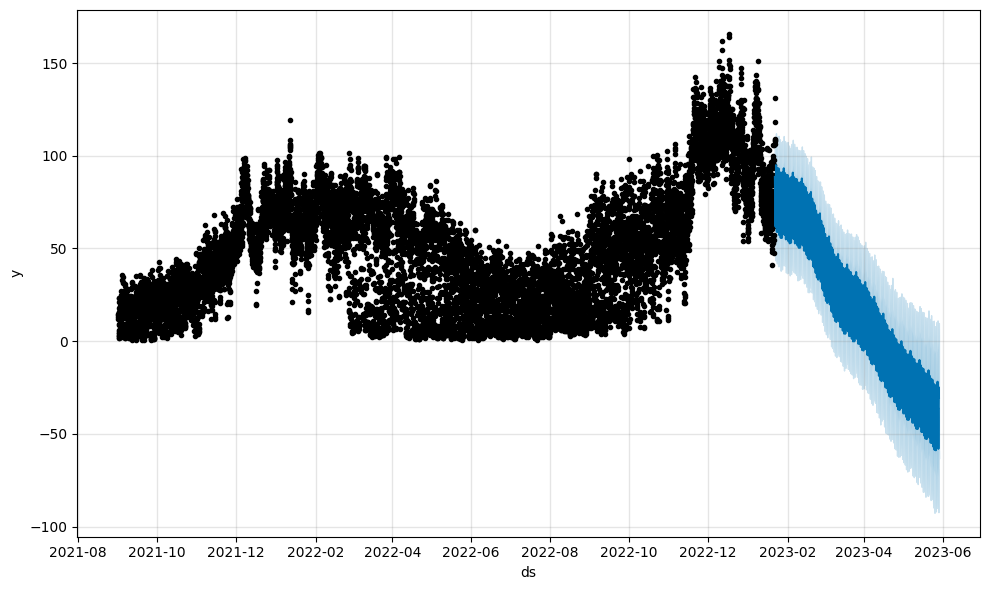

-----------------------------------------------------------------------------------------------------------------
Procesando county: 9, is_business: 0, product_type: 3, is_consumption: 0


17:09:09 - cmdstanpy - INFO - Chain [1] start processing
17:09:10 - cmdstanpy - INFO - Chain [1] done processing


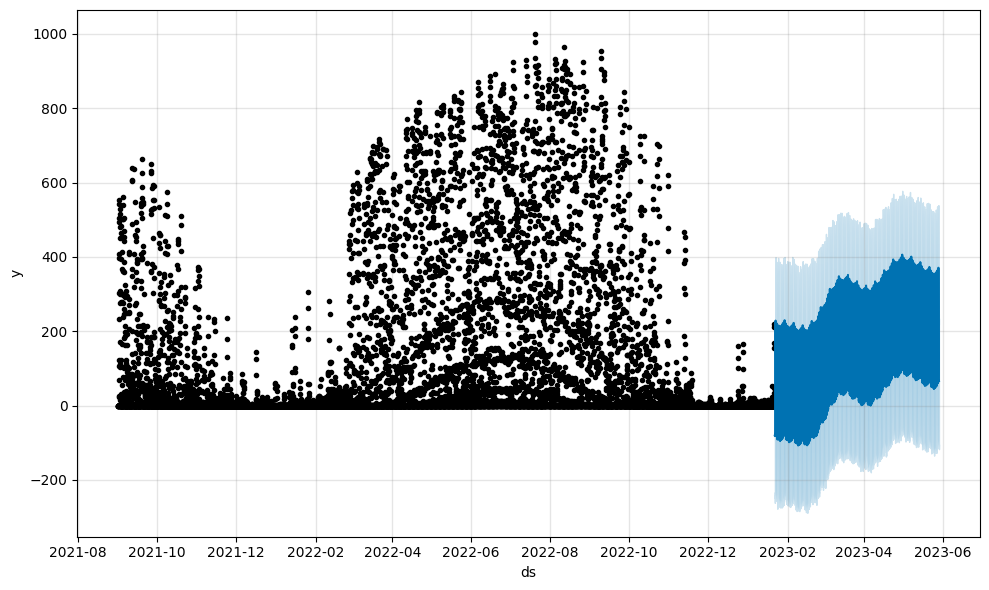

-----------------------------------------------------------------------------------------------------------------
Procesando county: 9, is_business: 0, product_type: 3, is_consumption: 1


17:09:12 - cmdstanpy - INFO - Chain [1] start processing
17:09:15 - cmdstanpy - INFO - Chain [1] done processing


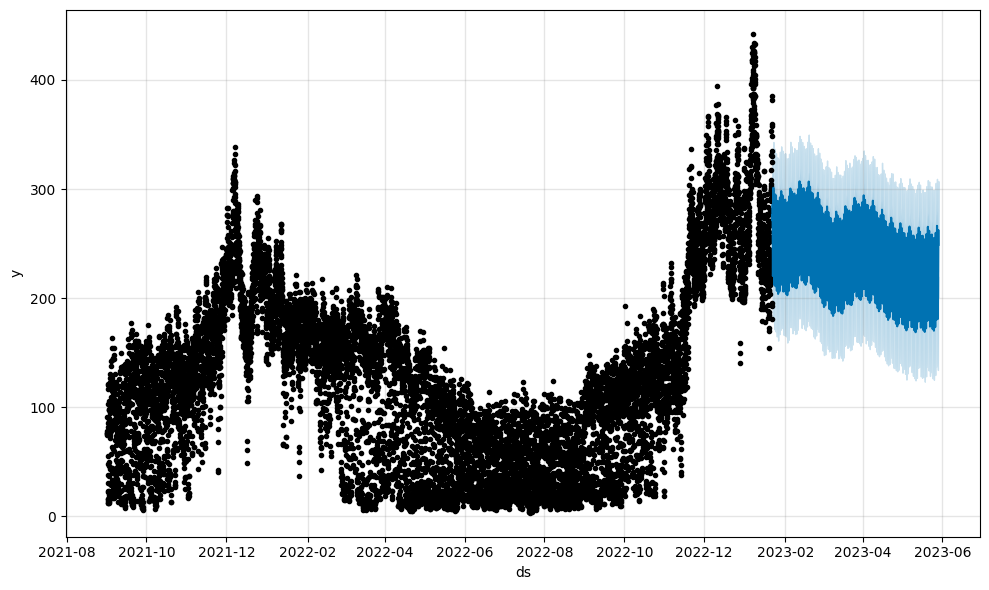

-----------------------------------------------------------------------------------------------------------------
Procesando county: 9, is_business: 1, product_type: 1, is_consumption: 0


17:09:16 - cmdstanpy - INFO - Chain [1] start processing
17:09:17 - cmdstanpy - INFO - Chain [1] done processing


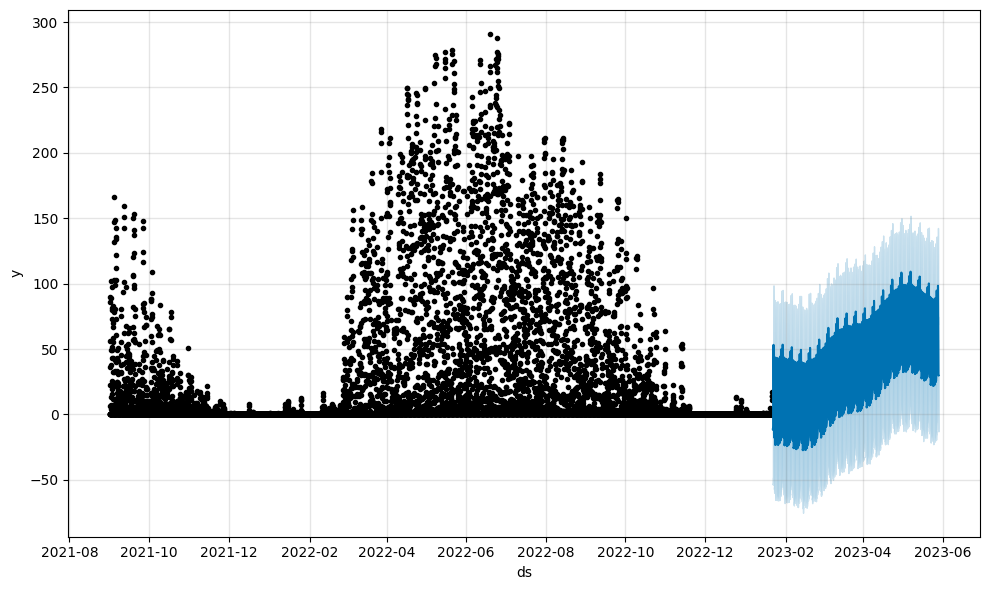

-----------------------------------------------------------------------------------------------------------------
Procesando county: 9, is_business: 1, product_type: 1, is_consumption: 1


17:09:19 - cmdstanpy - INFO - Chain [1] start processing
17:09:25 - cmdstanpy - INFO - Chain [1] done processing


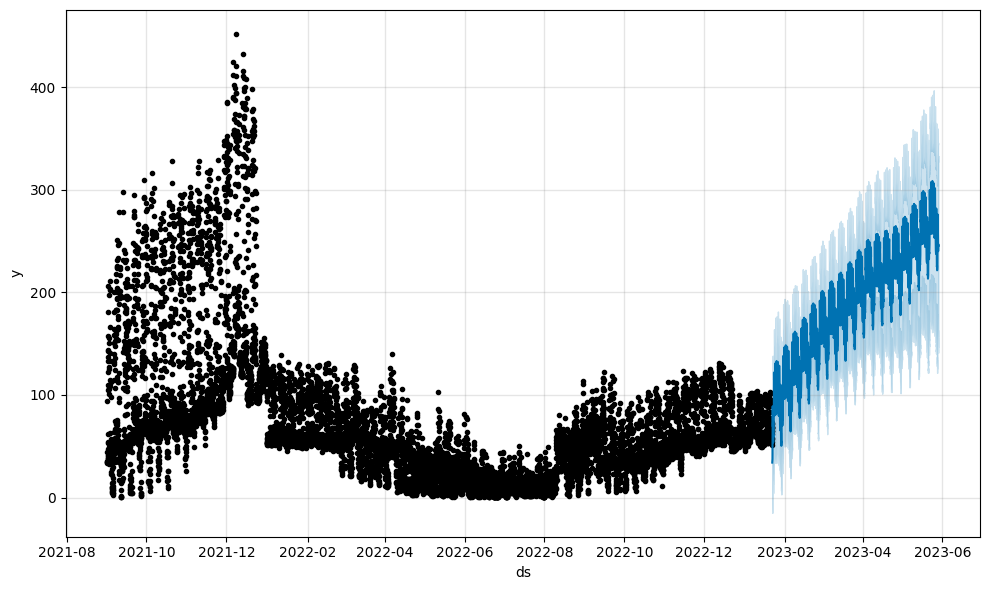

-----------------------------------------------------------------------------------------------------------------
Procesando county: 9, is_business: 1, product_type: 3, is_consumption: 0


17:09:26 - cmdstanpy - INFO - Chain [1] start processing
17:09:27 - cmdstanpy - INFO - Chain [1] done processing


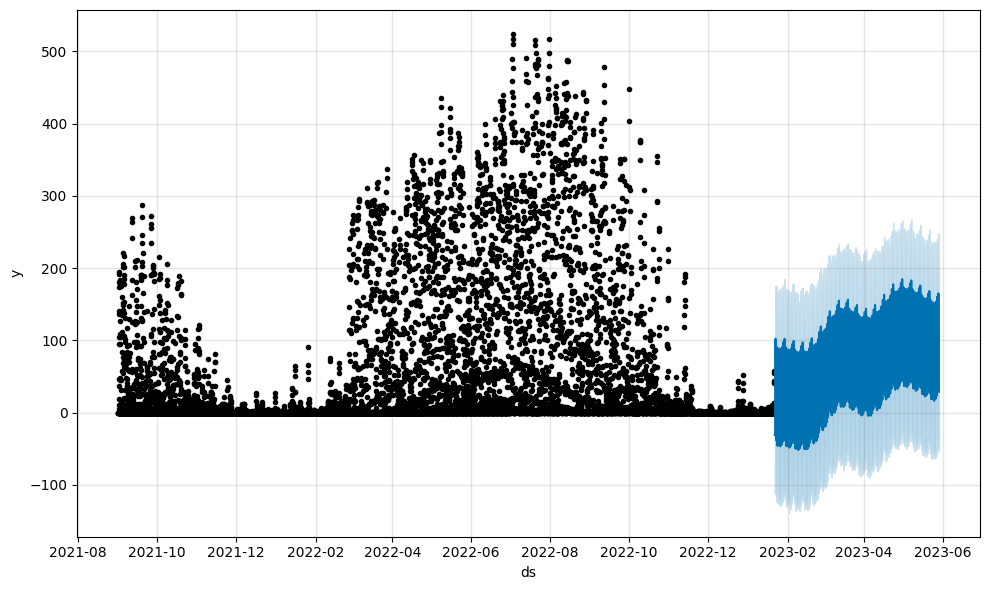

-----------------------------------------------------------------------------------------------------------------
Procesando county: 9, is_business: 1, product_type: 3, is_consumption: 1


17:09:29 - cmdstanpy - INFO - Chain [1] start processing
17:09:34 - cmdstanpy - INFO - Chain [1] done processing


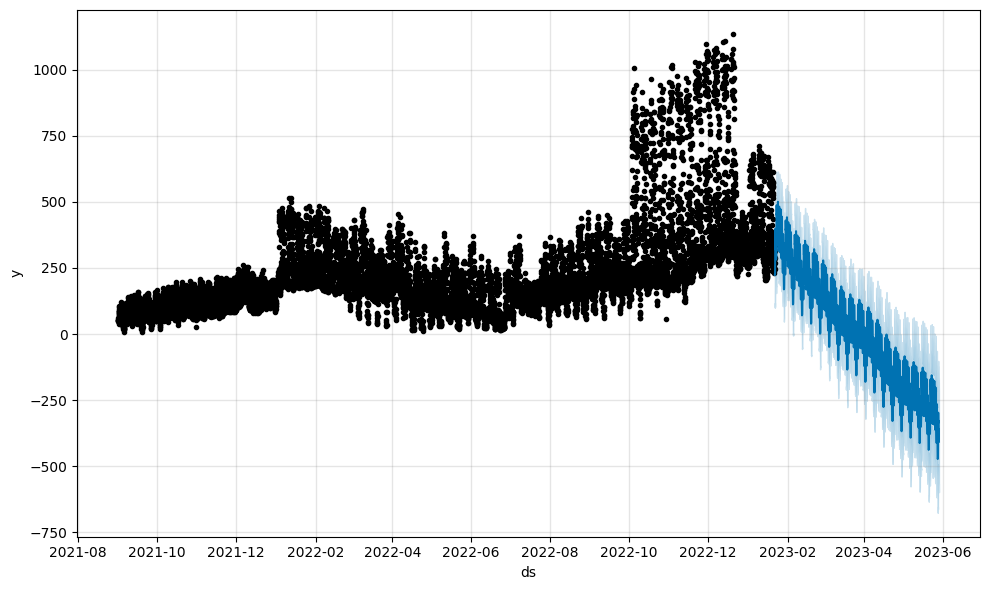

-----------------------------------------------------------------------------------------------------------------
Procesando county: 10, is_business: 0, product_type: 1, is_consumption: 0


17:09:35 - cmdstanpy - INFO - Chain [1] start processing
17:09:37 - cmdstanpy - INFO - Chain [1] done processing


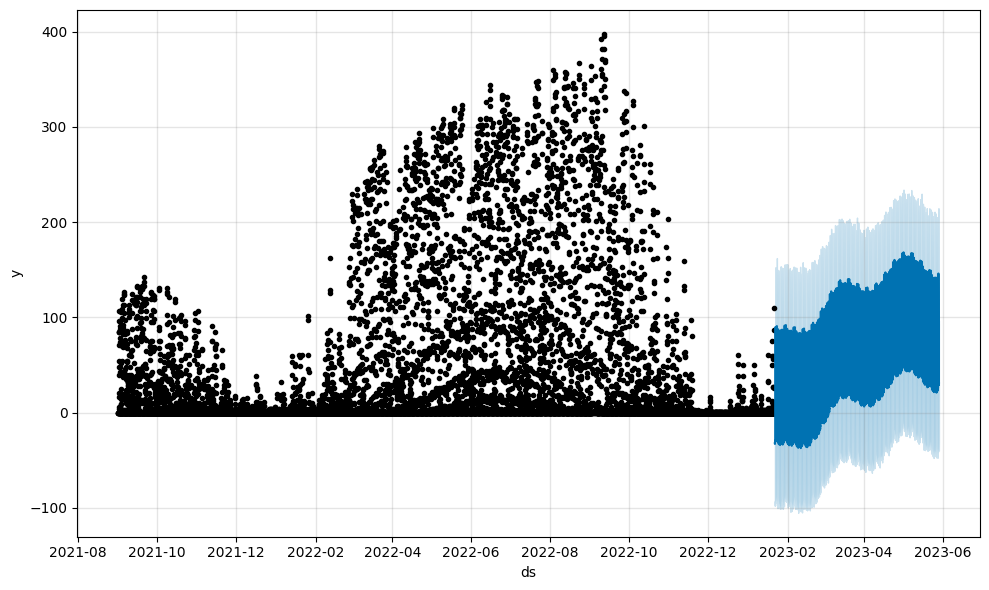

-----------------------------------------------------------------------------------------------------------------
Procesando county: 10, is_business: 0, product_type: 1, is_consumption: 1


17:09:39 - cmdstanpy - INFO - Chain [1] start processing
17:09:43 - cmdstanpy - INFO - Chain [1] done processing


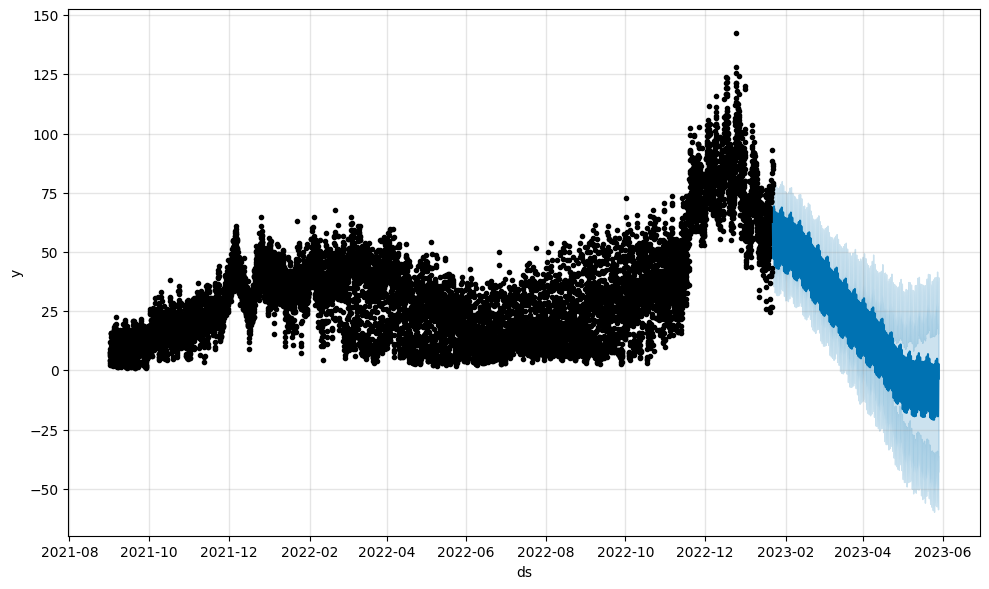

-----------------------------------------------------------------------------------------------------------------
Procesando county: 10, is_business: 0, product_type: 3, is_consumption: 0


17:09:45 - cmdstanpy - INFO - Chain [1] start processing
17:09:46 - cmdstanpy - INFO - Chain [1] done processing


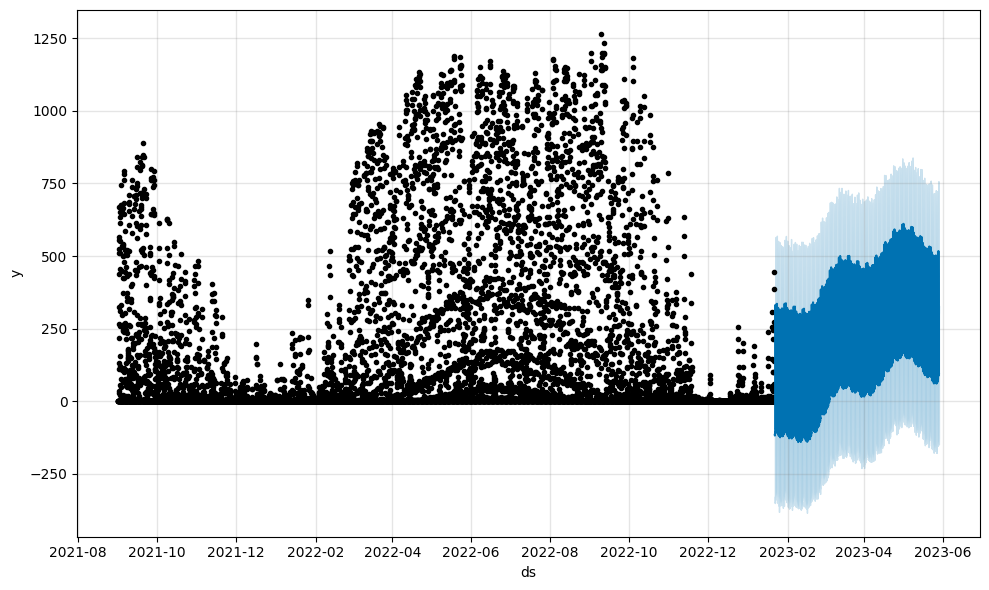

-----------------------------------------------------------------------------------------------------------------
Procesando county: 10, is_business: 0, product_type: 3, is_consumption: 1


17:09:48 - cmdstanpy - INFO - Chain [1] start processing
17:09:50 - cmdstanpy - INFO - Chain [1] done processing


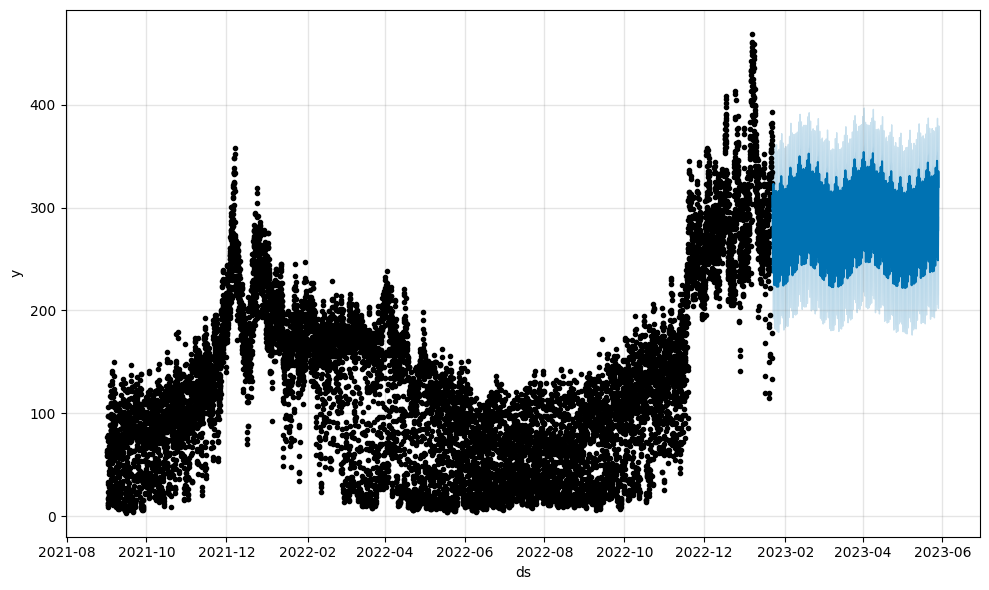

-----------------------------------------------------------------------------------------------------------------
Procesando county: 10, is_business: 1, product_type: 1, is_consumption: 0


17:09:51 - cmdstanpy - INFO - Chain [1] start processing
17:09:53 - cmdstanpy - INFO - Chain [1] done processing


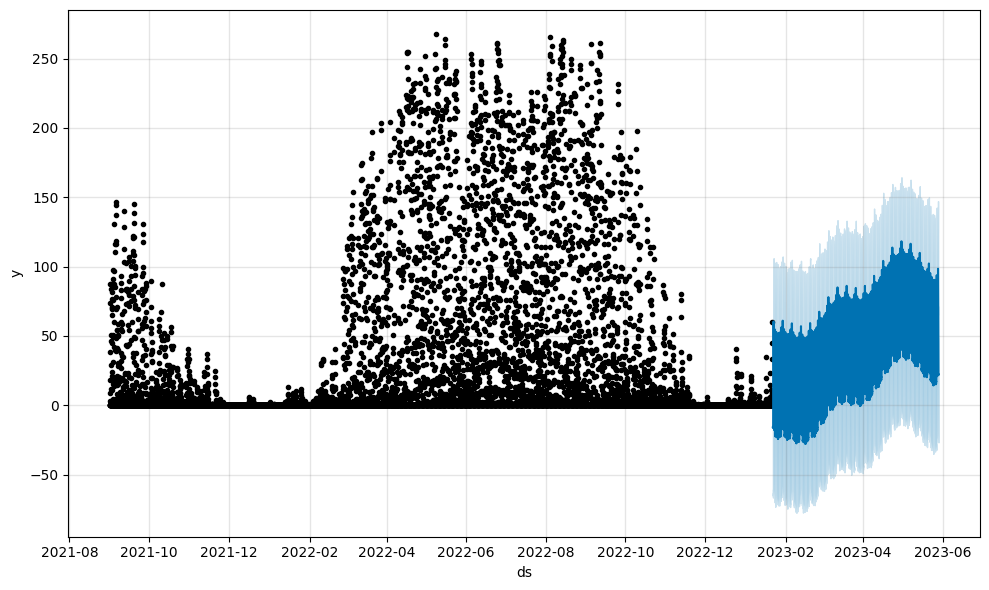

-----------------------------------------------------------------------------------------------------------------
Procesando county: 10, is_business: 1, product_type: 1, is_consumption: 1


17:09:54 - cmdstanpy - INFO - Chain [1] start processing
17:09:56 - cmdstanpy - INFO - Chain [1] done processing


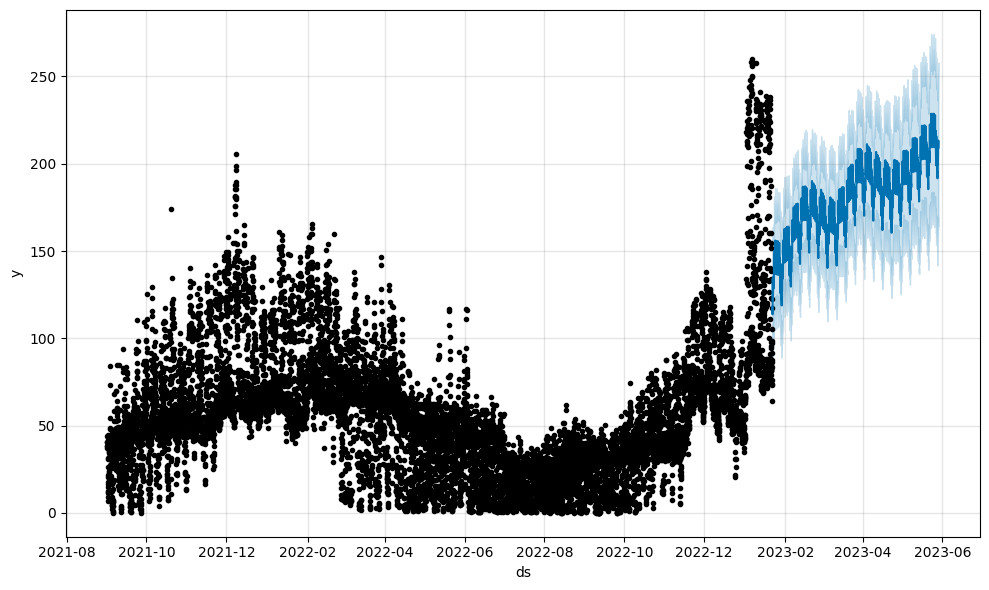

-----------------------------------------------------------------------------------------------------------------
Procesando county: 10, is_business: 1, product_type: 3, is_consumption: 0


17:09:58 - cmdstanpy - INFO - Chain [1] start processing
17:09:59 - cmdstanpy - INFO - Chain [1] done processing


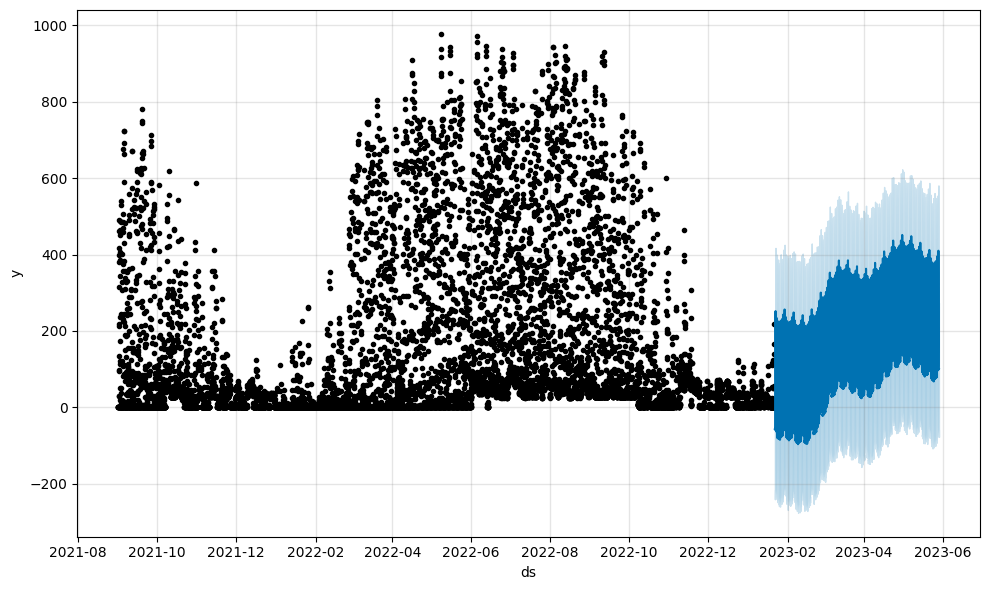

-----------------------------------------------------------------------------------------------------------------
Procesando county: 10, is_business: 1, product_type: 3, is_consumption: 1


17:10:00 - cmdstanpy - INFO - Chain [1] start processing
17:10:03 - cmdstanpy - INFO - Chain [1] done processing


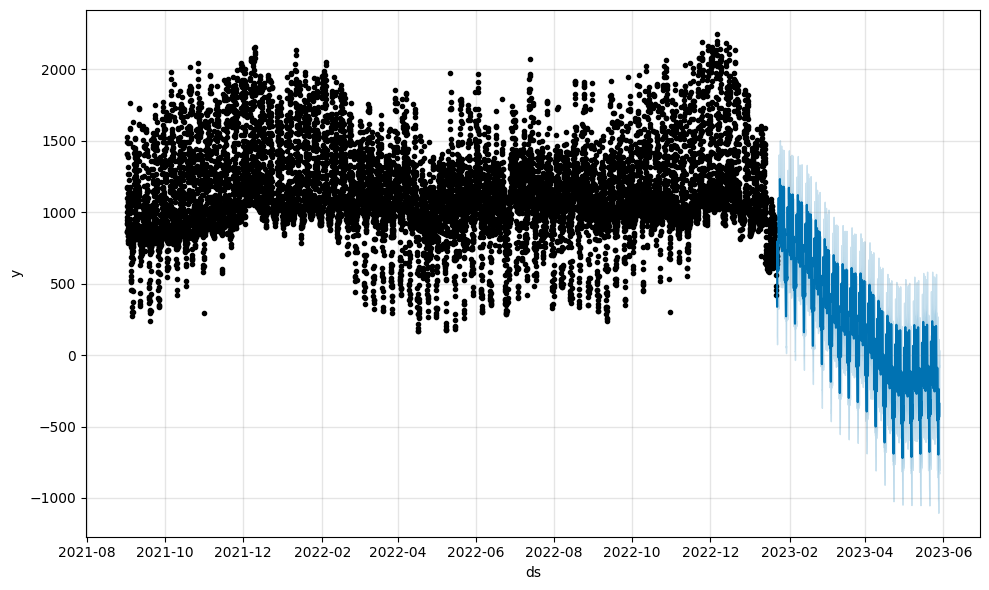

-----------------------------------------------------------------------------------------------------------------
Procesando county: 11, is_business: 0, product_type: 1, is_consumption: 0


17:10:05 - cmdstanpy - INFO - Chain [1] start processing
17:10:06 - cmdstanpy - INFO - Chain [1] done processing


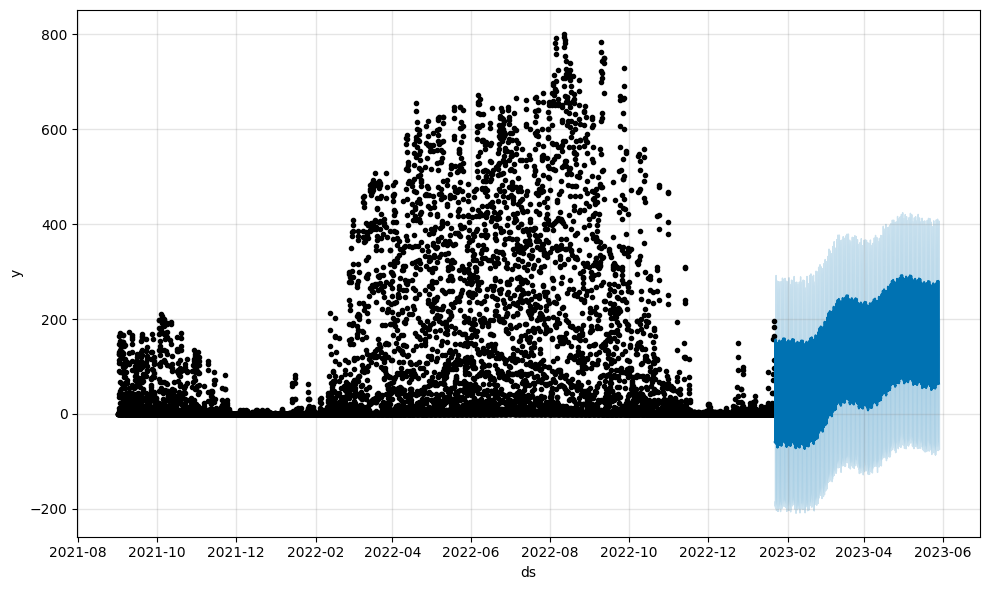

-----------------------------------------------------------------------------------------------------------------
Procesando county: 11, is_business: 0, product_type: 1, is_consumption: 1


17:10:08 - cmdstanpy - INFO - Chain [1] start processing
17:10:13 - cmdstanpy - INFO - Chain [1] done processing


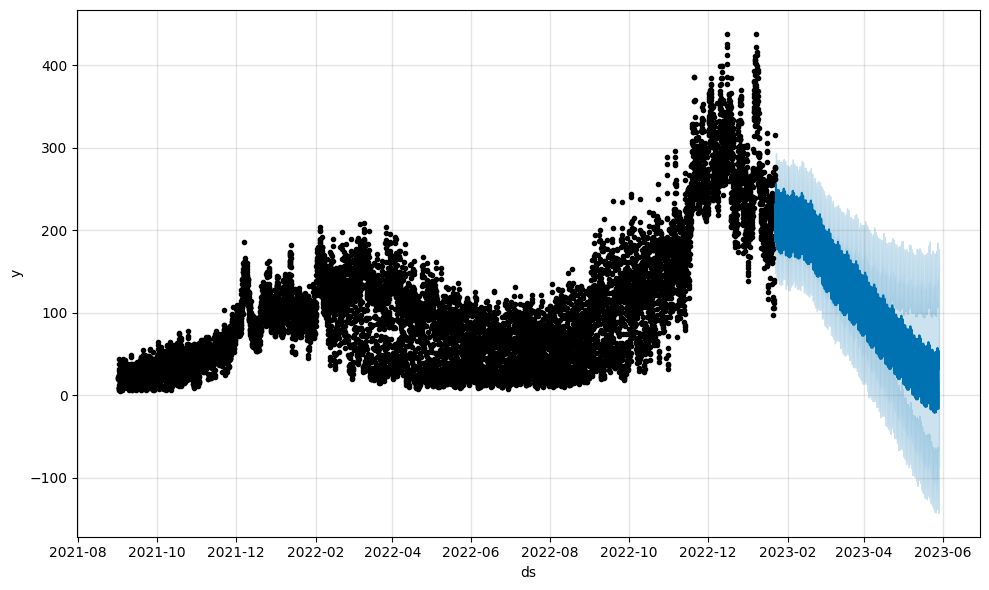

-----------------------------------------------------------------------------------------------------------------
Procesando county: 11, is_business: 0, product_type: 3, is_consumption: 0


17:10:15 - cmdstanpy - INFO - Chain [1] start processing
17:10:17 - cmdstanpy - INFO - Chain [1] done processing


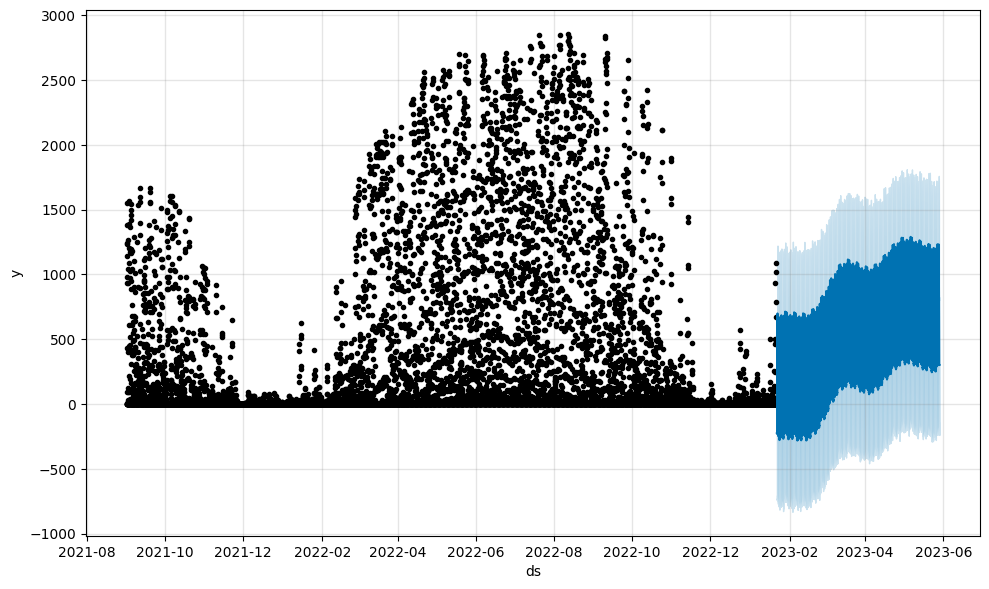

-----------------------------------------------------------------------------------------------------------------
Procesando county: 11, is_business: 0, product_type: 3, is_consumption: 1


17:10:19 - cmdstanpy - INFO - Chain [1] start processing
17:10:21 - cmdstanpy - INFO - Chain [1] done processing


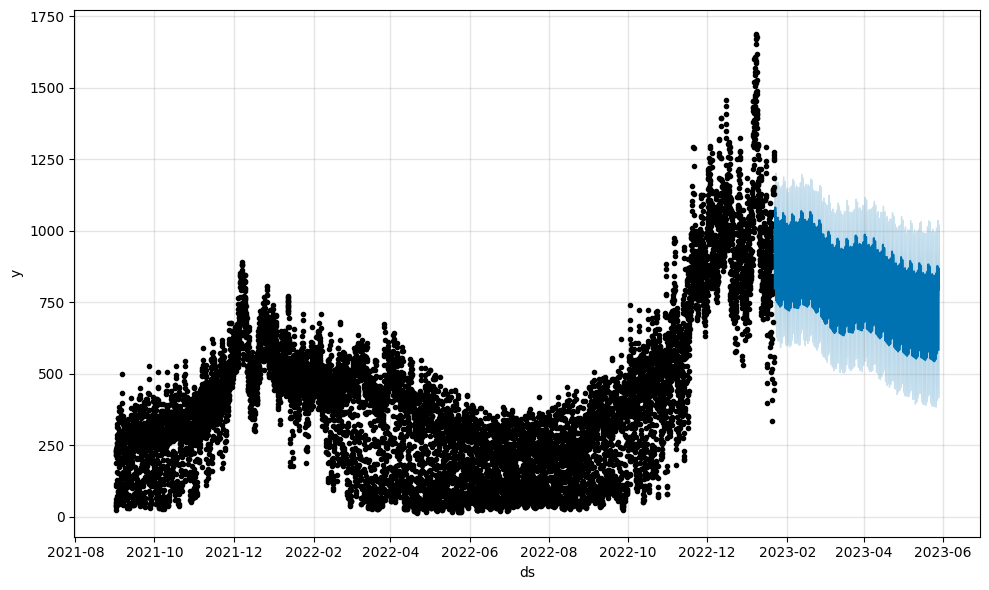

-----------------------------------------------------------------------------------------------------------------
Procesando county: 11, is_business: 1, product_type: 1, is_consumption: 0


17:10:23 - cmdstanpy - INFO - Chain [1] start processing
17:10:24 - cmdstanpy - INFO - Chain [1] done processing


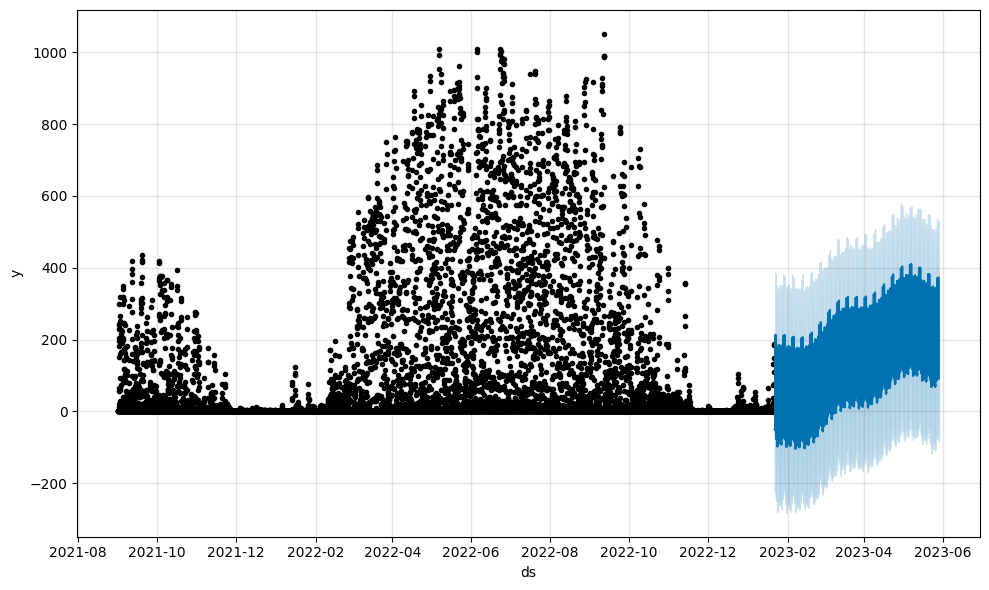

-----------------------------------------------------------------------------------------------------------------
Procesando county: 11, is_business: 1, product_type: 1, is_consumption: 1


17:10:25 - cmdstanpy - INFO - Chain [1] start processing
17:10:27 - cmdstanpy - INFO - Chain [1] done processing


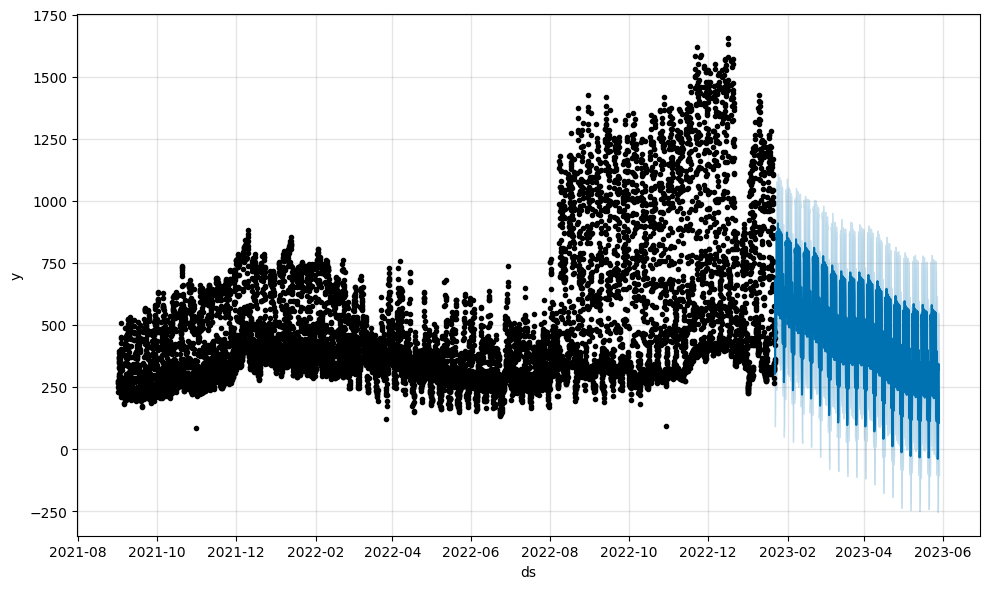

-----------------------------------------------------------------------------------------------------------------
Procesando county: 11, is_business: 1, product_type: 3, is_consumption: 0


17:10:29 - cmdstanpy - INFO - Chain [1] start processing
17:10:29 - cmdstanpy - INFO - Chain [1] done processing


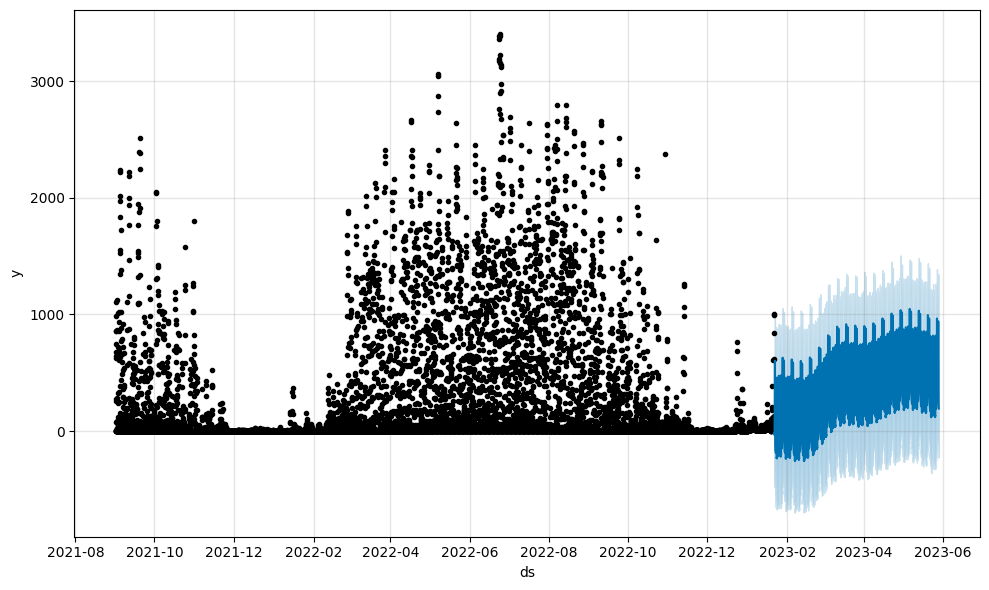

-----------------------------------------------------------------------------------------------------------------
Procesando county: 11, is_business: 1, product_type: 3, is_consumption: 1


17:10:31 - cmdstanpy - INFO - Chain [1] start processing
17:10:33 - cmdstanpy - INFO - Chain [1] done processing


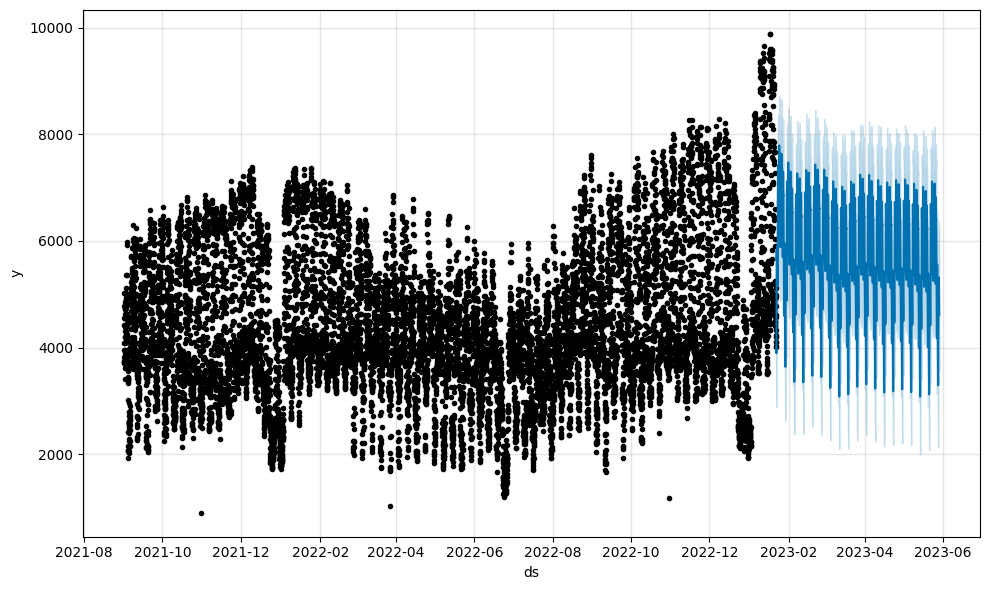

-----------------------------------------------------------------------------------------------------------------
Procesando county: 12, is_business: 1, product_type: 3, is_consumption: 0


17:10:34 - cmdstanpy - INFO - Chain [1] start processing
17:10:35 - cmdstanpy - INFO - Chain [1] done processing


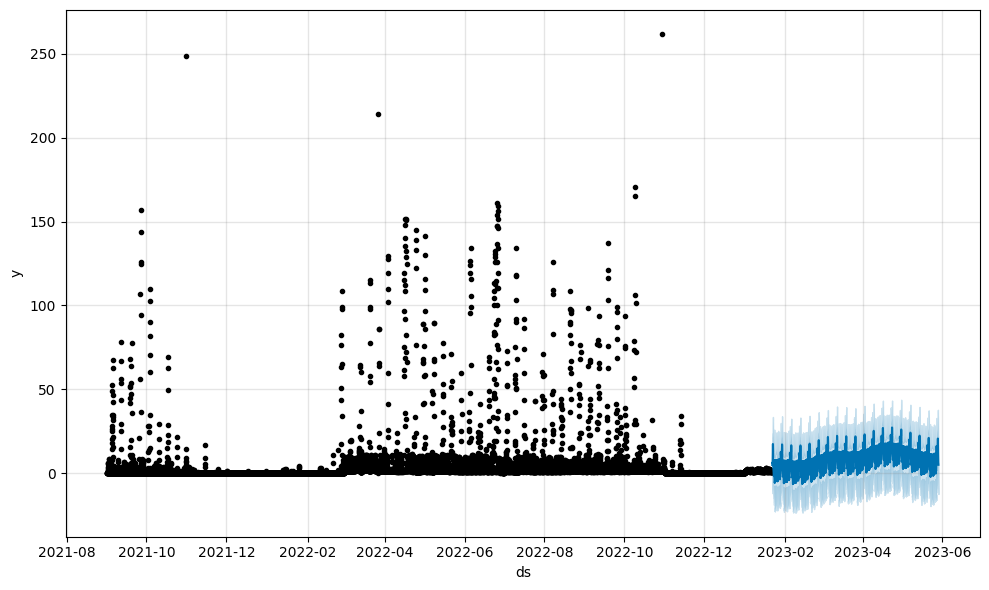

-----------------------------------------------------------------------------------------------------------------
Procesando county: 12, is_business: 1, product_type: 3, is_consumption: 1


17:10:37 - cmdstanpy - INFO - Chain [1] start processing
17:10:40 - cmdstanpy - INFO - Chain [1] done processing


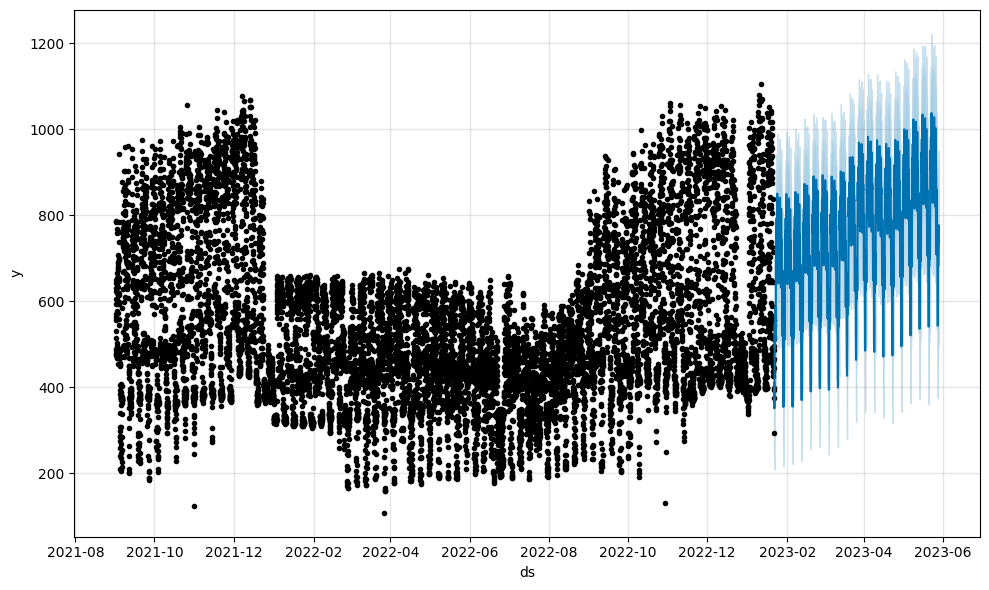

-----------------------------------------------------------------------------------------------------------------
Procesando county: 13, is_business: 0, product_type: 1, is_consumption: 0


17:10:41 - cmdstanpy - INFO - Chain [1] start processing
17:10:42 - cmdstanpy - INFO - Chain [1] done processing


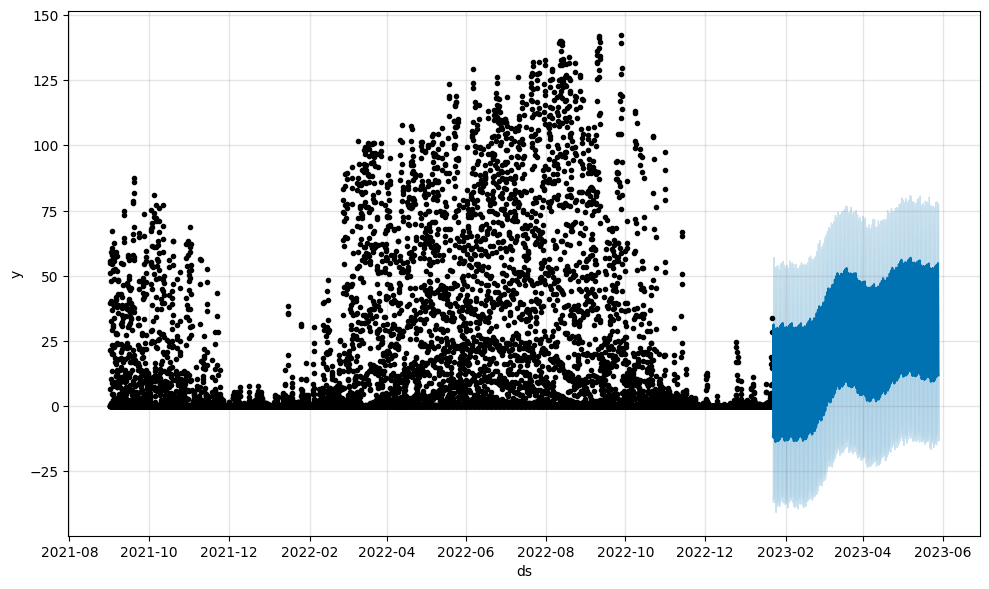

-----------------------------------------------------------------------------------------------------------------
Procesando county: 13, is_business: 0, product_type: 1, is_consumption: 1


17:10:44 - cmdstanpy - INFO - Chain [1] start processing
17:10:48 - cmdstanpy - INFO - Chain [1] done processing


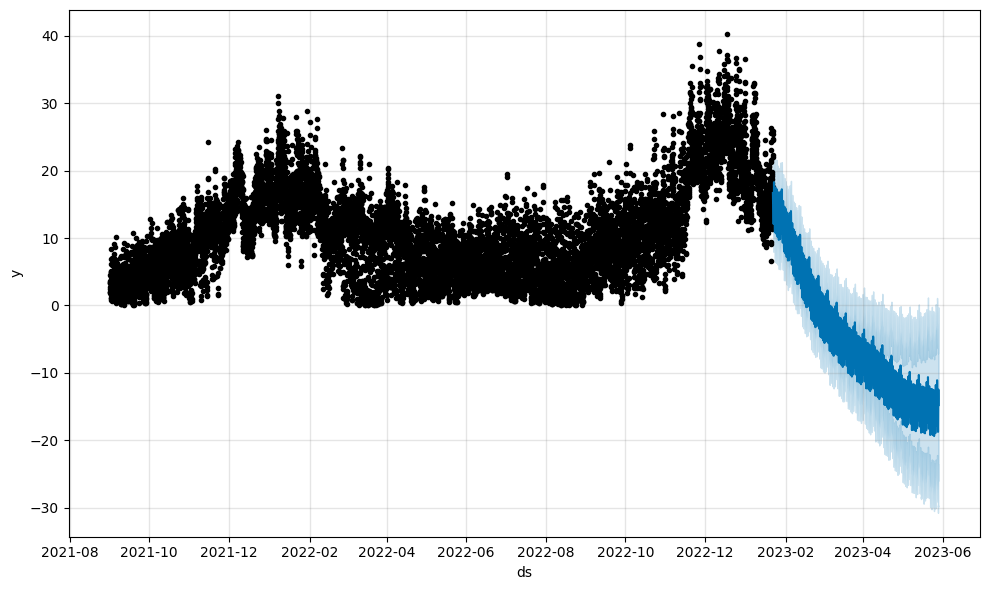

-----------------------------------------------------------------------------------------------------------------
Procesando county: 13, is_business: 0, product_type: 3, is_consumption: 0


17:10:49 - cmdstanpy - INFO - Chain [1] start processing
17:10:50 - cmdstanpy - INFO - Chain [1] done processing


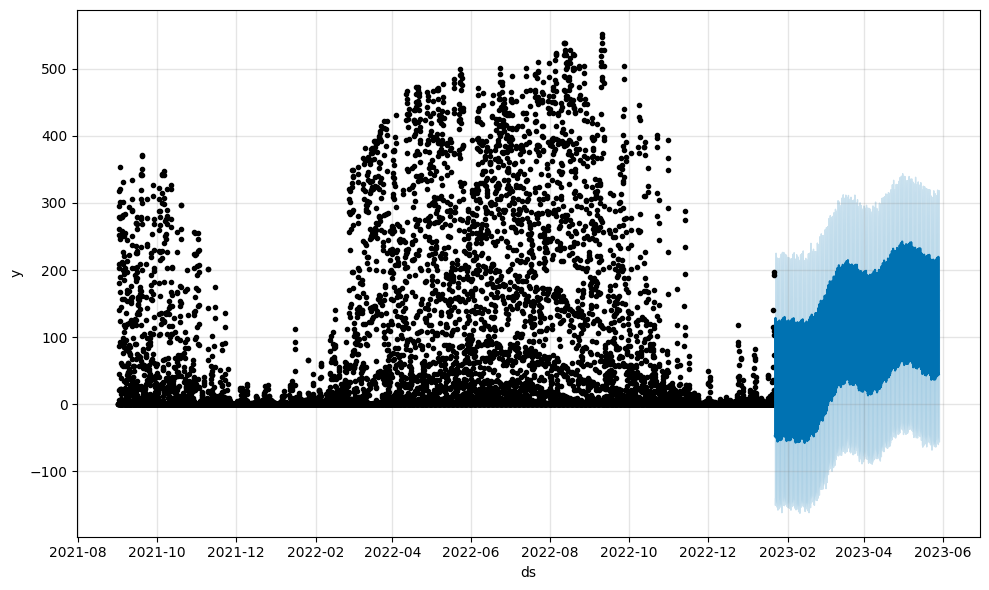

-----------------------------------------------------------------------------------------------------------------
Procesando county: 13, is_business: 0, product_type: 3, is_consumption: 1


17:10:52 - cmdstanpy - INFO - Chain [1] start processing
17:10:56 - cmdstanpy - INFO - Chain [1] done processing


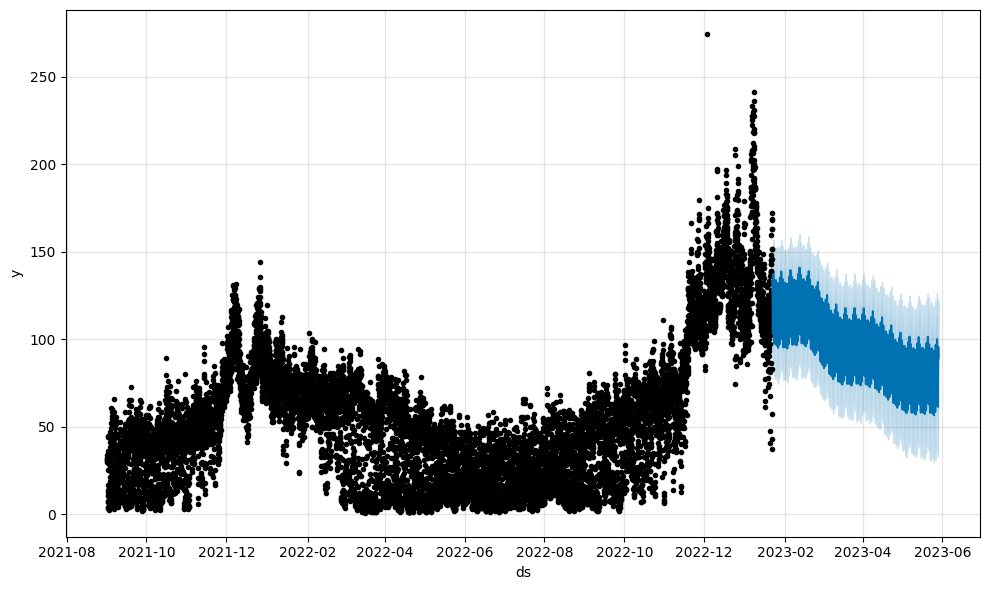

-----------------------------------------------------------------------------------------------------------------
Procesando county: 13, is_business: 1, product_type: 3, is_consumption: 0


17:10:57 - cmdstanpy - INFO - Chain [1] start processing
17:10:58 - cmdstanpy - INFO - Chain [1] done processing


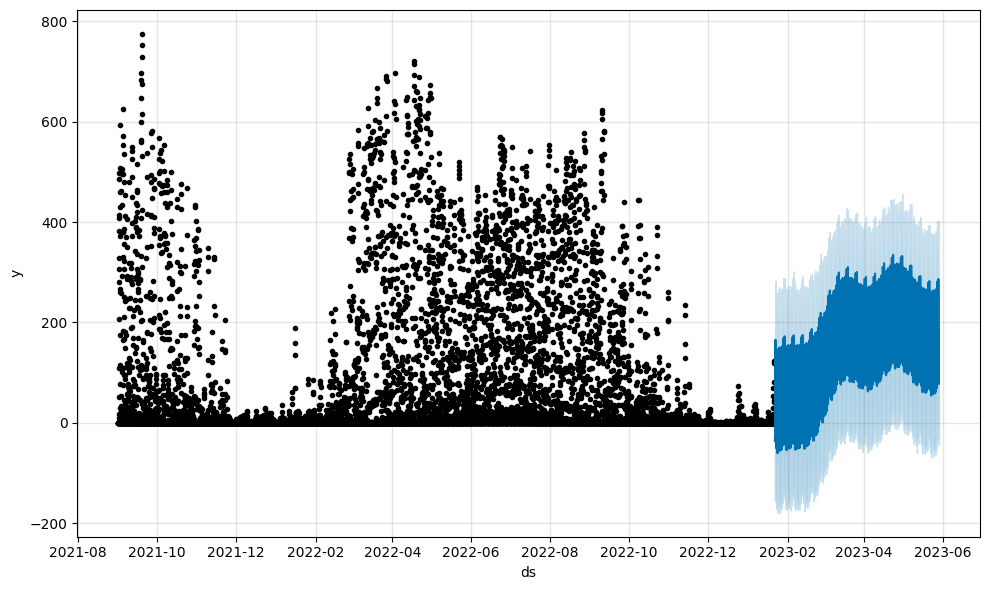

-----------------------------------------------------------------------------------------------------------------
Procesando county: 13, is_business: 1, product_type: 3, is_consumption: 1


17:10:59 - cmdstanpy - INFO - Chain [1] start processing
17:11:01 - cmdstanpy - INFO - Chain [1] done processing


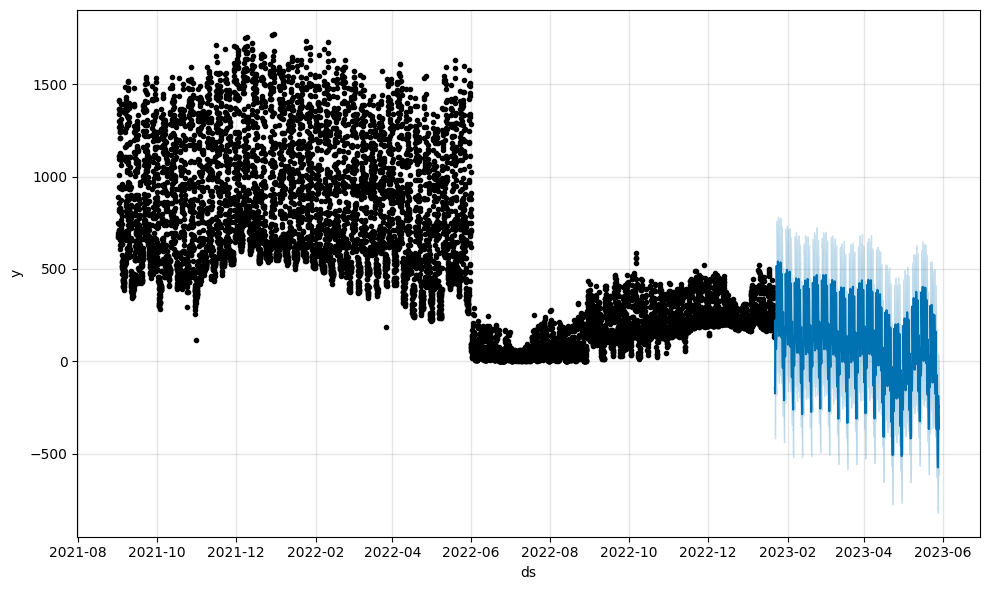

-----------------------------------------------------------------------------------------------------------------
Procesando county: 14, is_business: 0, product_type: 1, is_consumption: 0


17:11:02 - cmdstanpy - INFO - Chain [1] start processing
17:11:03 - cmdstanpy - INFO - Chain [1] done processing


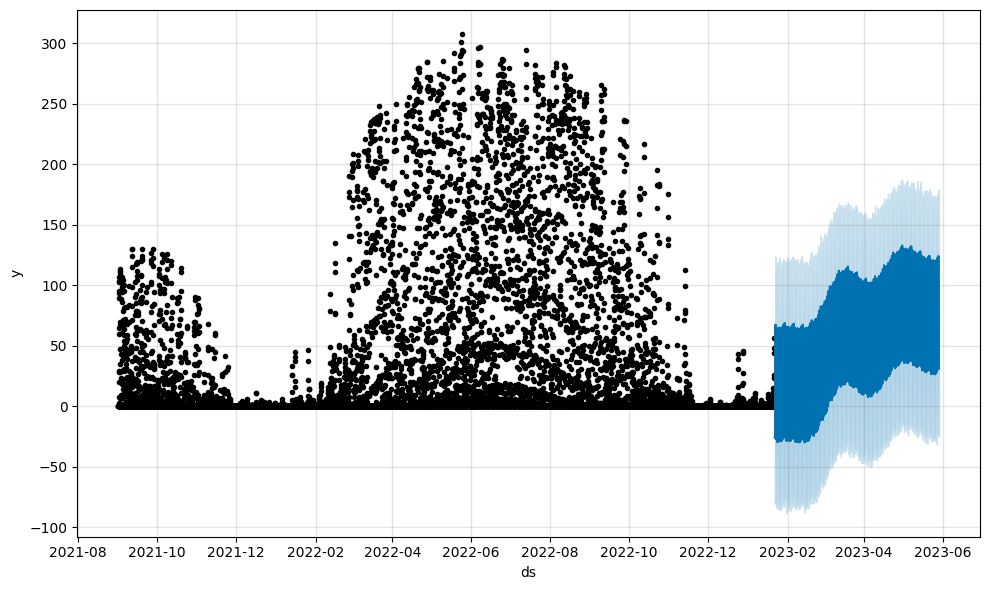

-----------------------------------------------------------------------------------------------------------------
Procesando county: 14, is_business: 0, product_type: 1, is_consumption: 1


17:11:05 - cmdstanpy - INFO - Chain [1] start processing
17:11:07 - cmdstanpy - INFO - Chain [1] done processing


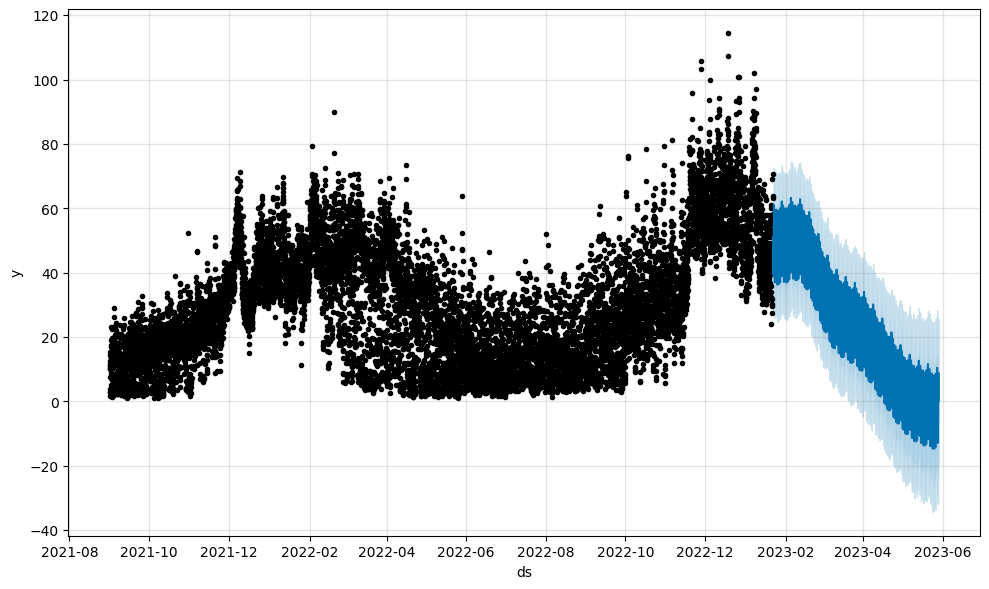

-----------------------------------------------------------------------------------------------------------------
Procesando county: 14, is_business: 0, product_type: 3, is_consumption: 0


17:11:09 - cmdstanpy - INFO - Chain [1] start processing
17:11:10 - cmdstanpy - INFO - Chain [1] done processing


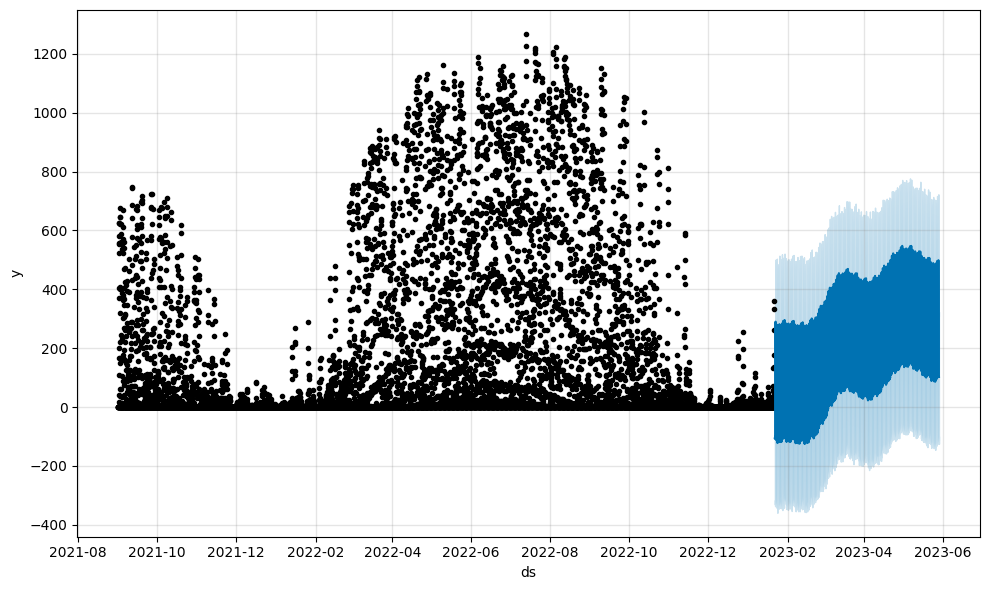

-----------------------------------------------------------------------------------------------------------------
Procesando county: 14, is_business: 0, product_type: 3, is_consumption: 1


17:11:11 - cmdstanpy - INFO - Chain [1] start processing
17:11:13 - cmdstanpy - INFO - Chain [1] done processing


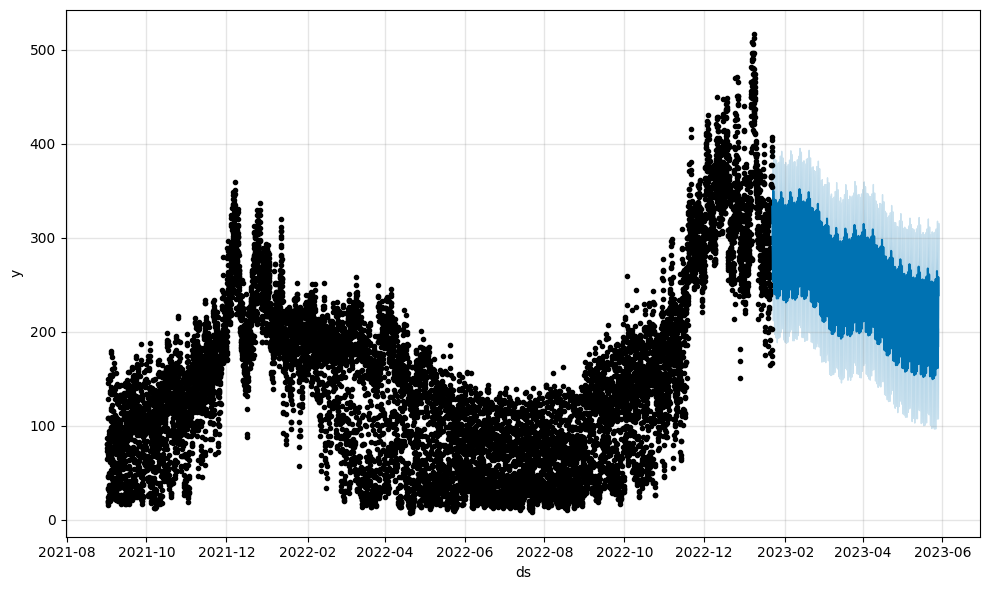

-----------------------------------------------------------------------------------------------------------------
Procesando county: 14, is_business: 1, product_type: 1, is_consumption: 0


17:11:15 - cmdstanpy - INFO - Chain [1] start processing
17:11:16 - cmdstanpy - INFO - Chain [1] done processing


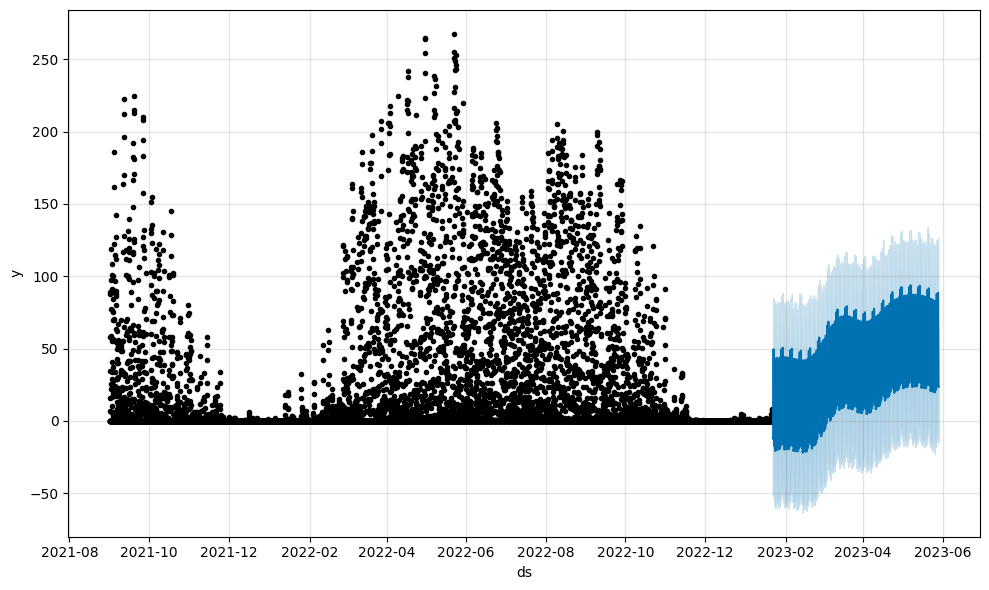

-----------------------------------------------------------------------------------------------------------------
Procesando county: 14, is_business: 1, product_type: 1, is_consumption: 1


17:11:17 - cmdstanpy - INFO - Chain [1] start processing
17:11:19 - cmdstanpy - INFO - Chain [1] done processing


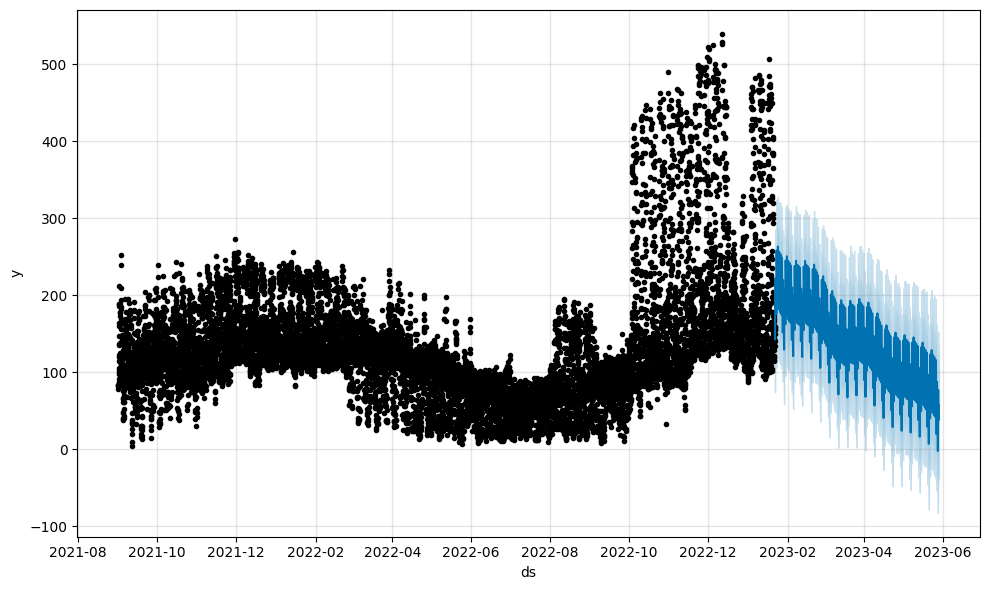

-----------------------------------------------------------------------------------------------------------------
Procesando county: 14, is_business: 1, product_type: 3, is_consumption: 0


17:11:21 - cmdstanpy - INFO - Chain [1] start processing
17:11:22 - cmdstanpy - INFO - Chain [1] done processing


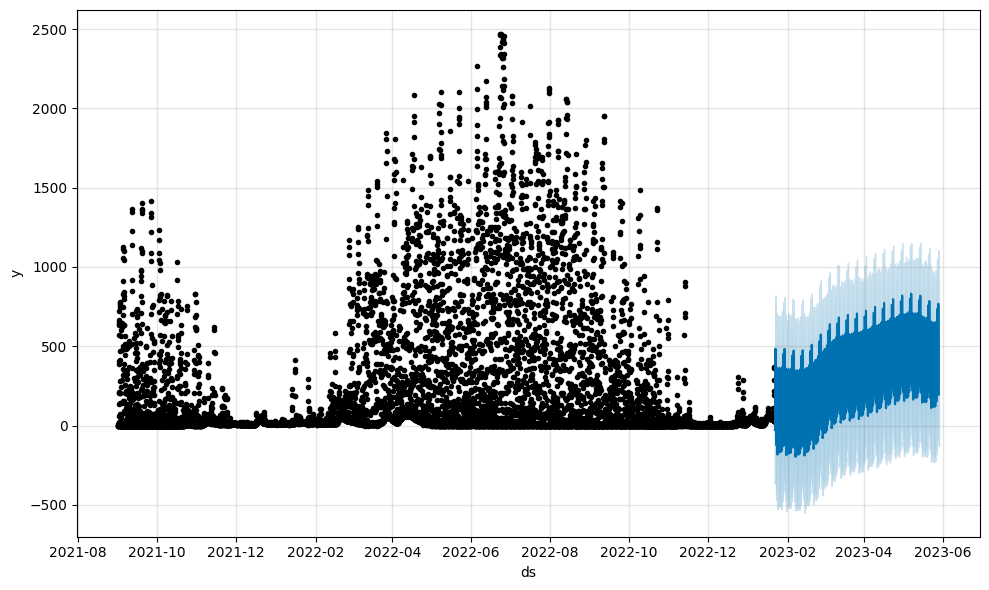

-----------------------------------------------------------------------------------------------------------------
Procesando county: 14, is_business: 1, product_type: 3, is_consumption: 1


17:11:23 - cmdstanpy - INFO - Chain [1] start processing
17:11:25 - cmdstanpy - INFO - Chain [1] done processing


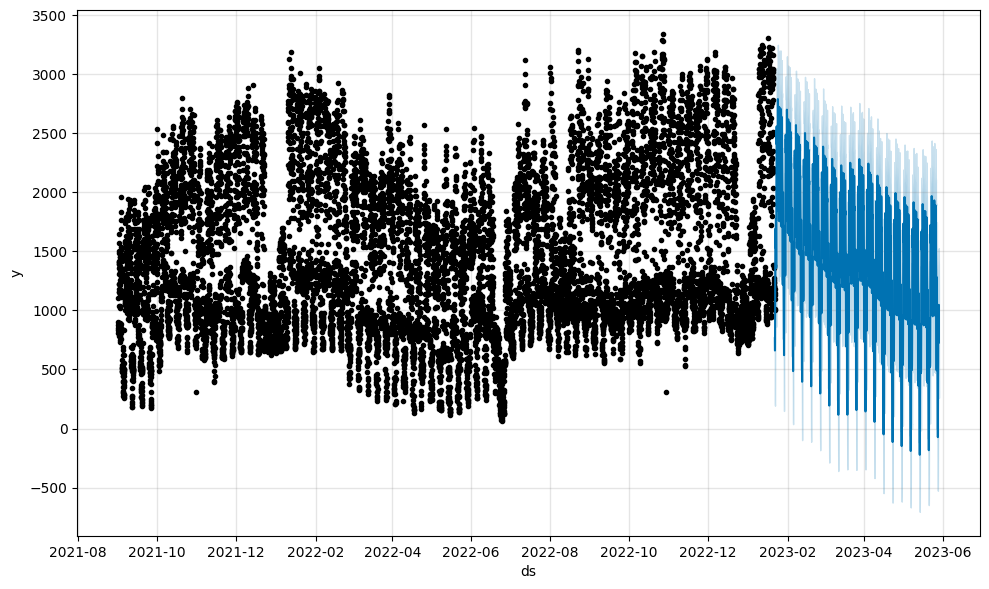

-----------------------------------------------------------------------------------------------------------------
Procesando county: 15, is_business: 0, product_type: 1, is_consumption: 0


17:11:26 - cmdstanpy - INFO - Chain [1] start processing
17:11:28 - cmdstanpy - INFO - Chain [1] done processing


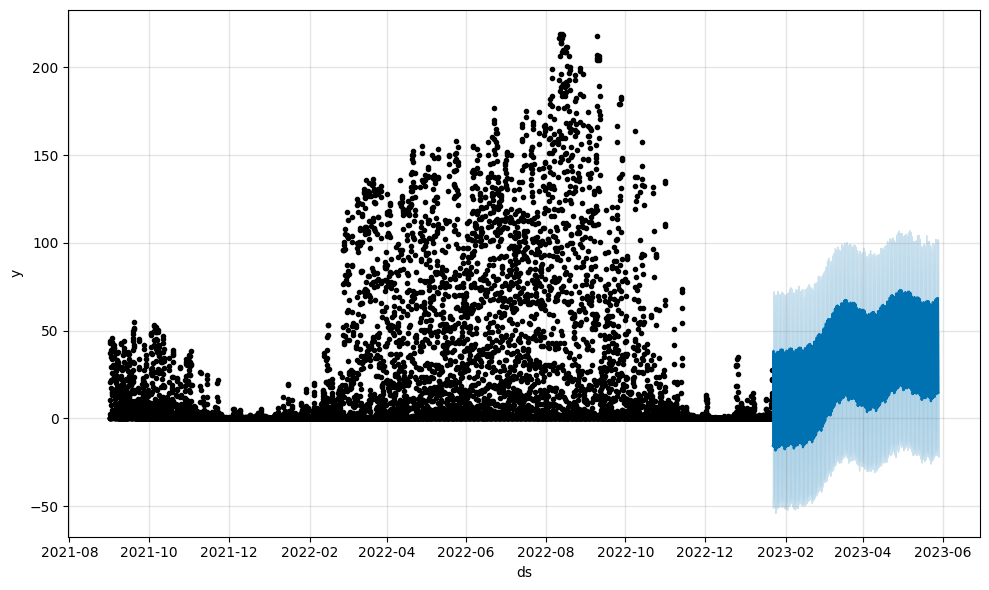

-----------------------------------------------------------------------------------------------------------------
Procesando county: 15, is_business: 0, product_type: 1, is_consumption: 1


17:11:30 - cmdstanpy - INFO - Chain [1] start processing
17:11:33 - cmdstanpy - INFO - Chain [1] done processing


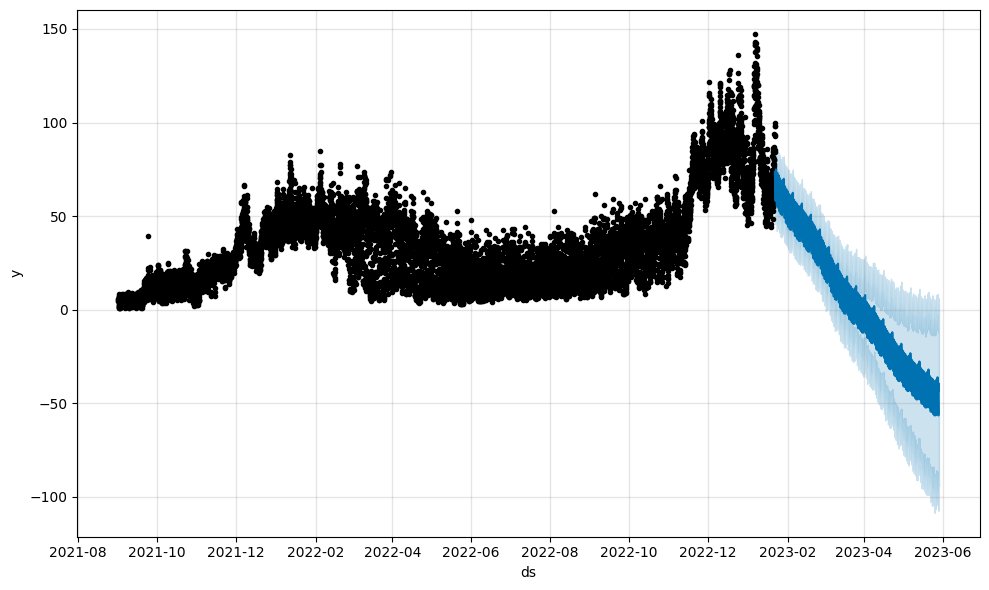

-----------------------------------------------------------------------------------------------------------------
Procesando county: 15, is_business: 0, product_type: 3, is_consumption: 0


17:11:35 - cmdstanpy - INFO - Chain [1] start processing
17:11:35 - cmdstanpy - INFO - Chain [1] done processing


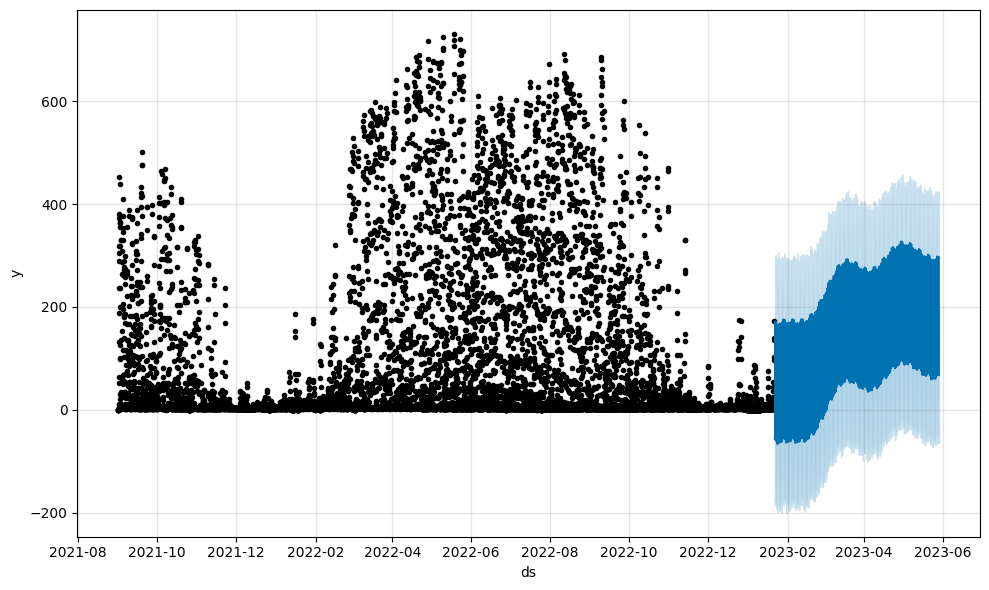

-----------------------------------------------------------------------------------------------------------------
Procesando county: 15, is_business: 0, product_type: 3, is_consumption: 1


17:11:37 - cmdstanpy - INFO - Chain [1] start processing
17:11:40 - cmdstanpy - INFO - Chain [1] done processing


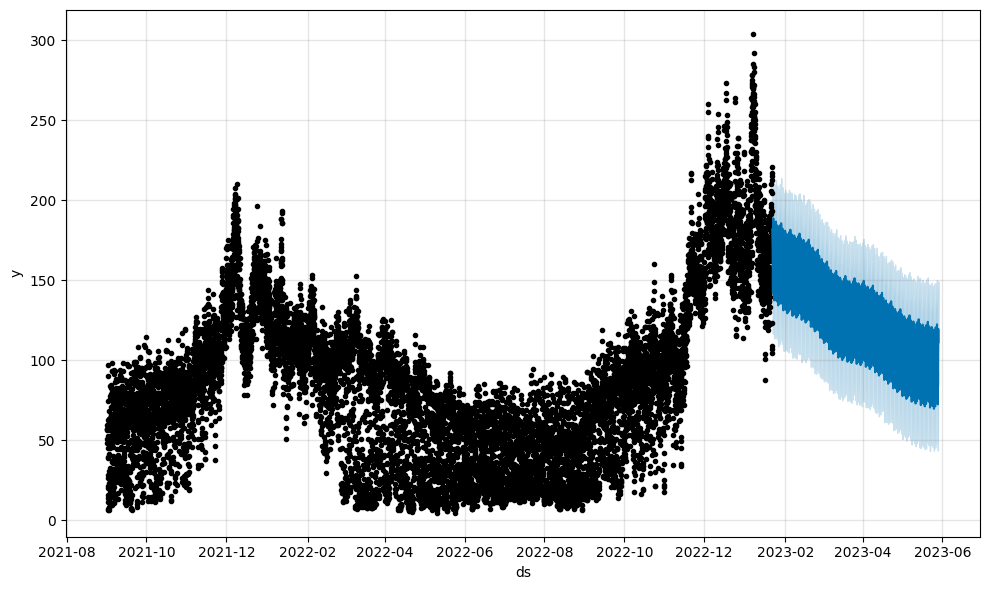

-----------------------------------------------------------------------------------------------------------------
Procesando county: 15, is_business: 1, product_type: 1, is_consumption: 0


17:11:42 - cmdstanpy - INFO - Chain [1] start processing
17:11:43 - cmdstanpy - INFO - Chain [1] done processing


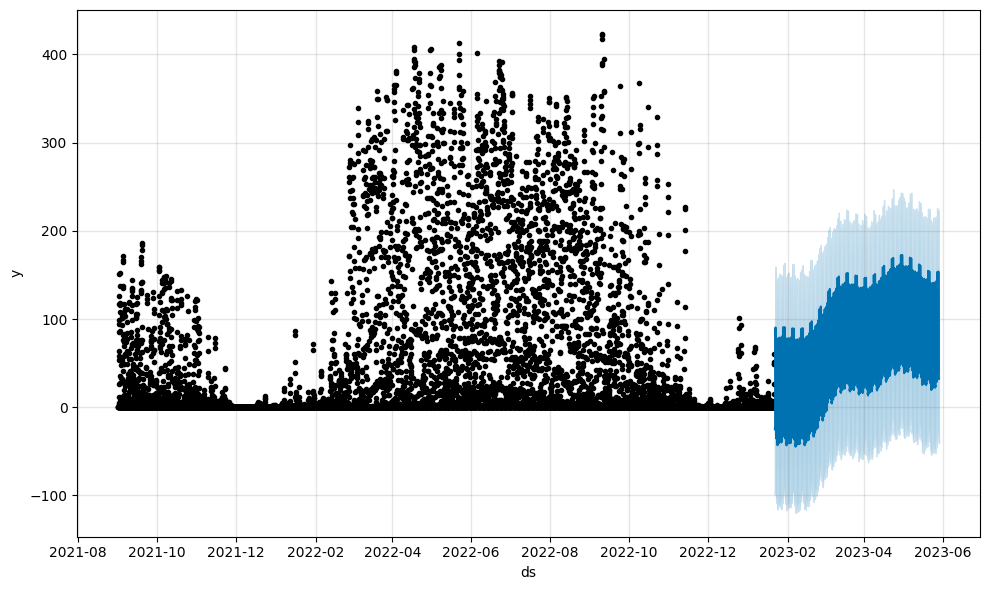

-----------------------------------------------------------------------------------------------------------------
Procesando county: 15, is_business: 1, product_type: 1, is_consumption: 1


17:11:44 - cmdstanpy - INFO - Chain [1] start processing
17:11:47 - cmdstanpy - INFO - Chain [1] done processing


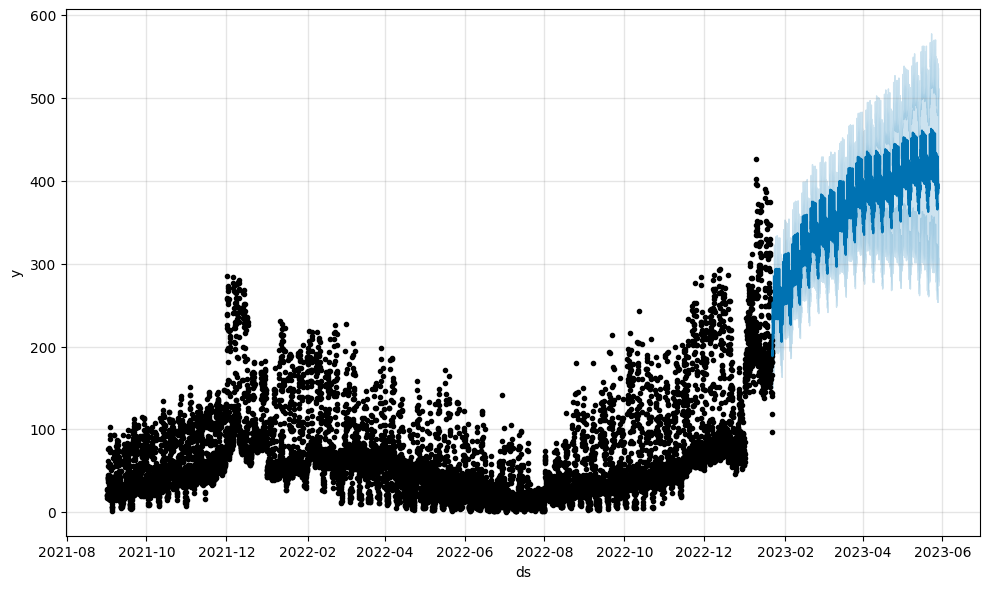

-----------------------------------------------------------------------------------------------------------------
Procesando county: 15, is_business: 1, product_type: 3, is_consumption: 0


17:11:48 - cmdstanpy - INFO - Chain [1] start processing
17:11:49 - cmdstanpy - INFO - Chain [1] done processing


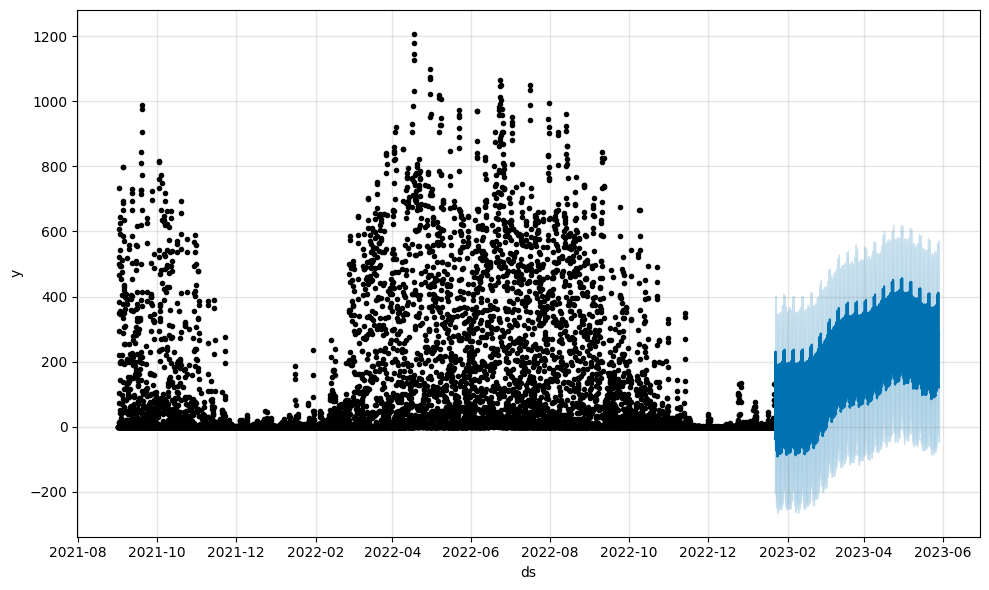

-----------------------------------------------------------------------------------------------------------------
Procesando county: 15, is_business: 1, product_type: 3, is_consumption: 1


17:11:51 - cmdstanpy - INFO - Chain [1] start processing
17:11:54 - cmdstanpy - INFO - Chain [1] done processing


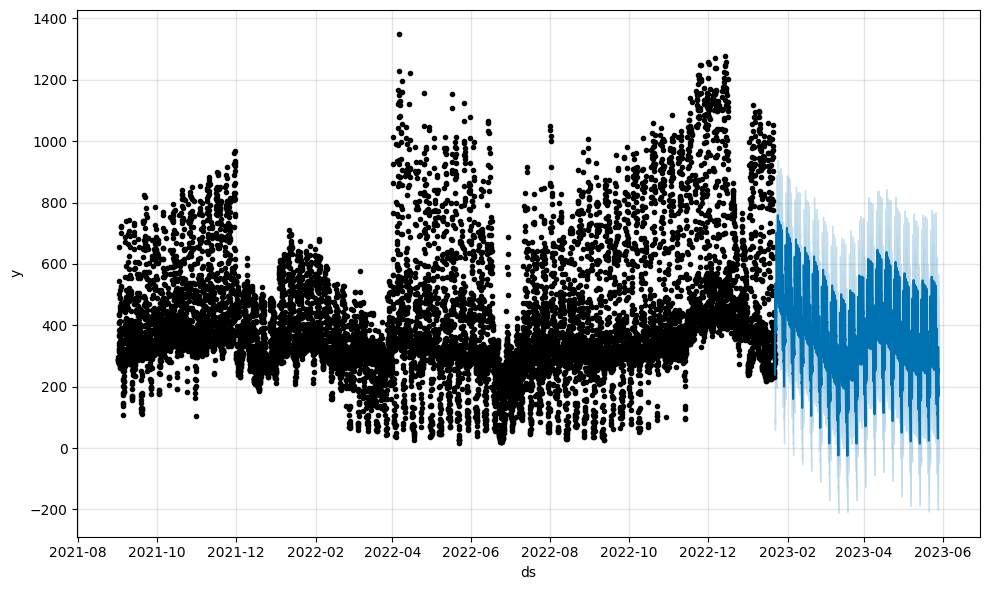

In [14]:
resultados = info_modelling(data=data_model_all, unique_combinations=unique_combinations, cols_to_group=cols_to_group, target='target')

In [15]:
resultados

,county,is_business,product_type,is_consumption,MAE
0,0,0,1,0,386.023238
1,0,0,1,1,303.22471
2,0,0,2,0,13.731783
3,0,0,2,1,12.623315
4,0,0,3,0,1208.246095
...,...,...,...,...,...
107,15,0,3,1,33.226693
108,15,1,1,0,55.608956
109,15,1,1,1,230.13918
110,15,1,3,0,145.414799


In [16]:
resultados.to_csv('../data/resultados_prophet.csv', index=False)